# Explication du projet

L'agence Santé publique France souhaite améliorer la base de données Open Food Facts, une base collaborative et ouverte qui recense des informations détaillées sur des milliers de produits alimentaires vendus en France et dans le monde. En particulier, la base compile des données comme la composition nutritionnelle, les ingrédients, les labels, les allergènes, et bien d’autres attributs des produits et constitue donc une ressource précieuse pour la recherche et la transparence envers les consommateurs.

Actuellement, l'ajout d'un produit dans la base Open Food Facts nécessite de remplir de nombreux champs manuellement, ce qui peut entraîner des erreurs de saisie, des incohérences et des valeurs manquantes limitant la qualité des données. L'objectif est de nettoyer et d'explorer les données dans le but de créer un système de suggestion ou d'auto-complétion pour simplifier ce processus.

Dans ce contexte, l'agence Santé publique France souhaite mener un projet visant à nettoyer, structurer et explorer les données existantes pour mieux comprendre les principales sources d’erreurs et les patterns manquants. L’objectif est de développer un système intelligent de suggestion ou d’auto-complétion qui, à partir de données partielles, pourra proposer automatiquement des valeurs cohérentes et pertinentes lors de la saisie d’un nouveau produit. Cette approche permettra de faciliter la contribution, d’améliorer la qualité globale des données, et de rendre la base plus accessible aux utilisateurs professionnels comme aux citoyens.

# Sommaire
- [1 Explication du projet](#Explication-du-projet)
- [2 Sommaire](#Sommaire)
- [3 Import](#Import-des-bibliothèques-et-des-données)
- [4 Exploration du fichier](#Exploration-du-fichier)
- [5 Identification de la variable cible](#Identification-de-la-variable-cible)
- [6 Identification des variables pertinentes à garder](#Identification-des-variables-pertinentes-a-garder)
- [7 Filtre sur les lignes de la table](#Filtre-sur-les-lignes-de-la-table)
- [8 Fonction d'automatisation](#Fonction-d'automatisation)
- [9 Filtre sur les lignes de la table](#Filtre-sur-les-lignes-de-la-table)
- [10 Identification et gestion des valeurs aberrantes](#Identification-et-gestion-des-valeurs-aberrantes)
- [11 Gestion des valeurs manquantes](#Gestions-des-valeurs-manquantes)
- [12 Analyse univariée](#Analyse-univariée)
- [13 Analyses bivariées](#Analyses-bivariée)
- [14 Analyse multivariée](#Analyses-multivariée)
- [15 Conclusions](#Conclusions-et-rapport-d'exploration)

# Import des bibliothèques et des données

## Bibliothèques

In [1]:
# Imports standard
import warnings
from itertools import combinations

# Affichage
from IPython.display import display, HTML

# Manipulation de données
import numpy as np
import pandas as pd
from pandas.api.types import CategoricalDtype

# Visualisation
import missingno as msno
import matplotlib.pyplot as plt
import plotly.express as px
import seaborn as sns

# Statistiques et tests
import scipy.stats as stats
from scipy.stats import ks_2samp, norm
from statsmodels.stats.multitest import multipletests

# Machine Learning / Préprocessing
from sklearn.decomposition import PCA
from sklearn.impute import KNNImputer
from sklearn.preprocessing import MinMaxScaler, RobustScaler, StandardScaler

In [2]:
# Chargement des données 
Data_Food_brute = pd.read_csv("../Data/fr.openfoodfacts.org.products.csv", sep="\t")

C:\Users\33647\AppData\Local\Temp\ipykernel_61376\663890057.py:2: DtypeWarning: Columns (0,3,5,19,20,24,25,26,27,28,35,36,37,38,39,48) have mixed types. Specify dtype option on import or set low_memory=False.
  Data_Food_brute = pd.read_csv("./data/fr.openfoodfacts.org.products.csv", sep="\t")


In [5]:
Data_Food = Data_Food_brute

# Exploration du fichier

In [4]:
# Visualisation des 5 premières lignes du fichier 
Data_Food.head()

,code,url,creator,created_t,created_datetime,last_modified_t,last_modified_datetime,product_name,generic_name,quantity,...,ph_100g,fruits-vegetables-nuts_100g,collagen-meat-protein-ratio_100g,cocoa_100g,chlorophyl_100g,carbon-footprint_100g,nutrition-score-fr_100g,nutrition-score-uk_100g,glycemic-index_100g,water-hardness_100g
0,3087,http://world-fr.openfoodfacts.org/produit/0000...,openfoodfacts-contributors,1474103866,2016-09-17T09:17:46Z,1474103893,2016-09-17T09:18:13Z,Farine de blé noir,NaN,1kg,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,4530,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Banana Chips Sweetened (Whole),NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,14.0,14.0,NaN,NaN
2,4559,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489069957,2017-03-09T14:32:37Z,1489069957,2017-03-09T14:32:37Z,Peanuts,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,0.0,0.0,NaN,NaN
3,16087,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055731,2017-03-09T10:35:31Z,1489055731,2017-03-09T10:35:31Z,Organic Salted Nut Mix,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,12.0,12.0,NaN,NaN
4,16094,http://world-fr.openfoodfacts.org/produit/0000...,usda-ndb-import,1489055653,2017-03-09T10:34:13Z,1489055653,2017-03-09T10:34:13Z,Organic Polenta,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [5]:
# Nombre d'observation et de variables
Data_Food.shape

(320772, 162)

In [6]:
# Calcule du nombre de variables par type
Data_Food.dtypes.value_counts()

float64    106
object      56
Name: count, dtype: int64

In [7]:
# Ajustement de la taille d'affichage de la zone résultats pour éviter que cette visualisation ne prenne trop de place
display(HTML("<style>.output_scroll {height: 400px; overflow-y: auto;}</style>"))

# Visualisation de tous les noms de variables
for i in Data_Food.columns.values :
    print(i)

code
url
creator
created_t
created_datetime
last_modified_t
last_modified_datetime
product_name
generic_name
quantity
packaging
packaging_tags
brands
brands_tags
categories
categories_tags
categories_fr
origins
origins_tags
manufacturing_places
manufacturing_places_tags
labels
labels_tags
labels_fr
emb_codes
emb_codes_tags
first_packaging_code_geo
cities
cities_tags
purchase_places
stores
countries
countries_tags
countries_fr
ingredients_text
allergens
allergens_fr
traces
traces_tags
traces_fr
serving_size
no_nutriments
additives_n
additives
additives_tags
additives_fr
ingredients_from_palm_oil_n
ingredients_from_palm_oil
ingredients_from_palm_oil_tags
ingredients_that_may_be_from_palm_oil_n
ingredients_that_may_be_from_palm_oil
ingredients_that_may_be_from_palm_oil_tags
nutrition_grade_uk
nutrition_grade_fr
pnns_groups_1
pnns_groups_2
states
states_tags
states_fr
main_category
main_category_fr
image_url
image_small_url
energy_100g
energy-from-fat_100g
fat_100g
saturated-fat_100g
butyr

# Identification de la variable cible

Pour étudier la faisabilité de l'application d'autosuggestion, on cherche une variable catégorielle qui a beaucoup de valeurs manquantes afin de cibler les variables les plus problématiques de la base. On va donc s'intéresser aux variables qui ont moins de 50% de valeurs présentes 

In [8]:
# Identification des variables catégorielles avec plus de 50% de données manquantes 
Candidate_Cibles = Data_Food.columns.values[(Data_Food.isnull().mean() > 0.50) & (Data_Food.dtypes=="object")]

<Axes: >

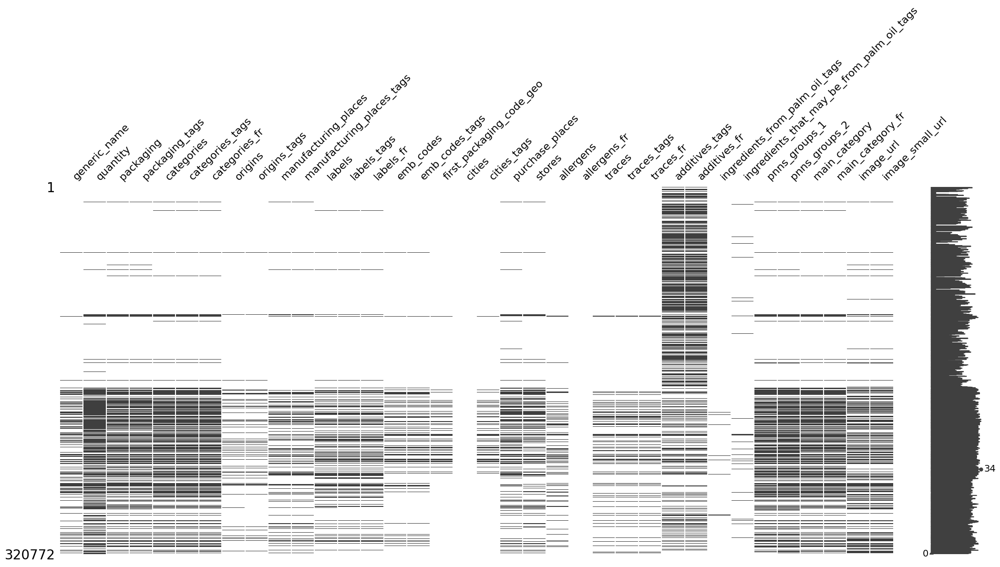

In [9]:
# Visualisation du taux de valeurs manquantes des variables candidates
msno.matrix(Data_Food[Candidate_Cibles])

Pour étudier la faisabilité de l'application d'autosuggestion, on va choisir une variable avec peu de catégories afin de garantir un nombre suffisant de produits dans chacune des catégories. Une catégorie avec peu de données sera plus difficile à prédire. 

In [10]:
Data_Food[Candidate_Cibles].nunique()

generic_name                                  38584
quantity                                      13826
packaging                                     14547
packaging_tags                                12064
categories                                    36982
categories_tags                               21142
categories_fr                                 21152
origins                                        4840
origins_tags                                   4372
manufacturing_places                           7308
manufacturing_places_tags                      6736
labels                                        18114
labels_tags                                   13653
labels_fr                                     13655
emb_codes                                      8462
emb_codes_tags                                 8158
first_packaging_code_geo                       1602
cities                                            3
cities_tags                                    2572
purchase_pla

On remarque la variable pnns_group_1 qui contient peu de catégorie. On va regarder ce que cette variable contient. 

In [11]:
Data_Food['pnns_groups_1'].value_counts()

pnns_groups_1
unknown                    22624
Sugary snacks              12368
Beverages                   9033
Milk and dairy products     8825
Cereals and potatoes        8442
Fish Meat Eggs              8041
Composite foods             6747
Fruits and vegetables       5908
Fat and sauces              5216
Salty snacks                2809
fruits-and-vegetables        987
sugary-snacks                496
cereals-and-potatoes          16
salty-snacks                   1
Name: count, dtype: int64

On remarque que certaines catégories sont présentes deux fois orthographiés différements :
- Cereals and potatoes
- Fruits and vegetables
- Salty snacks
- Sugary snacks

Il faudra modifier les valeurs mal orthographiées dans le jeu de données. Ce sera une première étape de nettoyage à réaliser.

In [12]:
Variable_cible = "pnns_groups_1"

# Identification des variables pertinentes à garder

Afin de prédire les valeurs de la variable pnns_group_1, on cherche des variables qui ont moins de 50% de données manquantes de manière à avoir un ensemble de données suffisamment complet et représentatif pour entraîner un modèle fiable.

In [13]:
Data_Food.columns.values[(Data_Food.isnull().mean() < 0.50) ]

array(['code', 'url', 'creator', 'created_t', 'created_datetime',
       'last_modified_t', 'last_modified_datetime', 'product_name',
       'brands', 'brands_tags', 'countries', 'countries_tags',
       'countries_fr', 'ingredients_text', 'serving_size', 'additives_n',
       'additives', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'states', 'states_tags', 'states_fr', 'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g',
       'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
       'nutrition-score-fr_100g', 'nutrition-score-uk_100g'], dtype=object)

Afin de pouvoir prédire les valeurs de la variable pnns_group_1, on va utiliser des variables qui pourraient avoir un lien avec cette variable. Plusieurs variables semblent intéressantes (variables liées aux valeurs nutritives, aux ingrédients, à la marque, aux nombre d'additifs..).

In [14]:
Candidate_Features=['brands', 'brands_tags','ingredients_text', 'serving_size', 'additives_n',
       'additives', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n', 'nutrition_grade_fr',
       'energy_100g', 'fat_100g',
       'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g',
       'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
       'nutrition-score-fr_100g']

Afin d'être sûres que ces variables sont pertinente on va regarder un peu plus ce qu'elle contiennent

In [15]:
# Ajustement de la taille d'affichage de la zone résultats pour éviter que cette visualisation ne prenne trop de place
display(HTML("<style>.output_scroll {height: 400px; overflow-y: auto;}</style>"))

# Visulisation des différentes valeurs prises par les différentes variables 
for i in Candidate_Features:
    print(f"{i} \n {Data_Food[i].value_counts()} \n")

brands 
 brands
Carrefour       2978
Auchan          2340
U               2050
Meijer          1995
Leader Price    1700
                ... 
Tanka Bites        1
Tanka Trail        1
Tram Bar Llc       1
Betsy Ann          1
乐吧                 1
Name: count, Length: 58784, dtype: int64 

brands_tags 
 brands_tags
carrefour               3149
auchan                  2468
u                       2082
meijer                  1996
leader-price            1899
                        ... 
natural-motives-llc        1
wheatless-in-seattle       1
hamptan-creek              1
hampto,just-mayo           1
乐吧                         1
Name: count, Length: 50253, dtype: int64 

ingredients_text 
 ingredients_text
Carbonated water, natural flavor.                                                                                                                                                                                                                                 222
Almonds.                

- Les variables ingredients_text, additives, marques et serving_size paraissent compliquée à analyser et a intégrer dans un modèle d'apprentissage (beaucoup de catégories dont beaucoup avec une seule valeur unique), nous allons les exclures de l'analyse. 
- L'ensemble des variatbles nutritves apparaissent intéressantes
- L'ensemble des variables sur le nombre d'additifs et d'aliments dérivant d'huile de palme paraissent aussi intéressantes

In [16]:
Selected_Features = [i for i in Candidate_Features if i not in ['brands_tags', 'brands', 'additives',  'ingredients_text', 'serving_size']]
Selected_Features

['additives_n',
 'ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n',
 'nutrition_grade_fr',
 'energy_100g',
 'fat_100g',
 'saturated-fat_100g',
 'carbohydrates_100g',
 'sugars_100g',
 'fiber_100g',
 'proteins_100g',
 'salt_100g',
 'sodium_100g',
 'nutrition-score-fr_100g']

# Filtre sur les lignes de la table

## Filtre sur les lignes qui n'ont que des valeurs manquantes

On va éliminer toutes les lignes qui ne contiendraient que des valeurs manquantes sur les variables sélectionnées.  
D'abord on regarde combien de produits sont concernés. Le filtre sera effectué à l'aide d'une fonction qui sera définit à l'étape d'après.

In [17]:
# Calcul du nombre de produits qui n'ont pas de données sur l'ensemble des variables selectionnées
Data_Food[Selected_Features].isna().all(axis=1).sum()

44575

## Filtre pour éliminer les doublons de produits

On va également éliminer les produits dupliqués. Un produit est dupliqué si le code qui lui est associé est présent plus d'une fois dans le jeu de données. Le filtre sera effectué à l'aide d'une fonction qui sera définit à l'étape d'après.

In [18]:
Data_Food.duplicated(subset=['code']).mean()*100

0.04146247178681431

# Fonction d'automatisation

Ecriture d'une fonction qui automatise toutes les étapes de nettoyage vues précédemment

In [19]:
def nettoyage1(df) :
    
    """
    Effectue un nettoyage et une préparation initiale des données produits, incluant la correction d'étiquettes,
    la suppression des doublons, le filtrage des valeurs manquantes et la visualisation du taux de remplissage des variables.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données brutes produits, incluant au moins les colonnes 'code', 'product_name', 'main_category_fr',
        la variable cible (nommée dans la variable globale `Variable_cible`) et les variables listées dans `Selected_Features`.

    Retourne
     - Df_filt (pandas.DataFrame): DataFrame nettoyée et filtrée, contenant les variables sélectionnées et sans valeurs manquantes ou inconnues pour la variable cible.
     - Df_corrected (pandas.DataFrame): Copie de df après correction des catégories mal orthographiées et suppression des doublons sur la colonne 'code'.
     - Variable_cible_value (pandas.Series): Série correspondant à la variable cible extraite de Df_filt.
    """

    # Correction des catéogies mal orthographiées
    df.loc[df[Variable_cible]=="fruits-and-vegetables", Variable_cible] = 'Fruits and vegetables'
    df.loc[df[Variable_cible]=="cereals-and-potatoes", Variable_cible] = 'Cereals and potatoes'
    df.loc[df[Variable_cible]=="sugary-snacks", Variable_cible] = 'Sugary snacks'
    df.loc[df[Variable_cible]=="salty-snacks", Variable_cible] = 'Salty snacks'    
 
    # Copie de la dataframe
    Df_corrected = df.copy() 
    
    # Supression des lignes correspondant à des produits dupliquées
    Df_corrected = Df_corrected.drop_duplicates(subset=['code'], keep=False)
    
    # Filtre du tableau pour éliminer les lignes avec valeurs nulles ou inconnue pour la variable cible
    Df_filt = Df_corrected[(Df_corrected[Variable_cible].notnull()) & (Df_corrected[Variable_cible]!='unknown')].copy()
    
    # Extraction de la variable cible
    Variable_cible_value = Df_filt[Variable_cible]
    
    # Elimination de la variable cible du jeu de données
    Df_filt.drop(columns=Variable_cible, inplace=True)

    # Selection des variables code, product_name et main category et des variables selectionnées 
    Final_variable = ['code', 'product_name', 'main_category_fr'] + Selected_Features 
    Df_filt=Df_filt[Final_variable]
    
    # Filtre pour enlever toutes les lignes qui n'ont que des valeurs nulles sur les variables selectionné
    Df_filt= Df_filt[~Df_filt[Selected_Features].isna().all(axis=1)]
    
    # Création d'une dataframe indiquant le taux de valeurs manquantes par variables en pourcentage
    Df_remplissage = pd.DataFrame(Df_filt.isnull().mean()*100).reset_index()

    # Attribution d'un nom  a chacune des variables de la dataframe
    Df_remplissage.columns = ['Variable', 'Taux_Valeurs_manquantes']

    # Calcul du taux de remplissage
    Df_remplissage['Taux_remplissage'] = 100 - Df_remplissage['Taux_Valeurs_manquantes']

    # Tri de la data frame pour classer les variables en fonction de leurs taux de valeurs manquantes
    Df_remplissage = Df_remplissage.sort_values(['Taux_remplissage'], ascending=False)

    # Visualisation du taux de remplissage par variables
    plt.figure(figsize=(12,5))
    plt.xticks(rotation=90)
    plt.title('Taux de remplissage des variables')
    sns.barplot(x= 'Variable', y='Taux_remplissage', data=Df_remplissage, color = 'lavender')
  
    return Df_filt, Df_corrected, Variable_cible_value

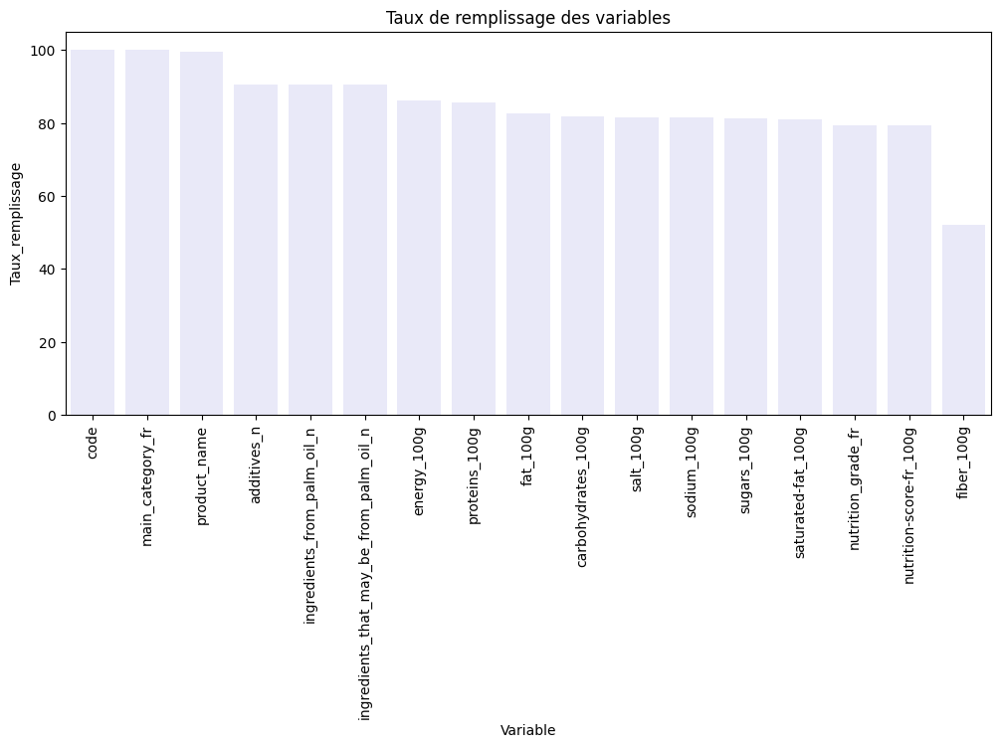

In [20]:
# Définition de la variable cible et des variables prédictives
Variable_cible = 'pnns_groups_1'
Selected_Features = ['additives_n','ingredients_from_palm_oil_n',
 'ingredients_that_may_be_from_palm_oil_n','nutrition_grade_fr',
 'energy_100g', 'fat_100g','saturated-fat_100g', 'carbohydrates_100g',
 'sugars_100g', 'fiber_100g','proteins_100g','salt_100g',
 'sodium_100g', 'nutrition-score-fr_100g']

# Appel de la fonction 
Data_Food2, Data_Food, Variable_cible_value = nettoyage1(Data_Food)

# Identification et gestion des valeurs aberrantes

Avant d'étudier la faisabilité du projet, il sera important d'identifier et de traiter les valeurs aberrantes qui seraient susceptibles de compromettre la fiabilité de l’application. Différentes méthodologie vont être appliquées.

## Identification des valeurs aberrantes : Etape 1 (etude globale)

On peut dans un premier temps visualiser la présence d'outlier avec un boxplot 

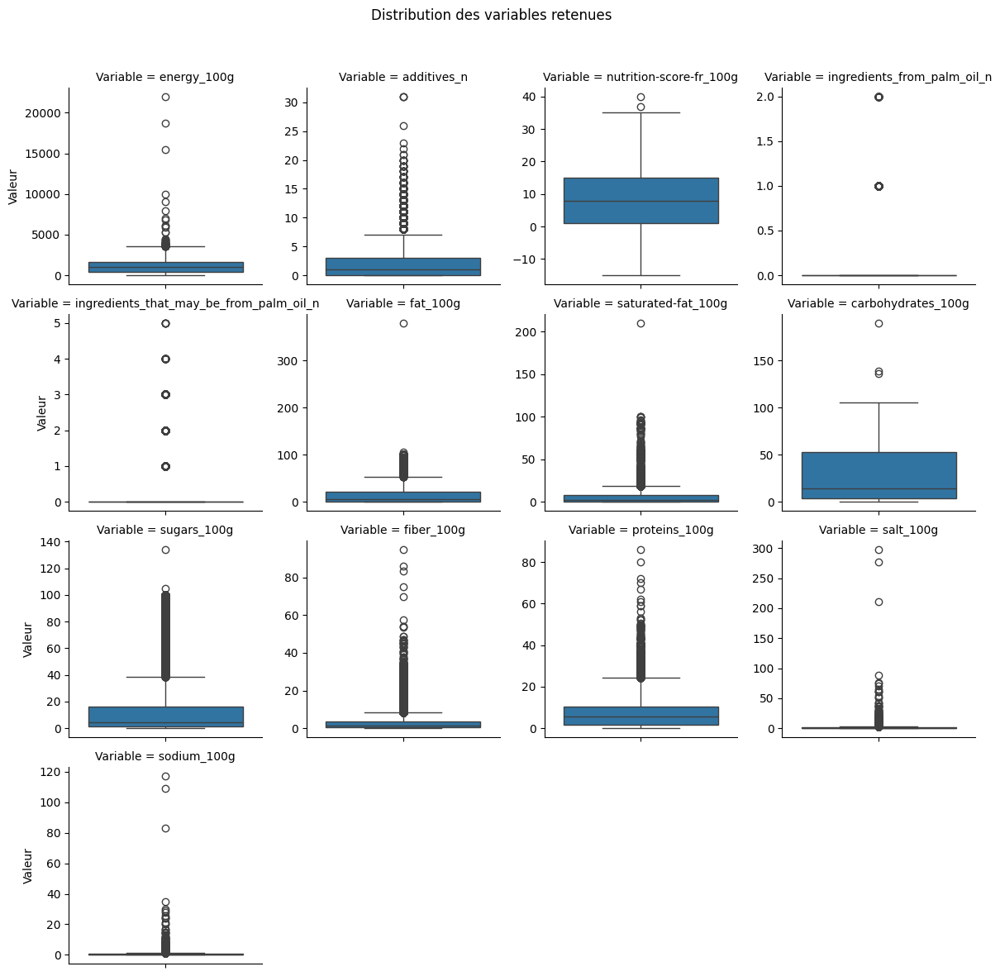

In [21]:
# Création d'une liste contenant les variables que l'on souhaite visualiser dans les boxplots
Selected_Features= ['energy_100g','additives_n', 'nutrition-score-fr_100g', 
                    'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
                    'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
                    'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']

# Selection des variables que l'on souhaite visualiser dans les boxplots
Data_Food_boxplot = Data_Food2[['code'] + Selected_Features]

# Reformatage de la table pour pouvoir visualiser les boxplot en grille 
Data_Food_boxplot = Data_Food_boxplot.melt(id_vars=['code'], 
                                  var_name="Variable", value_name="Valeur")

# Construciton des boxplots
g = sns.FacetGrid(Data_Food_boxplot, col="Variable", col_wrap=4, sharey=False, height=3)
g.map_dataframe(sns.boxplot, y="Valeur")
g.fig.suptitle('Distribution des variables retenues')
g.fig.subplots_adjust(top=0.9)
plt.show()

On repère un grand nombre d'outlier pour les différentes variables selectionnées. Afin de pouvoir comptabiliser et visualiser l'ensemble des données correspondants à ces outliers on peut travailler sur un tableau descriptif des données. On va utiliser la méthode describe et y ajouter d'autres informations comme l'IQR, ainsi que les limites hautes et basses au dela desquelles une valeurs correspond à un outlier. Ce tableau permettra de comptabiliser les outliers et de repérer les valeurs qui sont réellement aberrantes

In [22]:
def tab_desc(df, Selected_Features):
    """
    Génère une table descriptive des variables sélectionnées dans un DataFrame, 
    incluant les statistiques classiques, l'IQR, les limites pour détecter les outliers, 
    ainsi que le nombre et la proportion d'outliers par variable.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données à décrire.
     - Selected_Features (list of str): Liste des noms de colonnes numériques à analyser.

    Sortie
     - df_des (pandas.DataFrame): DataFrame descriptive transposée avec pour chaque variable :
        - statistiques classiques (count, mean, std, min, 25%, 50%, 75%, max)
        - IQR (intervalle interquartile)
        - limites basse et haute pour détection d'outliers (1.5 * IQR en dessous du 1er quartile et au-dessus du 3e quartile)
        - nombre d'outliers détectés
        - proportion d'outliers (en pourcentage arrondi)
    """
    
    # Création d'une tables descriptives des données et transposition pour pouvoir y ajouter des informations
    df_des = df[Selected_Features].describe().T

    # Ajout de l'IQR et des limites hautes et basses pour identifier les outliers
    df_des['IQR'] = df_des['75%'] - df_des['25%']
    df_des['Lim basse'] = df_des['25%'] - 1.5*df_des['IQR']
    df_des['Lim haute'] = df_des['75%'] + 1.5*df_des['IQR']
        
    # Ajout du nombre et de la proportion d'outlier 
    for feat in Selected_Features:
        nombre_outlier = df[(df[feat] < df_des.loc[feat, 'Lim basse']) | (df[feat] > df_des.loc[feat, 'Lim haute'])].shape[0]
        prop_outlier = round(nombre_outlier/df.shape[0],2)*100
        df_des.loc[feat, 'n_outlier'] = nombre_outlier
        df_des.loc[feat, 'prop_outlier'] = prop_outlier
    
    return df_des


In [23]:
# # Création d'une liste contenant les variables que l'on souhaite analyser
Selected_Features= ['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n',
       'energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition-score-fr_100g']

# Appel de la fonction pour obtenir le tableau descriptif
Data_Food_des=tab_desc(Data_Food2, Selected_Features)

# Affichage du tableau descriptif
Data_Food_des.sort_values('prop_outlier', ascending=False)

,count,mean,std,min,25%,50%,75%,max,IQR,Lim basse,Lim haute,n_outlier,prop_outlier
sugars_100g,51836.0,13.087381,18.683077,-0.1,1.0000,4.20000,16.000000,134.000000,15.000000,-21.500000,38.500000,6090.0,10.0
ingredients_that_may_be_from_palm_oil_n,57816.0,0.131157,0.431214,0.0,0.0000,0.00000,0.000000,5.000000,0.000000,0.000000,0.000000,5900.0,9.0
saturated-fat_100g,51632.0,5.424787,8.523674,0.0,0.2000,1.80000,7.522500,210.000000,7.322500,-10.783750,18.506250,3705.0,6.0
ingredients_from_palm_oil_n,57816.0,0.056905,0.235219,0.0,0.0000,0.00000,0.000000,2.000000,0.000000,0.000000,0.000000,3242.0,5.0
salt_100g,51992.0,0.878326,2.639437,0.0,0.0508,0.50000,1.200000,297.600000,1.149200,-1.673000,2.923800,2256.0,4.0
sodium_100g,51987.0,0.345828,1.039100,0.0,0.0200,0.19685,0.472441,117.165354,0.452441,-0.658661,1.151102,2255.0,4.0
additives_n,57816.0,1.759409,2.499452,0.0,0.0000,1.00000,3.000000,31.000000,3.000000,-4.500000,7.500000,2224.0,3.0
fat_100g,52664.0,13.549033,17.743865,0.0,1.0000,6.20000,22.000000,380.000000,21.000000,-30.500000,53.500000,1809.0,3.0
fiber_100g,33157.0,2.720981,3.939802,0.0,0.3500,1.60000,3.500000,94.800000,3.150000,-4.375000,8.225000,2147.0,3.0
proteins_100g,54536.0,7.481501,7.317180,0.0,1.5000,5.82500,10.600000,86.000000,9.100000,-12.150000,24.250000,2050.0,3.0


L'étude de ce tableau permet d'identifier un certains nombre d'outlier dont certains correspondant à des valeurs aberrantes (les autres outliers seront discutés à la fin de cette partie): 
- le maximum de 5 variables correspondant à la masse d'un éléments pour 100g du produit est supérieur a 100
- le minimum de de la variable sugars 100g est négative
- le maximum de la variable energy_100g est aussi trop élevé (>3700)

En effet 1 g de graisse fournit 37 kJ (c'est le maximum). Ainsi pour 100g de produit le nombre de kJ ne peut pas excéder 3700. Essayons de comptabiliser le nombre de valeurs aberrantes présentes pour ces variables. 

In [24]:
# Création d'une liste contenant les variables qui ne doivent pas exéceder 100g
Feature_100g = [ 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g']

# Comptage du nombre de valeurs aberrantes pour ces features
for feat in Feature_100g:
    print( f'{feat} : {Data_Food2[(Data_Food2[feat] > 100) | (Data_Food2[feat] < 0)].shape[0]} / {Data_Food2.shape[0]} lignes > 100')

# Comptage du nombre de valeurs aberrantes pour la feature energy_100g
print( f'energy_100g : {Data_Food2[Data_Food2['energy_100g'] > 3700].shape[0]} / {Data_Food2.shape[0]} lignes > 3700')

fat_100g : 3 / 63758 lignes > 100
saturated-fat_100g : 1 / 63758 lignes > 100
carbohydrates_100g : 5 / 63758 lignes > 100
sugars_100g : 3 / 63758 lignes > 100
fiber_100g : 0 / 63758 lignes > 100
proteins_100g : 0 / 63758 lignes > 100
salt_100g : 3 / 63758 lignes > 100
sodium_100g : 2 / 63758 lignes > 100
energy_100g : 131 / 63758 lignes > 3700


Le taux de valeurs aberrantes est minime et nous allons donc remplacer ces valeurs aberrantes par des valeurs manquantes

A la lecture du tableau descriptif on remarque que certaines variables ont une forte proportion d'outlier. Mais est ce que ces outliers correspondent vraiment à des valeurs aberrantes ? Regardons par exemple les outliers identifiés pour la variable sugars_100g. 

In [25]:
# Affichage des lignes avec une quantité de sucre pour 100g > 38
Data_Food2[Data_Food2['sugars_100g']>38].sort_values('sugars_100g', ascending=False)[['product_name', 'sugars_100g', 'main_category_fr']].head(10)

,product_name,sugars_100g,main_category_fr
111566,Tomato Ketchup,134.0,Epicerie
239347,Sirop d'agave,105.0,Produits à tartiner sucrés
183142,Feiner Raffinade Zucker,100.0,Sucres
182281,Fein Zucker,100.0,Sucres
257012,Sucre en poudre,100.0,Sucres
197057,Sucre cristal,100.0,Sucres
270663,Granulated Sugar,100.0,Sucres
270666,Granulated Sugar,100.0,Sucres
287585,Cristal,100.0,Sucres
182282,Puderzucker,100.0,Sucres


On remarque que les outliers avec les plus fortes valeurs de quantité de sucre correpsondent à des sucres. Les outliers identifiés de cette manière ne correspondent donc pas forcément à des valeurs aberrantes. Nous allons donc dans une prochaine étape chercher les outliers par type de produits afin de détecter les anomalies relatives à la catégorie plutôt qu’à l’ensemble des données globales. Cela permettra d’identifier, par exemple, un produit anormalement sucré dans une catégorie généralement peu sucrée, ce qui sera plus pertinent au vu de la nature des données.

## Identification des valeurs aberrantes : étape 2 (en groupant par type de produits)

In [26]:
# Création d'une liste contenant les variables à traiter
Selected_Features= ['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n',
       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition-score-fr_100g', 'energy_100g']

# Transformation du DataFrame en format long pour faciliter l'analyse de plusieurs variables
Data_Food2_melt = Data_Food2.melt(id_vars=['code', 'product_name',  'main_category_fr'],
               value_vars=Selected_Features, var_name='Variable', value_name='Valeur')

# Calcule des statistiques descriptives : moyenne, écart-type, quartiles après groupement par catégorie
Data_Food2_des_nut_grade = Data_Food2_melt.groupby(['main_category_fr', 'Variable']).agg(
    mean=('Valeur', 'mean'),
    std=('Valeur', 'std'),
    Q25=('Valeur', lambda x: x.quantile(0.25)),
    Q50=('Valeur', lambda x: x.quantile(0.50)), 
    Q75=('Valeur', lambda x: x.quantile(0.75)),
).round(2).reset_index()

# Calcul de l'IQR  et des limites basse et haute pour détecter les outliers
Data_Food2_des_nut_grade['IQR'] = Data_Food2_des_nut_grade['Q75'] - Data_Food2_des_nut_grade['Q25']
Data_Food2_des_nut_grade['limite_basse'] = Data_Food2_des_nut_grade['Q25'] - 1.5 * Data_Food2_des_nut_grade['IQR']
Data_Food2_des_nut_grade['limite_haute'] = Data_Food2_des_nut_grade['Q75'] + 1.5 * Data_Food2_des_nut_grade['IQR']

# Fusion des données initiales avec les bornes d'outliers pour chaque combinaison nutri-score / catégorie / variable
Data_Food2_melt = Data_Food2_melt.merge(Data_Food2_des_nut_grade[[ 'Variable', 'main_category_fr',  'limite_basse', 'limite_haute']],
                                        on=[ 'main_category_fr', 'Variable'], how='left')

# Détection des outliers : une valeur est considérée comme aberrante si elle est en dehors des limites
Data_Food2_melt['is_outlier'] = (
    Data_Food2_melt['Valeur'] < Data_Food2_melt['limite_basse']) | (Data_Food2_melt['Valeur'] > Data_Food2_melt['limite_haute'])


# Comptage de la proportion d'outliers pour chaque variable selectionnée
outlier_prop = Data_Food2_melt.groupby(['Variable'])['is_outlier'].mean().reset_index()

# Visualisation du nombre d'outlier ainsi détectés
outlier_prop

,Variable,is_outlier
0,additives_n,0.055946
1,carbohydrates_100g,0.053923
2,energy_100g,0.054613
3,fat_100g,0.054017
4,fiber_100g,0.035399
5,ingredients_from_palm_oil_n,0.034223
6,ingredients_that_may_be_from_palm_oil_n,0.058189
7,nutrition-score-fr_100g,0.031243
8,proteins_100g,0.056103
9,salt_100g,0.050033


## Identification des valeurs aberrantes : étape 3 (valeurs min pour certains type de produits)

Une autre approche consiste à analyser les variables supposés être dépendantes comme la teneur en sodium et en sel. En effet, le sodium étant contenu dans le sel, il serait anormal d'avoir plus de sodium que de sel dans un produit. Pour identifier ces valeurs, on peut utiliser une représentation graphique puis rechercher les produits dans la table qui comportent ce type d'anomalie.

<Axes: title={'center': 'Teneur en sodium en fonction de la teneur en sel'}, xlabel='salt_100g', ylabel='sodium_100g'>

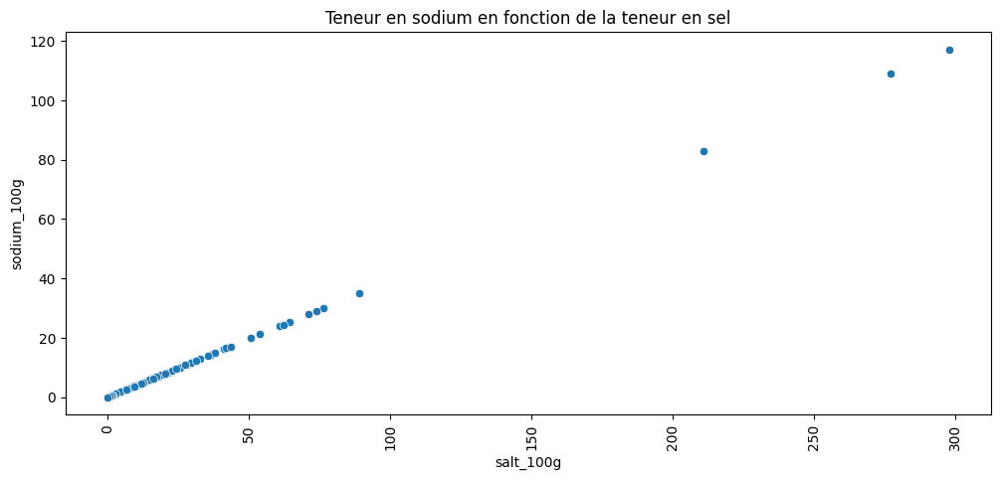

In [27]:
# Construction du graphique
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
plt.title('Teneur en sodium en fonction de la teneur en sel')
sns.scatterplot(x='salt_100g', y='sodium_100g', data=Data_Food2)

In [28]:
Data_Food2[Data_Food2['salt_100g']<Data_Food2['sodium_100g']]

,code,product_name,main_category_fr,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g


De même les graisses satuées étant contenues dans les graisses, il serait anormal d'avoir plus de graisses saturées que de graisse dans un produit. 

<Axes: title={'center': 'Teneur en graisse satureé en fonction de la teneur en graisse'}, xlabel='fat_100g', ylabel='saturated-fat_100g'>

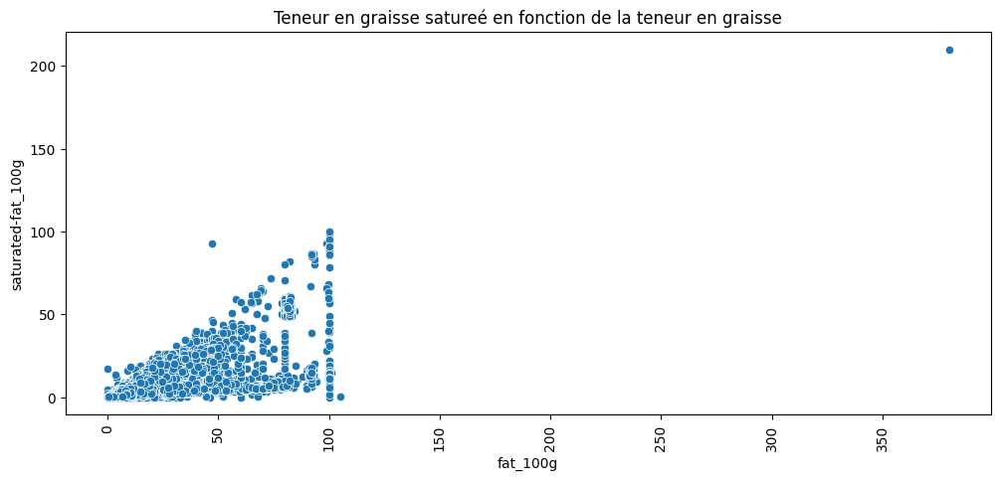

In [29]:
# Construction du graphique
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
plt.title('Teneur en graisse satureé en fonction de la teneur en graisse')
sns.scatterplot(x='fat_100g', y='saturated-fat_100g', data=Data_Food2)

In [30]:
Data_Food2[Data_Food2['fat_100g']<Data_Food2['saturated-fat_100g']]

,code,product_name,main_category_fr,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
99205,78895300017,Panda Brand Oyster Sauce,Epicerie,2.0,0.0,0.0,d,540.0,0.0,0.1,26.32,23.0000,0.0,2.2,11.80000,4.645669,16.0
177333,20031244,Macarons de coco,Gâteaux,3.0,0.0,0.0,e,1990.0,23.0,23.1,60.00,48.0000,NaN,4.5,0.20000,0.078740,25.0
184903,26038476,Bonbons Cassis Sans Sucre,Bonbons,4.0,0.0,0.0,b,1000.0,0.0,0.5,98.00,0.5000,0.5,0.0,0.00000,0.000000,2.0
185447,26107851,Vegetable Medley Tub,Surgelés,NaN,NaN,NaN,a,127.0,0.4,1.0,4.00,2.3000,1.9,1.7,0.07620,0.030000,-8.0
193864,3103220009956,Tirlibibi,Bonbons,8.0,0.0,1.0,d,1448.0,0.6,0.8,79.00,50.0000,0.0,4.4,0.55000,0.216535,16.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
302974,80050124,Tic Tac - Menthe,Bonbons,2.0,0.0,0.0,d,1661.0,0.3,0.5,97.50,94.5000,0.0,0.1,0.02800,0.011024,14.0
303082,80052043,Tic Tac Menthe,Bonbons,2.0,0.0,0.0,d,1661.0,0.0,0.5,97.50,94.5000,0.0,0.1,0.02800,0.011024,14.0
304552,8021240910012,Pomodori Pelati Italiani Carla,Condiments,0.0,0.0,0.0,a,92.0,0.1,0.2,3.80,0.0001,0.9,1.2,0.00000,0.000000,-1.0
310641,8437008813202,Brócoli,Conserves,1.0,0.0,0.0,a,204.0,0.4,0.5,7.20,0.1000,NaN,2.4,0.70000,0.275591,-3.0


De même les sucres étant contenues dans les carbohydrates, il serait anormal d'avoir plus de sucres saturées que de carbohydrates dans un produit. 

<Axes: title={'center': 'Teneur en sucre en fonction de la teneur en carboyhdrate'}, xlabel='carbohydrates_100g', ylabel='sugars_100g'>

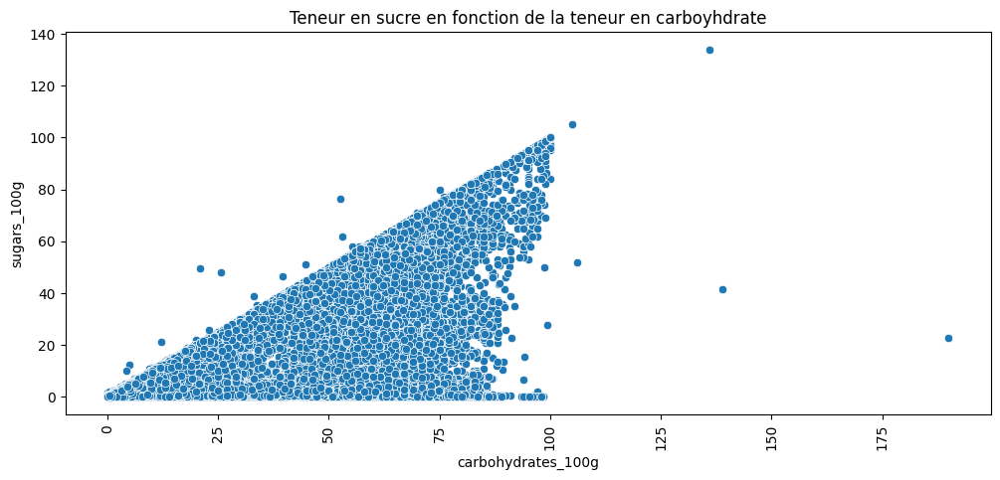

In [31]:
# Construction du graphique
plt.figure(figsize=(12,5))
plt.xticks(rotation=90)
plt.title('Teneur en sucre en fonction de la teneur en carboyhdrate')
sns.scatterplot(x='carbohydrates_100g', y='sugars_100g', data=Data_Food2)

In [32]:
Data_Food2[Data_Food2['carbohydrates_100g']<Data_Food2['sugars_100g']]

,code,product_name,main_category_fr,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,nutrition_grade_fr,energy_100g,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
18955,21357020138,Hickory Farms® Our Signature Beef Summer Sausa...,Saucisses,2.0,0.0,0.0,d,1343.0,15.00,6.00,0.00,1.00,0.00,10.00,1.80340,0.710000,16.0
27505,318655,6 Pork & Bramley Apple Sausages,Saucisses,3.0,0.0,0.0,d,1023.0,19.20,7.00,5.50,5.60,1.00,12.40,1.18000,0.464567,14.0
66912,60383998622,Milk chocolate with hazelnuts,Chocolats,1.0,0.0,0.0,e,2420.0,36.80,15.80,52.60,76.30,7.89,7.89,0.20100,0.078900,22.0
67359,63351049005,Rôti de bœuf au jus,Plats à base de viande,1.0,0.0,0.0,b,502.0,5.00,2.00,1.00,2.00,0.00,18.00,0.94000,0.370000,1.0
149041,810757009177,Wild Pacific Sardines in Tomato Sauce,Sardines en conserve,0.0,0.0,0.0,b,673.0,8.93,1.79,0.00,1.79,0.00,17.90,0.81600,0.321000,1.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
312063,8480017537188,Filets d'anchois à l'huile d'olive,Poissons en conserve,0.0,0.0,0.0,d,825.0,11.00,3.20,1.60,2.00,0.00,23.00,15.72000,6.188976,15.0
315480,8718114712277,Ben & Jerry's - Fairly Nuts,Glaces,5.0,0.0,0.0,d,1172.0,15.00,11.00,23.00,26.00,0.00,4.00,0.21000,0.082677,18.0
316821,8850539240390,Prik Khing Curry Paste,Epicerie,0.0,0.0,0.0,d,398.0,1.90,0.26,11.89,12.56,NaN,3.52,7.96798,3.137000,13.0
318961,9300624407621,Deep Spring Orange & Passionfruit,Eaux,0.0,0.0,0.0,a,38.4,0.40,0.00,2.00,2.16,NaN,0.40,0.00965,0.003800,4.0


## Identification des valeurs aberrantes : etape 4 (en groupant par classe du nutriscore)

Enfin, on peut aussi étudier les différentes variables numériques en les regroupant par classe du nutriscore.

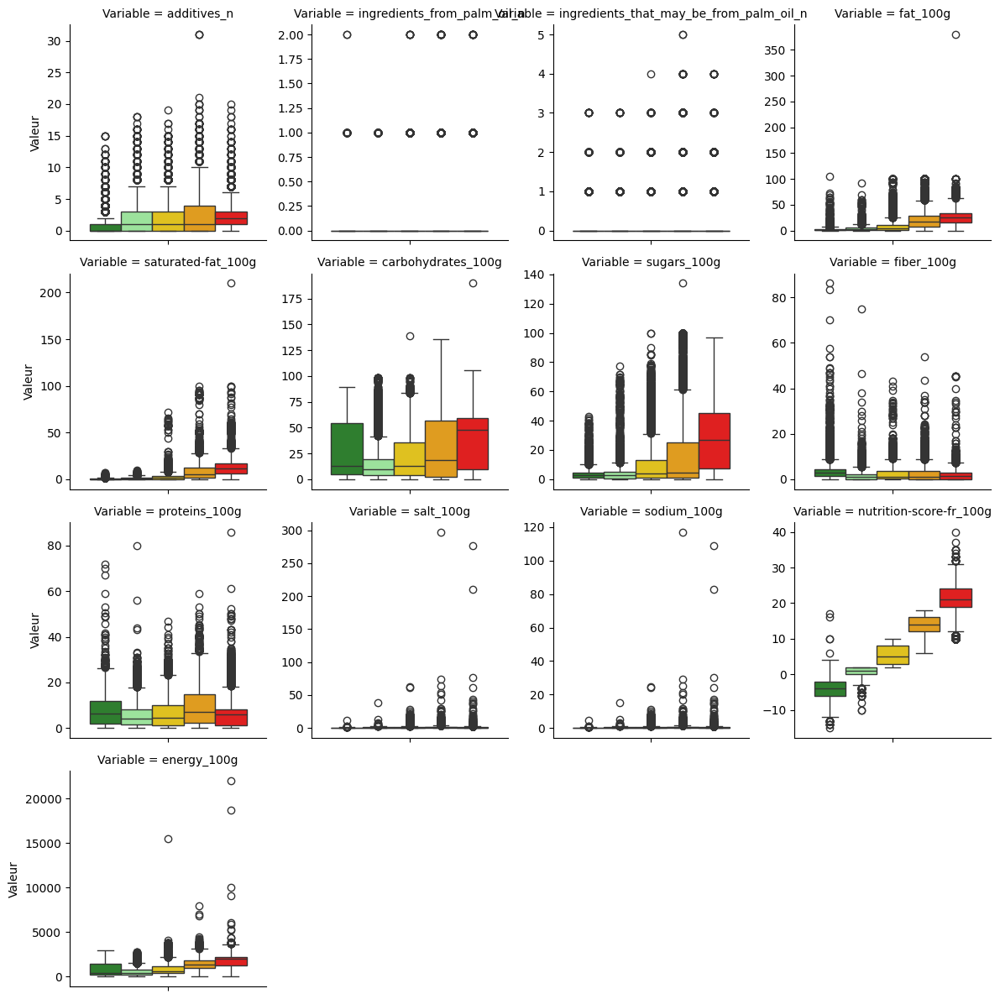

In [33]:
# Création d'une liste contenant les variables que l'on souhaite visualiser dans les boxplots
Selected_Features= ['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n',
       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition-score-fr_100g', 'energy_100g', 'nutrition_grade_fr']

# Selection des variables que l'on souhaite visualiser dans les boxplots
Data_Food_boxplot_grouped = Data_Food2[['code'] + Selected_Features]

# Reformatage de la table pour pouvoir visualiser les boxplots en grille 
Data_Food_boxplot = Data_Food_boxplot_grouped.melt(id_vars=['code', 'nutrition_grade_fr'], 
                                                   var_name="Variable", value_name="Valeur")

# Création d'un dictionnaire pour attribuer une couleur à chaque classe du nutriscore
Colors_groupe = {'a' : 'forestgreen', 
                 'b':'lightgreen',
                 'c': "gold",
                 'd': 'orange',
                 'e' : 'red'}

# Création d'une liste contenant l'ordre dans lequel afficher les boxplot
ordre=['a', 'b', 'c', 'd', 'e']

# Imposition d'un ordre de la variable nutrition grade
Data_Food_boxplot['nutrition_grade_fr'] = Data_Food_boxplot['nutrition_grade_fr'].astype(CategoricalDtype(categories=ordre, ordered=True))

# Construction des boxplots groupés par le nutrition grade
g = sns.FacetGrid(Data_Food_boxplot, col="Variable", col_wrap=4, sharey=False, height=3)
g.map_dataframe(sns.boxplot, y="Valeur", hue='nutrition_grade_fr',  palette = Colors_groupe)
plt.show()

On peut voir en regroupant les produits par score que la variable nutrition score a des valeurs qui overlappent entre les différents classes a, b, c, d, e du nutriscore ce qui peut paraître anormal car l'établissement classes sont basés sur des seuils de la valeur du nutriscore.

En réalité différentes règles de classement sont réalisées selon le type de produit.

pour les aliments solides
- A : de -15 à -1
- B : de 0 à 2
- C : de 3 à 10
- D : de 11 à 18
- E : 19 et plus

pour les boissons
- A:	Eau non aromatisée
- B:	min à -1
- C: 	2 à 9
- D:	10 à 19
- E: 	≥ 20

On peut regarder combien de valeurs sont incohérentes en fonction du nutriscore.   

On va d'abord séparer les produits en boissons (jus, eau, ...)  et non boissons 

In [34]:
# Affichage des catégories contenant jus, eau, boisson
print('Eau')
print(Data_Food2[Data_Food2["main_category_fr"].str.contains('Eau', case=False, na=False)]['main_category_fr'].value_counts())
print('\n Jus')
print(Data_Food2[Data_Food2["main_category_fr"].str.contains('Jus', case=False, na=False)]['main_category_fr'].value_counts())
print('\n boisson')
print(Data_Food2[Data_Food2["main_category_fr"].str.contains('boisson', case=False, na=False)]['main_category_fr'].value_counts())
print('\n thé')
print(Data_Food2[Data_Food2["main_category_fr"].str.contains('thé', case=False, na=False)]['main_category_fr'].value_counts())
print('\n infusion')
print(Data_Food2[Data_Food2["main_category_fr"].str.contains('infusion', case=False, na=False)]['main_category_fr'].value_counts())
print('\n Nectar')
print(Data_Food2[Data_Food2["main_category_fr"].str.contains('Nectar', case=False, na=False)]['main_category_fr'].value_counts())


Eau
main_category_fr
Gâteaux    1188
Eaux        608
Name: count, dtype: int64

 Jus
main_category_fr
Jus de fruits                        525
Jus de fruits 100% pur jus           299
Jus d'orange 100% pur jus            281
Jus de pomme                         261
Jus de fruits à base de concentré    145
Jus d'orange                         119
Jus d'orange à base de concentré      89
Jus de pamplemousse                   70
Jus et nectars de fruits               7
Name: count, dtype: int64

 boisson
main_category_fr
Boissons                                   2804
Aliments et boissons à base de végétaux    2166
Boissons gazeuses                            77
Name: count, dtype: int64

 thé
main_category_fr
Thés          341
Thés verts    149
Name: count, dtype: int64

 infusion
main_category_fr
Infusions    354
Name: count, dtype: int64

 Nectar
main_category_fr
Nectars de fruits           351
Jus et nectars de fruits      7
Name: count, dtype: int64


- Si on utilise le mots clé eau pour tager le produits en boisson on tagera aussi les gateaux. De plus l'eau est un produit plus compliquer à gérer car les eaux non aromatisées sont classées A et les eaux aromatisées sont classées en fonction de leur nutriscore. Cette catégorie de boisson sera gérée à part.
- On remarque également qu'on a une catégorie nommée Aliments et Boissons. Regardons ce que cette catégorie contient plus précisément  

In [35]:
# Ajustement de la taille d'affichage de la zone résultats pour éviter que cette visualisation ne prenne trop de place
display(HTML("<style>.output_scroll {height: 400px; overflow-y: auto;}</style>"))

# Visualisation des produits appartenant à la catégorie Aliments et boissons à base de végétaux
for i in Data_Food2[Data_Food2["main_category_fr"]=='Aliments et boissons à base de végétaux']['product_name'].value_counts().index:
    print(i)

Quinoa
Lentilles vertes
Tortitas de maíz
Haricots rouges
Lentilles corail
Dulce de membrillo
Lentilles Vertes
Tomates séchées
Couscous grain moyen
Pois chiches
Couscous
Galettes de riz
Peladillas
Tortitas de arroz con chocolate negro
Pois cassés
Lentilles blondes
Maíz dulce fresco en mazorca
Tomaten passiert
Graines de chia
Galettes de riz complet
Piñones
Double concentré de tomates
Fusilli
Maïs doux
Pan de higo con almendras
Couscous moyen
Coulis de tomates
Galettes de Maïs
Bulgur
Tofu fumé
Lentejas pardinas
Trigo sarraceno
Pâtes de fruits d'Auvergne
Son de blé
Semillas de chía
Lentejas rojas peladas
Tortitas de arroz
Lentilles vertes du Berry
Son d'avoine
Couscous aux épices
Lentilles Corail
Tomato Paste
Tomate seco en aceite
Tofu nature
Tomate seco
Pâtes de fruits
Tofu
Tortillas de blé
Couscous complet
Weiße Bohnen
Tortitas de maíz con chocolate negro
Tomatenmark
Marron glacé
Kichererbsen
Semoule moyenne
Confit de figues
Concentré de tomates
Flageolets verts
Maíz frito
Marrons glacé

Cette catégorie semble contenir majoritairement des aliments et sera donc taggée en Non en boissons

On va donc regrouper dans la variable boisson, toutes les catégories contenant les séquences suivantes : 
  - jus
  - nectar
  - thé
  - infusion
  - boissons (mais une étape supplémentaire devra modifier les produits de la catégorie Aliment et boisson)
 

In [36]:
# Création d'un mot clé pour tagger les produits boisson en Yes dans une nouvelle variable boisson
keywords = ["jus", "boisson", "soda", 'thé', 'infusion', 'nectar']
pattern = "|".join(keywords)

# Création d'une nouvelle variable boissons (Yes/No)
Data_Food2["boisson"] = np.where(
    Data_Food2["main_category_fr"].str.contains(pattern, case=False, na=False),
    'Yes',
    'No')

# Modification de la valeur de boissons pour les produits de la catégorie Aliments et boissons à base de végétaux
Data_Food2.loc[Data_Food2['main_category_fr']=='Aliments et boissons à base de végétaux', 'boisson']='No'

# Verification du type de produits taggés en boisson
Data_Food2[Data_Food2['boisson']=='Yes']['main_category_fr'].value_counts()

main_category_fr
Boissons                             2804
Sodas                                 731
Jus de fruits                         525
Infusions                             354
Nectars de fruits                     351
Thés                                  341
Jus de fruits 100% pur jus            299
Jus d'orange 100% pur jus             281
Jus de pomme                          261
Sodas aux fruits                      222
Sodas light                           189
Thés verts                            149
Jus de fruits à base de concentré     145
Jus d'orange                          119
Jus d'orange à base de concentré       89
Boissons gazeuses                      77
Jus de pamplemousse                    70
Jus et nectars de fruits                7
Name: count, dtype: int64

On va maintenant pouvoir identifier les produits dont la classe du nutriscore n'est pas cohérente par rapport à son score

In [37]:
# Création d'un dictionnaire contenant les différents seuils associés au nutriscore des boissons et des produits non boissons
seuils = {
    'a': {'boisson': (-float('inf'), 1), 'non_boisson': (-15, -1)},
    'b': {'boisson': (-float('inf'), 1), 'non_boisson': (0,2)},
    'c': {'boisson': (2, 5), 'non_boisson': (3,10)},
    'd': {'boisson': (6, 9), 'non_boisson': (11, 18)},
    'e': {'boisson': (10, float('inf')), 'non_boisson': (19, float('inf'))}
}

# Calcul du nombre de produits dont le nutriscore grade ne correspond pas au nutriscore 100g
for grade, seuil in seuils.items():    
    n_boissons_inc = Data_Food2[
        (Data_Food2['nutrition_grade_fr'] == grade) & 
        (Data_Food2['boisson'] == "Yes") & 
        ((Data_Food2['nutrition-score-fr_100g'] < seuil['boisson'][0]) | 
         (Data_Food2['nutrition-score-fr_100g'] > seuil['boisson'][1]))
    ].shape[0]
    
    n_non_boissons_inc = Data_Food2[
        (Data_Food2['nutrition_grade_fr'] == grade) & (Data_Food2['main_category_fr'] != 'Eaux') &
        (Data_Food2['boisson'] == "No") & 
        ((Data_Food2['nutrition-score-fr_100g'] < seuil['non_boisson'][0]) | 
         (Data_Food2['nutrition-score-fr_100g'] > seuil['non_boisson'][1]))
    ].shape[0]
    
    n_tot = n_boissons_inc + n_non_boissons_inc
    print(f'{n_tot} produits notés {grade} ont un mauvais nutriscore, ({n_non_boissons_inc} non boissons et {n_boissons_inc} boissons)' )

0 produits notés a ont un mauvais nutriscore, (0 non boissons et 0 boissons)
20 produits notés b ont un mauvais nutriscore, (3 non boissons et 17 boissons)
8 produits notés c ont un mauvais nutriscore, (4 non boissons et 4 boissons)
62 produits notés d ont un mauvais nutriscore, (5 non boissons et 57 boissons)
104 produits notés e ont un mauvais nutriscore, (104 non boissons et 0 boissons)


Au final, peu de produits présentent une incohérence entre la classe de leur nutriscore et la valeur numérique de leur nutriscore. On peut examiner plus en détail ces cas spécifiques afin de comprendre à quoi ils correspondent.

In [38]:
# Ajustement de la taille d'affichage de la zone résultats pour éviter que cette visualisation ne prenne trop de place
display(HTML("<style>.output_scroll {height: 400px; overflow-y: auto;}</style>"))

# Création d'un dictionnaire contenant les différents seuils associés au nutriscore des boissons et des produits non boissons
seuils = {
    'a': {'boisson': (-float('inf'), 1), 'non_boisson': (-15, -1)},
    'b': {'boisson': (-float('inf'), 1), 'non_boisson': (0,2)},
    'c': {'boisson': (2, 5), 'non_boisson': (3,10)},
    'd': {'boisson': (6, 9), 'non_boisson': (11, 18)},
    'e': {'boisson': (10, float('inf')), 'non_boisson': (19, float('inf'))}
}
# Calcul du nombre de produits dont le nutriscore grade ne correspond pas au nutriscore 100g
for grade, seuil in seuils.items():    
    print(f'\n \n boisson, {grade}')
    print('--------------------------------------------------------------------')
    print(Data_Food2[
        (Data_Food2['nutrition_grade_fr'] == grade) & 
        (Data_Food2['boisson'] == "Yes") & 
        ((Data_Food2['nutrition-score-fr_100g'] < seuil['boisson'][0]) | 
         (Data_Food2['nutrition-score-fr_100g'] > seuil['boisson'][1]))
    ][['product_name',  'main_category_fr', 'nutrition-score-fr_100g']])
    print(f'\n Aliments, {grade}')
    print('--------------------------------------------------------------------')
    print(pd.DataFrame(Data_Food2[
        (Data_Food2['nutrition_grade_fr'] == grade) & (Data_Food2['main_category_fr'] != 'Eaux') &
        (Data_Food2['boisson'] == "No") & 
        ((Data_Food2['nutrition-score-fr_100g'] < seuil['non_boisson'][0]) | 
         (Data_Food2['nutrition-score-fr_100g'] > seuil['non_boisson'][1]))
    ][['product_name',  'main_category_fr', 'nutrition-score-fr_100g']]))


 
 boisson, a
--------------------------------------------------------------------
Empty DataFrame
Columns: [product_name, main_category_fr, nutrition-score-fr_100g]
Index: []

 Aliments, a
--------------------------------------------------------------------
Empty DataFrame
Columns: [product_name, main_category_fr, nutrition-score-fr_100g]
Index: []

 
 boisson, b
--------------------------------------------------------------------
                                           product_name main_category_fr  \
21779                             Coconut milk, vanilla         Boissons   
230616                                       Riz Amande         Boissons   
230844                                Chocolat Noisette         Boissons   
251793                        Lait d'Amande au Chocolat         Boissons   
272301                                      Ginger beer         Boissons   
302354         Bevanda a base di succo di arancia rossa         Boissons   
302840              Succo 100% 

Empty DataFrame
Columns: [product_name, main_category_fr, nutrition-score-fr_100g]
Index: []

 Aliments, e
--------------------------------------------------------------------
                        product_name   main_category_fr  \
109422             Iced Coffee Latte  Produits laitiers   
118301                   Grand Arôme    Petit-déjeuners   
176290                        Valcao    Petit-déjeuners   
178226                    Cappuccino  Produits laitiers   
179325                   Le chocolat    Petit-déjeuners   
...                              ...                ...   
297138  Extra Strong Double Espresso  Produits laitiers   
297140                       Caramel  Produits laitiers   
298486       Grand Arôme (32% cacao)    Petit-déjeuners   
298991                         O'boy    Petit-déjeuners   
299664       Caffè lattesso espresso  Produits laitiers   

        nutrition-score-fr_100g  
109422                     14.0  
118301                     17.0  
176290       

On observe que la majorité des boissons mal classées en D sont des produits contenant du lait. Il s'agit peut-être d'un cas particulier où les règles de classification diffèrent des critères habituels Il faudrait se renseigner auprès d'un spécialiste. 

En attendant, ces catégories de produits ne seront pas prises en compte dans l’identification des valeurs aberrantes.

Pour la catégorie eau on va considérer comme valeur aberrantes toutes les eaux avec du sucre classées en a.

## Fonction d'automatisation de gestion des valeurs aberrantes 

Toutes les valeurs aberrantes vont être remplacées par des valeurs manquantes qui seront traitées par la suite par différentes approches. On va écrire des fonctions correspondant à chacune des étapes décrites précédemment puis une fonction générale qui permettra d'enchainer les différentes étapes de traitements et de visualiser le nombre de valeurs transformées en valeurs manquantes à chaque étape pour chacune des variables.

In [39]:
def identification_val_aberrante1(df, feature, feature2):
    
    """
    Identifie et remplace les valeurs aberrantes dans certaines variables d'un DataFrame par des valeurs manquantes (NaN),
    puis calcule le taux de valeurs manquantes par variable après ce traitement.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données originales.
     - feature (list of str): Liste des noms des colonnes sur lesquelles appliquer un seuil d'aberration fixé entre 0 et 100 inclus.
     Les valeurs inférieures à 0 ou supérieures à 100 seront remplacées par NaN.
     - feature2 (str): Nom d'une colonne pour laquelle les valeurs strictement supérieures à 3700 seront remplacées par NaN.

    Sortie
     - df_copy (pandas.DataFrame): Copie modifiée du DataFrame initial où les valeurs aberrantes ont été remplacées par NaN.
     - taux_valeurs_manquantes (pandas.Series): Série indiquant le pourcentage de valeurs manquantes par variable dans df_copy.
    """
    
    # Copie de la dataframe
    df_copy = df.copy()
    
    # Remplacement des valeurs aberrantes par des valeurs manquantes
    for feat in feature:
        df_copy.loc[(df[feat] > 100) | (df[feat] < 0), feat]=np.nan     
    df_copy.loc[(df[feature2] > 3700), feature2]=np.nan 
    
    # Calcul du taux de valeurs manquantes pour chaque variable 
    taux_valeurs_manquantes = df_copy.isnull().mean()*100
    
    return df_copy, taux_valeurs_manquantes

In [40]:
def identification_val_aberrante2(df, features):
    
    """
    Identifie et remplace les valeurs aberrantes dans plusieurs variables nutritionnelles d'un DataFrame, 
    en tenant compte de la catégorie principale des produits, puis calcule le taux de valeurs manquantes par variable.

    La détection des valeurs aberrantes est réalisée par groupe ('main_category_fr') selon la règle classique de Tukey 
    (valeurs en dehors de [Q1 - 1.5*IQR, Q3 + 1.5*IQR]).

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données d'origine, incluant au minimum les colonnes : 
        'code', 'product_name', 'main_category_fr', 'nutrition_grade_fr' et les variables nutritionnelles à analyser.
     - features (list of str): Liste des noms des colonnes nutritionnelles à analyser pour la détection des valeurs aberrantes.

    Sortie
     - df_melt_pivot (pandas.DataFrame): DataFrame au format large reprenant les données d'origine avec les valeurs aberrantes remplacées par NaN.
     - taux_valeurs_manquantes (pandas.Series): Série indiquant le pourcentage de valeurs manquantes par variable dans df_melt_pivot.
    """
    
    # Copie de la dataframe
    df_copy = df.copy()
    
    # Transformation du DataFrame en format long pour faciliter l'analyse de plusieurs variables nutritionnelles
    df_melt = df_copy.melt(id_vars=['code', 'product_name',  'main_category_fr', 'nutrition_grade_fr'],
               value_vars=features, var_name='Variable', value_name='Valeur')
    
    # Calcule des statistiques descriptives : moyenne, écart-type, quartiles après groupement par catégorie
    df_desc = df_melt.groupby(['main_category_fr', 'Variable']).agg(
    mean=('Valeur', 'mean'),
    std=('Valeur', 'std'),
    Q25=('Valeur', lambda x: x.quantile(0.25)),
    Q50=('Valeur', lambda x: x.quantile(0.50)), 
    Q75=('Valeur', lambda x: x.quantile(0.75)),
    ).round(2).reset_index()
    
    # Calcul de l'IQR et des limites haute et basse
    df_desc['IQR'] = df_desc['Q75'] - df_desc['Q25']
    df_desc['limite_basse'] = df_desc['Q25'] - 1.5 * df_desc['IQR']
    df_desc['limite_haute'] = df_desc['Q75'] + 1.5 * df_desc['IQR']
    
    # Fusion des données initiales avec les bornes d'outliers pour chaque combinaison catégorie / variable
    df_melt = df_melt.merge(df_desc[[ 'Variable', 'main_category_fr',  'limite_basse', 'limite_haute']],
                                        on=['main_category_fr', 'Variable'], how='left')

    # Détection des outliers : une valeur est considérée comme aberrante si elle est en dehors des limites
    df_melt['is_outlier'] = (df_melt['Valeur'] < df_melt['limite_basse']) | (df_melt['Valeur'] > df_melt['limite_haute'])
    
    # Remplacement les valeurs aberrantes par NaN pour chaque variable 
    for feat in features:
        df_melt.loc[(df_melt['Variable'] == feat) & (df_melt['is_outlier']), 'Valeur'] = np.nan
    
    # Transformation de la table pour revenir au format d'origine
    df_melt_pivot = df_melt.pivot(index=['code', 'product_name', 'main_category_fr', 'nutrition_grade_fr'], 
                                         columns='Variable', 
                                         values='Valeur').reset_index()
    
    # Calcul du taux de valeurs manquantes pour chaque variable 
    taux_valeurs_manquantes = df_melt_pivot.isnull().mean()*100
    
    return df_melt_pivot, taux_valeurs_manquantes

In [41]:
def identification_val_aberrante3(df, liste_couple_var):
    
    """
    Identifie et remplace par des valeurs manquantes (NaN) les cas où, pour des couples de variables donnés,
    la première variable est strictement supérieure à la deuxième, ce qui est considéré comme une aberration.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données originales.
     - liste_couple_var (list of tuple(str, str)): Liste de tuples, chaque tuple contenant deux noms de colonnes (var1, var2). 
     Pour chaque couple, les lignes où var1 > var2 verront ces deux valeurs remplacées par NaN.

    Sortie
     - df_copy (pandas.DataFrame): Copie du DataFrame original où les valeurs aberrantes détectées ont été remplacées par NaN.
     - taux_valeurs_manquantes (pandas.Series): Série indiquant le pourcentage de valeurs manquantes par variable dans df_copy après nettoyage.
    """
    
    # Copie de la dataframe
    df_copy = df.copy()

    # remplacement des valeurs aberrantes par des valeurs manquantes
    for couple_var in liste_couple_var:
        df_copy.loc[df_copy[couple_var[0]]> df_copy[couple_var[1]], [couple_var[0], couple_var[1]]] = np.nan
    
    # Calcul du taux de valeurs manquantes pour chaque variable 
    taux_valeurs_manquantes = df_copy.isnull().mean()*100
    
    return df_copy, taux_valeurs_manquantes

In [42]:
def identification_val_aberrante4(df):
    
    """
    Identifie et remplace par des valeurs manquantes (NaN) les valeurs aberrantes dans les scores nutritionnels 
    en fonction des classes nutritionnelles ('nutrition_grade_fr') et du type de produit (boisson ou non-boisson).

    Cette fonction crée une variable binaire 'boisson' à partir de mots-clés dans la catégorie principale, 
    applique des seuils spécifiques de validité des scores nutritionnels pour chaque groupe, 
    et filtre également certains cas particuliers (ex : eaux sucrées).

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données produits avec au moins les colonnes suivantes :
        - 'main_category_fr' (catégorie principale du produit)
        - 'product_name' (nom du produit)
        - 'nutrition_grade_fr' (classe nutritionnelle a, b, c, d, e)
        - 'nutrition-score-fr_100g' (score nutritionnel)
        - 'sugars_100g' (quantité de sucres pour 100g)

    Sortie
     - df_copy (pandas.DataFrame): Copie modifiée du DataFrame original où les valeurs aberrantes détectées ont été remplacées par NaN
     dans les colonnes 'nutrition-score-fr_100g' et 'nutrition_grade_fr'.
     - taux_valeurs_manquantes (pandas.Series): Série indiquant le pourcentage de valeurs manquantes par variable dans df_copy après nettoyage.
    """
    
    # Création d'un mot clé pour tagger les produits boisson en Yes dans une nouvelle variable boisson
    keywords = ["jus", "boisson", "soda", 'thé', 'infusion', 'nectar']
    pattern = "|".join(keywords)
    
    # Création d'une nouvelle varible boissons (Yes/No)
    df["boisson"] = np.where(
    df["main_category_fr"].str.contains(pattern, case=False, na=False),
    'Yes', 'No')
    
    # Modification de la valeur de boissons pour les produits de la catégorie Aliments et boissons à base de végétaux
    df.loc[df['main_category_fr']=='Aliments et boissons à base de végétaux', 'boisson']='No'
    
    # Définition des seuils pour les scores nutritionnels en fonction des classes et des types (boisson/non-boisson)
    seuils = {
    'a': {'boisson': (-float('inf'), 1), 'non_boisson': (-15, -1)},
    'b': {'boisson': (-float('inf'), 1), 'non_boisson': (0,2)},
    'c': {'boisson': (2, 5), 'non_boisson': (3,10)},
    'd': {'boisson': (6, 9), 'non_boisson': (11, 18)},
    'e': {'boisson': (10, float('inf')), 'non_boisson': (19, float('inf'))}}
    
    df_copy = df.copy()
    
    # remplacement des valeurs aberrantes par des valeurs manquantes
    for grade, seuil in seuils.items():   
        
        # Traitement des produits de type boisson
        df_copy.loc[
        (df_copy['nutrition_grade_fr'] == grade) & 
        (df_copy['boisson'] == "Yes") & 
        (~df_copy['product_name'].str.contains("|".join(['milk', 'lait']), case=False, na=False)) &
        ((df_copy['nutrition-score-fr_100g'] < seuil['boisson'][0]) | 
         (df_copy['nutrition-score-fr_100g'] > seuil['boisson'][1]))
    , ['nutrition-score-fr_100g', 'nutrition_grade_fr']] = np.nan
    
        # Traitement des produits de type non boissons
        df_copy.loc[
        (df_copy['nutrition_grade_fr'] == grade) & (Data_Food2['main_category_fr'] != 'Eaux') & 
        (df_copy['boisson'] == "No") & 
        ((df_copy['nutrition-score-fr_100g'] < seuil['non_boisson'][0]) | 
         (df_copy['nutrition-score-fr_100g'] > seuil['non_boisson'][1]))
    , ['nutrition-score-fr_100g', 'nutrition_grade_fr']] = np.nan
    
    # Traitement des produits de type eaux
    df_copy.loc[(df_copy["main_category_fr"]=='Eaux') & (df_copy['sugars_100g']>0) & (df_copy['nutrition_grade_fr']=='a'), 'nutrition-score-fr_100g']=np.nan

    # Calcul du taux de valeurs manquantes pour chaque variable
    taux_valeurs_manquantes = df_copy.isnull().mean()*100
    
    return df_copy, taux_valeurs_manquantes
    

In [43]:
def nettoyage2(df):
    
    """
    Effectue un nettoyage complet des données en identifiant et traitant les valeurs aberrantes en plusieurs étapes successives,
    puis calcule et synthétise les taux de valeurs manquantes avant et après chaque étape.

    Chaque étape correspond à un appel à une fonction dédiée à l’identification et au traitement des valeurs aberrantes.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données à nettoyer, incluant les colonnes nécessaires aux fonctions d'identification des valeurs aberrantes.

    Sortie
     - df_d (pandas.DataFrame): DataFrame nettoyée après application des quatre étapes d'identification et traitement des valeurs aberrantes.
     - Taux_valeurs_manquantes_tot (pandas.DataFrame): DataFrame récapitulative des taux de valeurs manquantes (%) pour un ensemble de variables sélectionnées, 
     mesurés à l’état initial (étape 0) et après chaque étape de nettoyage (étapes 1 à 4), 
     avec une colonne supplémentaire indiquant la différence entre le taux final et initial.
    """
    
    taux_valeurs_manquantes_0 = df.isnull().mean()*100

    # IDENTIFICATION DES VALEURS ABERRANTES : ETAPE 1 
    ############################################################################################
    
    df_a, taux_valeurs_manquantes_a = identification_val_aberrante1(Data_Food2, Feature_etape1_100, Feature_etape1_3700)
       
    # IDENTIFICATION DES VALEURS ABERRANTES : ETAPE 2 
    ############################################################################################
    
    df_b, taux_valeurs_manquantes_b = identification_val_aberrante2(df_a, Feature_etape3)
    
    # IDENTIFICATION DES VALEURS ABERRANTES : ETAPE 3
    ############################################################################################
    
    df_c, taux_valeurs_manquantes_c = identification_val_aberrante3(df_b, Liste_couple_var)
    
    # IDENTIFICATION DES VALEURS ABERRANTES : ETAPE 4
    ############################################################################################
    
    df_d, taux_valeurs_manquantes_d = identification_val_aberrante4(df_c)
    
    
    # Création d'une dataframe contenant les taux de valeurs manquantes a chaque étapes
    ############################################################################################
    
    # Création d'une liste contenant les variables à analyser
    Selected_Features=['energy_100g','fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'nutrition-score-fr_100g', 'nutrition_grade_fr', 
                     'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 
                       'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']
    
    # Création d'une Dataframe contenant mes calcules de taux de valeurs manquantes 
    # pour chaque étape d'identification de valeurs aberrantes
    Taux_valeurs_manquantes_tot = pd.DataFrame({
    '0':taux_valeurs_manquantes_0,
    '1': taux_valeurs_manquantes_a, 
    '2': taux_valeurs_manquantes_b, 
    '3': taux_valeurs_manquantes_c, 
    '4': taux_valeurs_manquantes_d})
    
    Taux_valeurs_manquantes_tot = Taux_valeurs_manquantes_tot.reset_index()
    Taux_valeurs_manquantes_tot = Taux_valeurs_manquantes_tot[Taux_valeurs_manquantes_tot['index'].isin(Selected_Features)]
    
    # Calcule de la proportions de valeurs manquantes ajoutée par l'identification et le traitement des valeurs aberrantes
    Taux_valeurs_manquantes_tot['Diff'] = Taux_valeurs_manquantes_tot['4'] - Taux_valeurs_manquantes_tot['0']
    
    return df_d, Taux_valeurs_manquantes_tot

Avant d'appeler la fonction on va définir les différentes variables à prendre en compte dans chacune des étapes de traitement des valeurs aberrantes

In [44]:
# IDENTIFICATION DES VALEURS ABERRANTES : ETAPE 1 
############################################################################################

# Création d'une liste contenant les variables que l'on souhaite traiter
Feature_etape1_100 =  ['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
                    'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
                    'sodium_100g']

Feature_etape1_3700 = 'energy_100g'

# IDENTIFICATION DES VALEURS ABERRANTES : ETAPE 2
############################################################################################

# Création d'une liste contenant les variables que l'on souhaite traiter  
Feature_etape3 = ['energy_100g', 'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
                     'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
                     'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 
                  'nutrition-score-fr_100g']

# IDENTIFICATION DES VALEURS ABERRANTES : ETAPE 3 
############################################################################################

# Création d'une liste contenant les couples de variables que l'on souhaite traiter
Liste_couple_var = [('saturated-fat_100g', 'fat_100g'), ('sodium_100g', 'salt_100g'), ('sugars_100g', 'carbohydrates_100g')]


In [45]:
# Appel de la fonction
Data_Food3, Data_valeur_manquantes = nettoyage2(Data_Food2)

<Axes: >

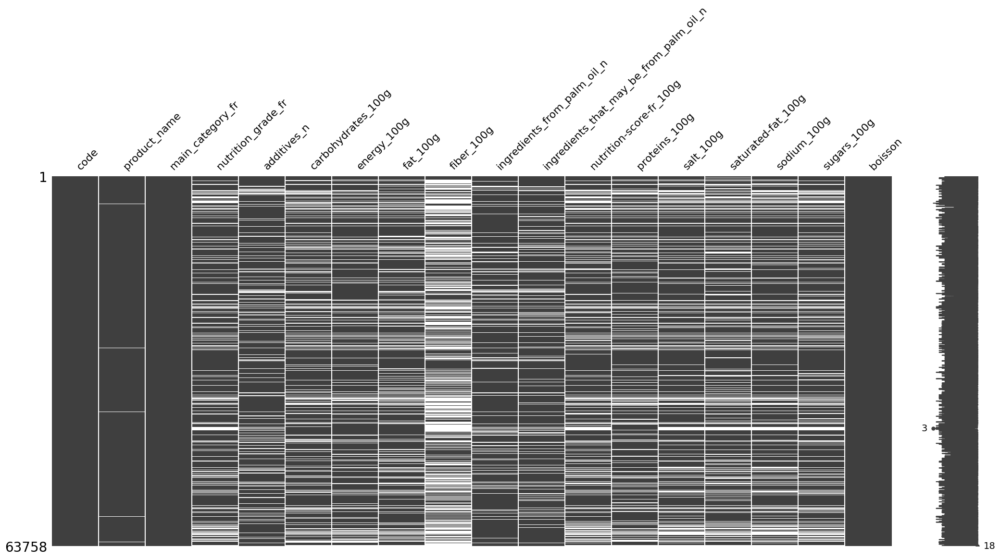

In [46]:
msno.matrix(Data_Food3)

In [47]:
# Visualisation de la proportion de valeurs manquantes suivant chacune des étapes d'identification et de traitements
Data_valeur_manquantes.sort_values('Diff')

,index,0,1,2,3,4,Diff
11,nutrition_grade_fr,20.670347,20.670347,20.670347,20.670347,20.726811,0.056464
10,nutrition-score-fr_100g,20.670347,20.670347,23.794661,23.794661,23.857398,3.187051
7,ingredients_from_palm_oil_n,9.319615,9.319615,12.741930,12.741930,12.741930,3.422316
6,fiber_100g,47.995546,47.995546,51.535494,51.535494,51.535494,3.539948
14,salt_100g,18.454155,18.458860,23.455880,23.455880,23.455880,5.001725
16,sodium_100g,18.461997,18.465134,23.724082,23.724082,23.724082,5.262085
5,fat_100g,17.400169,17.404875,22.803413,22.877129,22.877129,5.476960
2,carbohydrates_100g,18.046363,18.054205,23.438627,23.548417,23.548417,5.502055
0,additives_n,9.319615,9.319615,14.914207,14.914207,14.914207,5.594592
13,proteins_100g,14.464067,14.464067,20.074344,20.074344,20.074344,5.610276


# Gestion des valeurs manquantes 

Les valeurs manquantes vont être traitées par différentes méthodologies. Afin de visualiser et analyser l'impact de ces traitements, on va écrire deux fonctions
- une fonction qui permet de visualiser les distributions avant et après imputation
- une fonction qui permet de comparer statistiquement les distributions avant et après imputation

In [48]:
def distribution_compar(Df_avant, Df_apres, features):
    
    """
    Compare les distributions des variables sélectionnées entre deux DataFrames (avant et après imputation ou nettoyage)
    en utilisant le test de Kolmogorov-Smirnov pour détecter des différences significatives.

    Pour chaque variable, la fonction affiche la statistique KS, la p-value, et indique si la différence est significative
    au seuil de 0.05. Elle compte aussi le nombre total de variables dont la distribution a changé significativement.

    Paramètres
     - Df_avant (pandas.DataFrame): DataFrame contenant les données avant imputation.
     - Df_apres (pandas.DataFrame): DataFrame contenant les données après imputation.
     - features (list of str): Liste des noms des variables numériques à comparer.
    """
    
    # Création d'un compteur qui va compter le nombre de distributions significativement différentes
    compteur = 0
    
    # Pour chaque variable, test de Kolmogorov-Smimov
    for feat in features: 
        data1 = Df_avant[feat].dropna()
        data2 = Df_apres[feat].dropna()
        stat, p_value = ks_2samp(data1, data2)
        
        # Affichage des résultats
        print(f"Statistique KS : {stat:.3f}, p-value : {p_value}")
    
        if p_value < 0.05:
            compteur = compteur + 1
            print(f"Les distributions de la variable {feat} avant et après imputation sont significativement différentes. \n")
        else:
            print(f"Aucune différence significative entre les distributions de la variable {feat} avant et après imputation. \n")
    
    # Affichage du nombre de distributions statistiquement différentes après imputation 
    print(f"{"-" * 90}\n Au total, {compteur} variables ont une distribution significativement différentes après imputation")

In [49]:
def violinplot_compar(Df_avant, Df_apres, features):
    
    """
    Affiche des violinplots comparant la distribution de variables sélectionnées avant et après imputation ou nettoyage.

    La fonction concatène les deux DataFrames, ajoute une colonne indiquant la provenance ('Avant' ou 'Apres'),
    reformate les données en format long, puis génère une grille de violinplots par variable.

    Paramètres
     - Df_avant (pandas.DataFrame): DataFrame contenant les données avant imputation ou nettoyage.
     - Df_apres (pandas.DataFrame): DataFrame contenant les données après imputation ou nettoyage.
     - features (list of str): Liste des variables numériques à visualiser.
    """
    
    warnings.simplefilter(action='ignore', category=FutureWarning)
    
    # Ajout d'une variable Imputation qui prend en valeur Avant ou Après
    Df_apres['Imputation']='Apres' 
    Df_avant['Imputation']='Avant'
    
    # Concaténation des data frame avant et après imputation
    Df_violinplot= pd.concat([Df_apres, Df_avant], axis=0)

    # Selection des variables que l'on souhaite visualiser dans les violinplots
    Df_violinplot = Df_violinplot[Selected_Features + ['code', 'Imputation']]

    # Reformatage de la table pour pouvoir visualiser les violinplots en grille 
    Df_violinplot = Df_violinplot.melt(id_vars=['code', 'Imputation'], 
                                  var_name="Variable", value_name="Valeur")
    
    # Création d'une liste contenant l'ordre dans lequel afficher les violinplots
    ordre=['Avant', 'Apres']

    # Imposition d'un ordre de la variable Imputation
    Df_violinplot['Imputation'] = Df_violinplot['Imputation'].astype(CategoricalDtype(categories=ordre, ordered=True))

    # Construction des violinplots
    g = sns.FacetGrid(Df_violinplot, col="Variable", col_wrap=4, sharey=False, height=3)
    g.map_dataframe(sns.violinplot, y="Valeur", x='Imputation', hue='Imputation')
    g.set_axis_labels("Imputation", "Distribution des valeurs")
    g.fig.suptitle('Distribution des variables imputées avant et après imputation')
    g.fig.subplots_adjust(top=0.9)
    plt.show()

On peut regarder combien on a de valeurs manquante par ligne afin de choisir la méthode la plus adaptée.

In [50]:
# Création d'une liste contenant les variables que l'on souhaite analyser  
Selected_Features = [ 'energy_100g','fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
                     'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
                     'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 
                  'nutrition-score-fr_100g', 'nutrition_grade_fr']

# Affichage du nombre de valeurs manquantes par lignes avec le nombre de lignes correspondant
Data_Food3[Selected_Features].isnull().sum(axis=1).value_counts(normalize=True).sort_index() * 100

0     26.732332
1     26.293171
2      8.394241
3      6.857179
4      5.117789
5      4.311616
6      1.971517
7      3.293704
8      1.430409
9      0.923806
10     1.383356
11    11.769503
12     1.119859
13     0.340349
14     0.061169
Name: proportion, dtype: float64

On a un nombre non négligeable de lignes qui ont 11 valeurs manquantes sur 14. On va donc dans un premier temps essayer de remplir les valeurs manquantes en utilisant des stratégies qui ne sont pas liées à l'ensemble des variables.

## Méthode 1 : fill NA : approche métier 1

Dans un premier temps, on va utiliser une approche métier consistant à mettre à 0, les variables nutritionnelles des produits qui ne sont pas sencés avoir ces nutriments

In [51]:
def impute_na_1(df):
    """
    Impute les valeurs manquantes (NaN) par zéro pour certaines variables nutritionnelles,
    uniquement pour les produits appartenant à des catégories spécifiques définies.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données à imputer, avec au moins les colonnes listées dans `Selected_Features`
        et une colonne 'main_category_fr' indiquant la catégorie principale des produits.

    Sortie
     - Df_imputed (pandas.DataFrame): Copie du DataFrame d'origine où les valeurs manquantes ont été remplacées par zéro pour les variables ciblées,
        uniquement si le produit appartient à une des catégories spécifiées dans `Produits_wo_category`.
    """
    
    # Copie de la dataframe
    Df_imputed = df.copy()

    # Imputation des valeurs manquates pour chaque catégorie produits par 0
    for feat, cat in zip(Selected_Features, Produits_wo_category) :
        Df_imputed[feat] = Df_imputed.apply(
        lambda row: 0 if pd.isna(row[feat]) and row["main_category_fr"] in cat else row[feat], 
        axis=1)
        
    return Df_imputed

In [52]:
# Etablissement des différentes catégories de produits 
Produits_wo_proteines = [
    'Huiles', 'Huiles d’olive', 'Huiles d’olive vierges', 
    'Sucres', 'Confitures', 'Produits à tartiner sucrés',
    'Nectars de fruits',  'Jus d’orange', 'Jus de pomme',
    'Sodas', 'Sodas light', 'Sodas aux fruits', 'Boissons gazeuses',
    'Eaux'
]

Produits_wo_carbs = [
    'Viandes', 'Volailles', 'Charcuteries', 'Jambons', 'Jambons crus', 'Jambons secs',
    'Jambons de Paris', 'Saucisses', 'Saucissons', 'Saucissons secs pur porc', 'Lardons',
    'Charcuteries diverses', 'Poissons', 'Poissons fumés', 'Poissons en conserve', 'Saumons',
    'Sardines', 'Sardines en conserve', 'Thons', 'Produits de la mer', 'Crustacés', 'Produits panés',
    'Poissons et viandes et oeufs',
    'Fromages de vache', 'Fromages de France', 'Emmental',
    'Huiles', 'Huiles d’olive', 'Huiles d’olive vierges',
     'Matières grasses animales', 'Matières grasses végétales',
    'Eaux','Sels']

Produits_wo_fibres = [
    'Viandes', 'Crustacés', 'Bonbons', 'Laits', 'Beurres', 'Sodas light', 
    'Saucisses', 'Saumons', 'Huiles', 'Thons', 'Volailles', "Huiles d'olive", 
    'Sels', 'Sardines', 'Jus de fruits à base de concentré', 'Jambons de Paris', 
    'Lardons', 'Petits beurres', 'Jus d\'orange à base de concentré', 
    'Sardines en conserve', 'Yaourts à boire', 'Saucissons secs pur porc', 
    'Yaourts brassés', 'Yaourts entiers', 'Coquillettes', 'Poissons', 
    'Charcuteries', 'Emmental', 'Charcuteries diverses', 'Jambons', 'Saucissons', 
    'Jambons crus', 'Poissons fumés', "Huiles d'olive vierges", 'Poissons et viandes et oeufs', 
    'Sucres', 'Matières grasses végétales', 'Matières grasses animales', 
    'Matières grasses', 'Nectars de fruits', 'Riz'
]

Produits_wo_salt_sodium = [
    'Sucres', 'Confitures', 'Bonbons', 'Produits à tartiner sucrés', 'Nectars de fruits',
     'Jus d’orange', 'Jus de pomme', 'Jus de pamplemousse',
    'Sodas', 'Sodas light', 'Sodas aux fruits', 'Boissons gazeuses',
    'Huiles', 'Huiles d’olive', 'Huiles d’olive vierges', 
    'Pommes de terre', 'Purées de pommes de terre',
    'Champignons', 'Eaux',
]

Produits_wo_fat = [
    'Eaux', 
     'Jus d’orange', 'Jus de pomme', 'Jus de pamplemousse',
    'Sodas', 'Sodas light', 'Sodas aux fruits', 'Boissons gazeuses',
    'Sucres', 'Confitures', 'Produits à tartiner sucrés', 'Nectars de fruits',
    'Pommes de terre', 'Purées de pommes de terre', 'Pâtes alimentaires',
    'Coquillettes', 'Farines de blé',
     'Légumes tiges', 'Champignons', 'Tomates',
    'Sels'
]

Produits_wo_sucres = [
    'Viandes', 'Volailles', 'Poissons', 'Produits de la mer',
    'Thons', 'Saumons', 'Poissons fumés', 'Poissons en conserve', 'Sardines',
    'Sardines en conserve', 'Poissons et viandes et oeufs',
    'Huiles', 'Huiles d’olive vierges'
]


# Création d'une liste contenant les listes de produits selon les catégories
Produits_wo_category = [Produits_wo_fat, Produits_wo_fat, Produits_wo_carbs, 
                       Produits_wo_sucres, Produits_wo_fibres, Produits_wo_proteines, 
                       Produits_wo_salt_sodium, Produits_wo_salt_sodium] 

# Création d'une liste contenant les variables à traiter
Selected_Features =  ['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 
                     'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']
# Appel de la fonction
Data_Food3_imputed_1= impute_na_1(Data_Food3)

On va regarder si l'imputation de ces valeurs manquantes a impacté la distribution des données

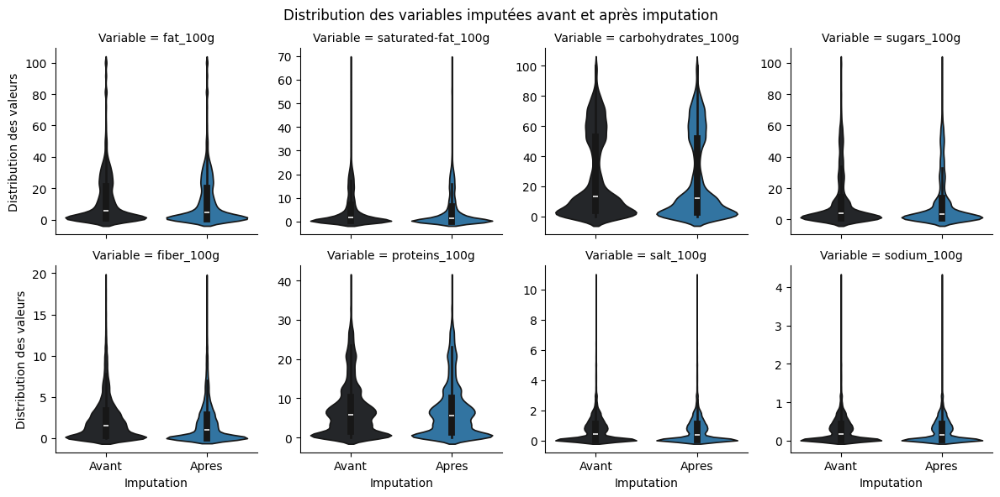

In [53]:
# Appel de la fonction permettant de visualiser les distributions avant et après imputation
violinplot_compar(Data_Food3, Data_Food3_imputed_1, Selected_Features)

Les distributions ne semblent pas avoir été impactées.
Des tests statistiques sont également réalisés pour confirmer cela. 

In [54]:
# Appel de la fonction permettant de comparer statistiquement les distributions avant et après imputation
distribution_compar(Data_Food3, Data_Food3_imputed_1, Selected_Features)

Statistique KS : 0.039, p-value : 2.917486507509106e-34
Les distributions de la variable fat_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.039, p-value : 3.123768506417605e-33
Les distributions de la variable saturated-fat_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.055, p-value : 1.043532598445596e-65
Les distributions de la variable carbohydrates_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.024, p-value : 2.424721697133848e-12
Les distributions de la variable sugars_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.151, p-value : 0.0
Les distributions de la variable fiber_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.025, p-value : 3.968704025632859e-14
Les distributions de la variable proteins_100g avant et après imputation sont significativement différentes. 

Statistique KS :

Les tests statistiques montrent que les distributions avant et après imputation sont significativement différentes pour les 8 variables. Néanmoins a chaque fois la différence est très faible (KS faible)

In [55]:
# Visualisation du taux de valeurs manquantes avant et après l'imputation 
Taux_valeurs_manquantes3_0 = Data_Food3.isnull().mean()*100
Taux_valeurs_manquantes3_1 = Data_Food3_imputed_1.isnull().mean()*100

pd.DataFrame({'before_imputation': Taux_valeurs_manquantes3_0, 'after_imputation': Taux_valeurs_manquantes3_1})

,before_imputation,after_imputation
Variable,,
code,0.000000,0.000000
product_name,0.448571,0.448571
main_category_fr,0.000000,0.000000
nutrition_grade_fr,20.726811,20.726811
additives_n,14.914207,14.914207
carbohydrates_100g,23.548417,18.891747
energy_100g,19.354434,19.354434
fat_100g,22.877129,19.387371
fiber_100g,51.535494,40.053013


Il reste encore un certain nombre de valeurs manquantes pour les variables numériques.

In [56]:
# Création d'une liste contenant les variables que l'on souhaite analyser  
Selected_Features = [ 'energy_100g','fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
                     'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
                     'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 
                  'nutrition-score-fr_100g', 'nutrition_grade_fr']

# Affichage du nombre de valeurs manquantes par lignes avec le nombre de lignes correspondant
Data_Food3_imputed_1[Selected_Features].isnull().sum(axis=1).value_counts(normalize=True).sort_index() * 100

0     32.278302
1     22.855171
2      7.868816
3      7.243013
4      5.051915
5      4.571975
6      2.551837
7      2.848270
8      2.241287
9      2.347941
10     1.195144
11     7.862543
12     0.804605
13     0.247812
14     0.031369
Name: proportion, dtype: float64

Il reste encore des lignes où on a plus de la moitié de valeurs manquantes, on va donc à nouveau utiliser une approche d'imputation qui n'utilise pas les autres variables. Les produits seront regroupés par type et les valeurs manquantes seront remplacées par la moyenne du type du produit. 

## Méthode 2 : Imputation par la moyenne

In [57]:
def impute_na_2(df, group):
    
    """
    Impute les valeurs manquantes dans les variables nutritionnelles sélectionnées en remplaçant les NaN
    par la moyenne calculée au sein de groupes définis dans la DataFrame.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données à imputer, avec les variables listées dans `Selected_Features`.
     - group (str or list of str): Nom ou liste de noms des colonnes servant à définir les groupes pour le calcul de la moyenne.

    Sortie
     - Df_impute (pandas.DataFrame):Copie du DataFrame d'origine avec les valeurs manquantes remplacées par la moyenne calculée par groupe
        pour chaque variable de `Selected_Features`.
    """
    
    # Copie de la dataframe
    Df_impute = df.copy()

    # Imputation des valeurs manquates pour chaque produits par la médiane calculée par catégorie
    for feat in Selected_Features:
        Df_impute[feat] = Df_impute.groupby(group)[feat].transform(lambda x: x.fillna(x.mean()))
    
    return Df_impute

In [58]:
# Création d'une liste contenant les variables que l'on souhaite traiter  
Selected_Features =  ['energy_100g','fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'ingredients_from_palm_oil_n',
                      'ingredients_that_may_be_from_palm_oil_n', 'additives_n',
                     'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

# Définition de la variable sur laquelle on souhaiter grouper les produits
groupes = ['main_category_fr']

# Appel de la fonction 
Data_Food3_imputed_2 = impute_na_2(Data_Food3_imputed_1, groupes)

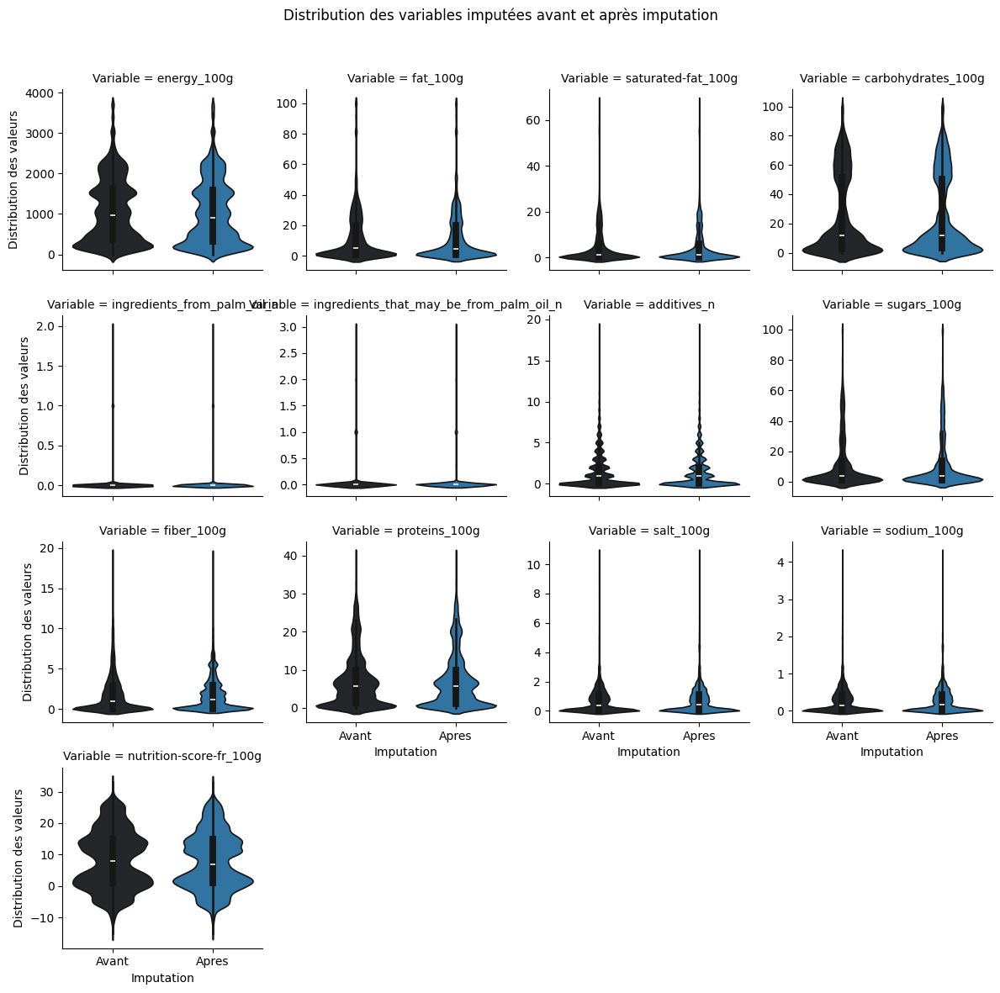

In [59]:
# Appel de la fonction permettant de visualiser les distributions avant et après imputation
violinplot_compar(Data_Food3_imputed_1, Data_Food3_imputed_2, Selected_Features)

In [60]:
# Appel de la fonction permettant de comparer statistiquement les distributions avant et après imputation
distribution_compar(Data_Food3_imputed_1, Data_Food3_imputed_2, Selected_Features)

Statistique KS : 0.034, p-value : 5.32056934896946e-29
Les distributions de la variable energy_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.022, p-value : 5.530131403105199e-12
Les distributions de la variable fat_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.030, p-value : 3.8529433835940076e-22
Les distributions de la variable saturated-fat_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.024, p-value : 4.861884391847297e-15
Les distributions de la variable carbohydrates_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.003, p-value : 0.9873140695354788
Aucune différence significative entre les distributions de la variable ingredients_from_palm_oil_n avant et après imputation. 

Statistique KS : 0.008, p-value : 0.0707943153498779
Aucune différence significative entre les distributions de la variable ingredients_that_may_be_

Après cette étape, les tests statistiques montrent que 
- les distributions avant et après imputation sont significativement différentes pour 11 variable
- les distributions avant et après imputation ne sont pas significativement différentes pour 2 variables

Néanmoins a chaque fois que que la distributions est significativement différentes, la différence est très faible (KS faible)

In [61]:
# Calcul du taux de valeurs manquantes avant et après l'imputation 
Taux_valeurs_manquantes3_0 = Data_Food3.isnull().mean()*100
Taux_valeurs_manquantes3_1 = Data_Food3_imputed_1.isnull().mean()*100
Taux_valeurs_manquantes3_2 = Data_Food3_imputed_2.isnull().mean()*100

# Visualisation du taux de valeurs manquantes avant et après l'imputation 
pd.DataFrame({'before_imputation': Taux_valeurs_manquantes3_0, 
              'after_imputation 1': Taux_valeurs_manquantes3_1,
             'after_imputation 2' : Taux_valeurs_manquantes3_2})

,before_imputation,after_imputation 1,after_imputation 2
Variable,,,
code,0.000000,0.000000,0.000000
product_name,0.448571,0.448571,0.448571
main_category_fr,0.000000,0.000000,0.000000
nutrition_grade_fr,20.726811,20.726811,20.726811
additives_n,14.914207,14.914207,0.000000
carbohydrates_100g,23.548417,18.891747,0.000000
energy_100g,19.354434,19.354434,0.003137
fat_100g,22.877129,19.387371,0.000000
fiber_100g,51.535494,40.053013,0.000000


In [62]:
# Création d'une liste contenant les variables que l'on souhaite analyser  
Selected_Features = ['fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
                     'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g',
                     'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n', 
                  'nutrition-score-fr_100g', 'nutrition_grade_fr']

# Affichage du nombre de valeurs manquantes par lignes avec le nombre de lignes correspondant
Data_Food3_imputed_2[Selected_Features].isnull().sum(axis=1).value_counts(normalize=True).sort_index() * 100

0    79.273189
1    20.723674
6     0.003137
Name: proportion, dtype: float64

Il reste très peu de lignes avec plus d'une valeur manquante. On va réaliser la dernière étape d'imputation en utilisant une méthode d'imputation basée sur la méthode des plus proches voisins.

## Méthode 3 : KNN imputer

La méthode d'imputation par le plus proche voisin repose sur le choix d'un hypermarametre correpsondant au nombre k de voisins à prendre en compte. Afin de selectionner la valeur optimale de k, on va tester plusieurs valeurs et choisir celle qui impacte le moins la distribution des différentes variables imputées. Pour cela nous allons calculer la différences de plusieurs mesures statistiques descriptives (moyenne, médiane, écart type et skewness) avant et après imputation et choisir le k qui minimise l'ensemble de ces écarts de manière à préserver aux mieux la structures des données initiales.

### Test 

In [63]:
Data_Food3_imputed_3_test = Data_Food3_imputed_2.copy()

# Setting d'un random state pour assurer la reproductibilité des résultats
np.random.seed(42) 

# Création d'une liste contenant les variables à traiter
Selected_Features= ['energy_100g','additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n',
       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition-score-fr_100g']

# Selection des variables à traiter
Data_Food3_imputed_3_test=Data_Food3_imputed_3_test[Selected_Features]

# Création d'une variable colonnes pour pouvoir annoter les futures table de résultats
Colonnes = Data_Food3_imputed_3_test.columns

# Normalisation des données
scaler = RobustScaler()

# Transformation des données
Data_Food3_imputed_3_test_scaled = pd.DataFrame(scaler.fit_transform(Data_Food3_imputed_3_test), columns=Colonnes)

# Liste des k à tester
k_values = [3, 5, 7, 9]

# Initialisation de la liste 
results_metrics = []

# Test différentes valeurs de k
for k in k_values:    
    imputer = KNNImputer(n_neighbors=k)
    df_imputed = imputer.fit_transform(Data_Food3_imputed_3_test_scaled)
    df_imputed = scaler.inverse_transform(df_imputed) 
    df_imputed = pd.DataFrame(df_imputed, columns=Colonnes)
 
    # Différence moyenne avant et après imputation
    mean_imputed = pd.DataFrame(df_imputed).mean() 
    mean_diff = abs(mean_imputed - Data_Food3_imputed_3_test.mean())
    
    # Différence médiane avant et après imputation
    median_imputed = pd.DataFrame(df_imputed).median() 
    median_diff = abs(median_imputed - Data_Food3_imputed_3_test.median())
    
    # Différence sdt avant et après imputation
    std_imputed = pd.DataFrame(df_imputed).std() 
    std_diff = abs(std_imputed - Data_Food3_imputed_3_test.std())
    
    # Différence skewness avant et après imputation
    skewness_imputed = pd.DataFrame(df_imputed).skew() 
    skewness_diff = abs(skewness_imputed - Data_Food3_imputed_3_test.skew())
     
    # Boucle pour stocker tous les résultats dans la liste results   
    for feature, diff in mean_diff.items():
        results_metrics.append({'mean_diff': mean_diff[feature], 'k': k, 'variable': feature, 
                        'median_diff' : median_diff[feature], 'std_diff': std_diff[feature],
                       'skewness_diff' : skewness_diff[feature]})
        
# Conversion de la liste en Dataframe      
Results_test_k = pd.DataFrame(results_metrics)

On va visualiser les différences des mesures statistiques avant et après imputation pour chaque valeurs de k et pour chaque variables

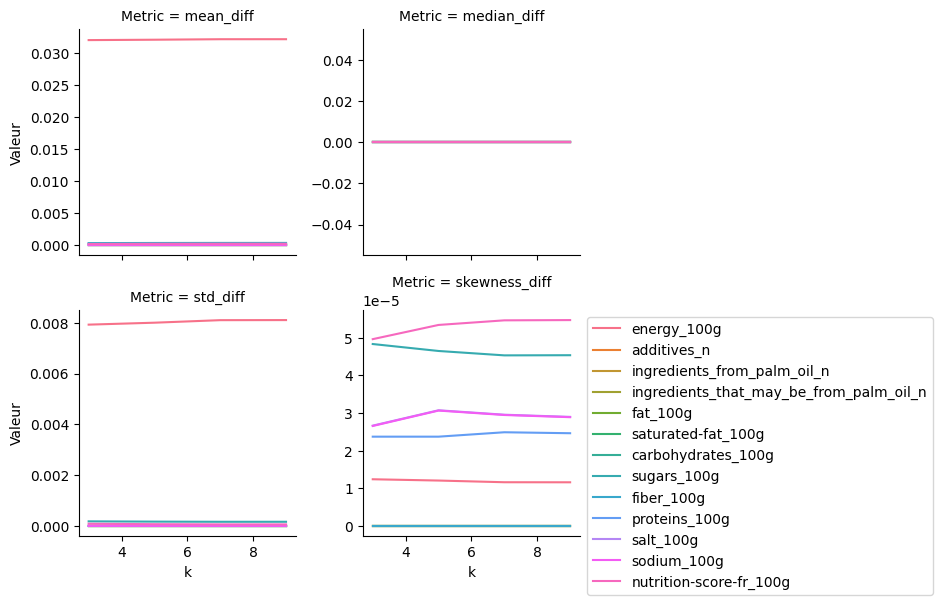

In [64]:
# Reformatage de la table de données pour pouvoir afficher un graphique par mesure
Results_melt = Results_test_k.melt(id_vars=['variable', 'k'], 
                    value_vars=['mean_diff', 'median_diff', 'std_diff', 'skewness_diff'], var_name='Metric', value_name='Valeur')

# Conversion de la variable k en variable numérique
Results_melt['k'] = pd.to_numeric(Results_melt['k'])

# Construction des graphiques
g = sns.FacetGrid(Results_melt, col="Metric", col_wrap=2, sharey=False, height=3)
g.map_dataframe(sns.lineplot, y="Valeur", x='k',  hue='variable')
plt.legend( loc='upper left', bbox_to_anchor=(1, 1))

plt.show()

On observe que selon les variables et la mesure statistique, le k qui minimise le plus l'écart avant et après imputation varie. Nous allons donc pour chaque k, faire la moyenne des différences de chaque variable pour chacune des mesures statistiques et sommer ces résultats afin d'obtenir un score global pour chaque k.
Etant donné que ces mesures peuvent avoir des échelles différentes, nous allons aux préalable normaliser ces données.

In [65]:
# Calcul de la moyenne par variable et par k
Results_melt = Results_melt.groupby(['Metric', 'k'], as_index=False)['Valeur'].mean().rename(columns={'Valeur': 'mean_valeur'})

# Transformation de la table pour avoir les différentes mesures dans plusieurs colonnes
Results =  Results_melt.pivot(index=['k'], columns='Metric', 
                                         values='mean_valeur').reset_index()
# Normalisation des données
scaler = MinMaxScaler()
Results[['mean_diff', 'std_diff', 'median_diff', 'skewness_diff']] = scaler.fit_transform(Results[['mean_diff', 'std_diff', 'median_diff', 'skewness_diff']])

# Somme de chaque écart de mesures pour chaque k
Results['somme']= Results['mean_diff'] + Results['median_diff'] + Results['std_diff'] + Results['skewness_diff']

# Visualisation de la table de résultat
Results

Metric,k,mean_diff,median_diff,skewness_diff,std_diff,somme
0,3,0.000000,0.0,0.000000,0.000000,0.000000
1,5,0.504839,0.0,1.000000,0.366315,1.871154
2,7,0.981590,0.0,0.839014,0.981603,2.802207
3,9,1.000000,0.0,0.703666,1.000000,2.703666


In [66]:
# Stockage du cas optimal
k_optimal = Results.loc[Results['somme'].idxmin(), 'k']

### Imputation

In [67]:
def impute_na_3(df, features, k):
    
    """
    Impute les valeurs manquantes dans un sous-ensemble de variables à l'aide d'un K-Nearest Neighbors Imputer (KNN),
    après normalisation Min-Max des données, puis restaure l'échelle d'origine.

    Paramètres
     - df (pandas.DataFrame): DataFrame contenant les données à imputer.
     - features (list of str): Liste des colonnes sur lesquelles appliquer l'imputation KNN.
     - k (int): Nombre de voisins à utiliser pour l'imputation KNN.

    Sortie
     - Df_impute_finale (pandas.DataFrame): Copie du DataFrame d'origine où les colonnes de `features` ont été imputées via KNN,
     avec les valeurs remises à l'échelle d'origine.
    """

    # Copie de la dataFrame 
    Df_scaled = df[features].copy()

    # Normalisation des données
    scaler = MinMaxScaler()
    Df_scaled = pd.DataFrame(
        scaler.fit_transform(Df_scaled),
        columns=features,
        index=df.index)

    # Imputation avec KNN 
    imputer = KNNImputer(n_neighbors=k)
    df_imputed = pd.DataFrame(
        imputer.fit_transform(Df_scaled),
        columns=features,
        index=Df_scaled.index)
    
    # Normalisation inverse pour revenir aux données d'origine
    df_imputed = scaler.inverse_transform(df_imputed[features])  
    
    # Création de la dataFrame final sans les colonnes originales à imputer
    Df_impute_finale = df.drop(columns=features).copy()

    # Ajout des colonnes imputées 
    Df_impute_finale[features] = df_imputed
 
    return Df_impute_finale

In [68]:
# Création d'une liste contenant les variables à imputer
Selected_Features = ['energy_100g',
    'additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n',
    'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g', 'sugars_100g', 'fiber_100g',
    'proteins_100g', 'salt_100g', 'sodium_100g', 'nutrition-score-fr_100g']

# Ajout d'un random state
np.random.seed(42) 

# Appel de la fonction
Data_Food3_imputed_3= impute_na_3(Data_Food3_imputed_2, Selected_Features, k_optimal)

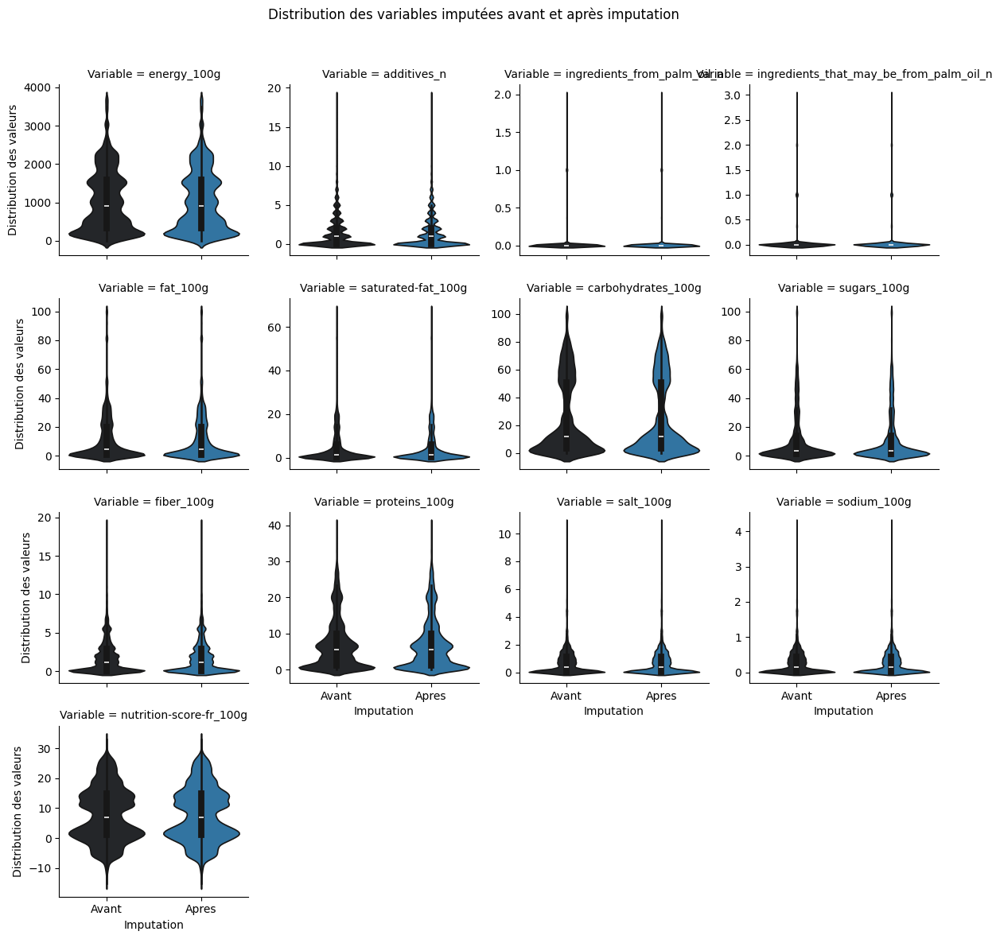

In [69]:
# Appel de la fonction permettant de visualiser les distributions avant et après imputation
violinplot_compar(Data_Food3_imputed_2, Data_Food3_imputed_3, Selected_Features)

In [70]:
# Appel de la fonction permettant de comparer statistiquement les distributions avant et après imputation
distribution_compar(Data_Food3_imputed_2, Data_Food3_imputed_3, Selected_Features)

Statistique KS : 0.006, p-value : 0.2602714559745146
Aucune différence significative entre les distributions de la variable energy_100g avant et après imputation. 

Statistique KS : 0.002, p-value : 0.9964126589998826
Aucune différence significative entre les distributions de la variable additives_n avant et après imputation. 

Statistique KS : 0.000, p-value : 1.0
Aucune différence significative entre les distributions de la variable ingredients_from_palm_oil_n avant et après imputation. 

Statistique KS : 0.003, p-value : 0.983924030301858
Aucune différence significative entre les distributions de la variable ingredients_that_may_be_from_palm_oil_n avant et après imputation. 

Statistique KS : 0.010, p-value : 0.0027967019413738968
Les distributions de la variable fat_100g avant et après imputation sont significativement différentes. 

Statistique KS : 0.010, p-value : 0.003631978122335785
Les distributions de la variable saturated-fat_100g avant et après imputation sont significativ

Après cette étape, les tests statistiques montrent que 
- les distributions avant et après imputation sont significativement différentes pour 8 variables
- les distributions avant et après imputation ne sont pas significativement différentes pour 5 variables

Néanmoins a chaque fois que que la distributions est significativement différentes, la différence est très faible (KS faible)

In [71]:
# Calcul du taux de valeurs manquantes avant et après l'imputation 
Taux_valeurs_manquantes3_0 = Data_Food3.isnull().mean()*100
Taux_valeurs_manquantes3_1 = Data_Food3_imputed_1.isnull().mean()*100
Taux_valeurs_manquantes3_2 = Data_Food3_imputed_2.isnull().mean()*100
Taux_valeurs_manquantes3_3 = Data_Food3_imputed_3.isnull().mean()*100

# Visualisation du taux de valeurs manquantes avant et après l'imputation 
pd.DataFrame({'before_imputation': Taux_valeurs_manquantes3_0, 
              'after_imputation 1': Taux_valeurs_manquantes3_1,
             'after_imputation 2' : Taux_valeurs_manquantes3_2,
             'after_imputation 3' : Taux_valeurs_manquantes3_3})


,before_imputation,after_imputation 1,after_imputation 2,after_imputation 3
Variable,,,,
Imputation,0.000000,0.000000,0.000000,0.000000
additives_n,14.914207,14.914207,0.000000,0.000000
boisson,0.000000,0.000000,0.000000,0.000000
carbohydrates_100g,23.548417,18.891747,0.000000,0.000000
code,0.000000,0.000000,0.000000,0.000000
energy_100g,19.354434,19.354434,0.003137,0.000000
fat_100g,22.877129,19.387371,0.000000,0.000000
fiber_100g,51.535494,40.053013,0.000000,0.000000
ingredients_from_palm_oil_n,12.741930,12.741930,0.000000,0.000000


Il reste encore quelques données manquantes pour les variables nutrition_grade_fr et product_name. 

- La variable nutrition_grade_fr est construite à partir de la variable nutrition-score-fr_100g, et est donc à priori très dépendante de cette variable, nous allons donc pour la suite ne garder qu'une seule des deux variables
- La variable product name ne sera également pas utilisée dans les étapes suivantes


## Table finale

In [72]:
# Vérification des types des variables après imputation
Data_Food3_imputed_3.dtypes

Variable
code                                        object
product_name                                object
main_category_fr                            object
nutrition_grade_fr                          object
boisson                                     object
Imputation                                  object
energy_100g                                float64
additives_n                                float64
ingredients_from_palm_oil_n                float64
ingredients_that_may_be_from_palm_oil_n    float64
fat_100g                                   float64
saturated-fat_100g                         float64
carbohydrates_100g                         float64
sugars_100g                                float64
fiber_100g                                 float64
proteins_100g                              float64
salt_100g                                  float64
sodium_100g                                float64
nutrition-score-fr_100g                    float64
dtype: object

Les différentes étapes d'imputations transformant les valeurs manquantes par des moyennes ont transformé les variables discrètes en variables continues. Nous allons donc reconvertir ces variables en variables discrètes. 

In [73]:
# Conversions des variables supposées être discrètes en variable de type int
Data_Food3_imputed_3[['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']]= Data_Food3_imputed_3[['additives_n', 'ingredients_from_palm_oil_n', 'ingredients_that_may_be_from_palm_oil_n']].round().astype(int)

In [111]:
# Affichage des types des variables
Data_Food3_imputed_3.dtypes

Variable
code                                        object
product_name                                object
main_category_fr                            object
nutrition_grade_fr                          object
boisson                                     object
Imputation                                  object
energy_100g                                float64
additives_n                                  int32
ingredients_from_palm_oil_n                  int32
ingredients_that_may_be_from_palm_oil_n      int32
fat_100g                                   float64
saturated-fat_100g                         float64
carbohydrates_100g                         float64
sugars_100g                                float64
fiber_100g                                 float64
proteins_100g                              float64
salt_100g                                  float64
sodium_100g                                float64
nutrition-score-fr_100g                    float64
dtype: object

In [74]:
# Copie de la dataframe
Data_Food4 = Data_Food3_imputed_3.copy()

# Affichage des 5 premières lignes
Data_Food4.head()

Variable,code,product_name,main_category_fr,nutrition_grade_fr,boisson,Imputation,energy_100g,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,fat_100g,saturated-fat_100g,carbohydrates_100g,sugars_100g,fiber_100g,proteins_100g,salt_100g,sodium_100g,nutrition-score-fr_100g
0,10,Madeleines nature,Gâteaux,d,No,Apres,1900.0,5,0,1,23.0,2.5,55.0,26.0,1.5,6.0,0.66,0.259843,12.0
1,30,Cakes Raisins,Gâteaux,d,No,Apres,1768.0,5,0,1,19.0,2.5,56.0,28.0,1.8,5.8,0.65,0.255906,13.0
2,31,Cakes aux Fruits,Pâtisseries,d,No,Apres,1670.0,11,0,1,15.0,2.0,60.0,34.0,1.5,4.9,0.60,0.236220,12.0
3,50,Financiers aux Amandes,Pâtisseries,e,No,Apres,1868.0,3,0,0,23.0,10.0,51.0,39.0,1.7,8.0,0.55,0.216535,22.0
4,51,Fondants Citron,Pâtisseries,e,No,Apres,1896.0,8,0,0,24.0,10.0,50.0,37.0,2.5,8.1,0.78,0.307087,22.0


# Analyse univariée

## Histogramme

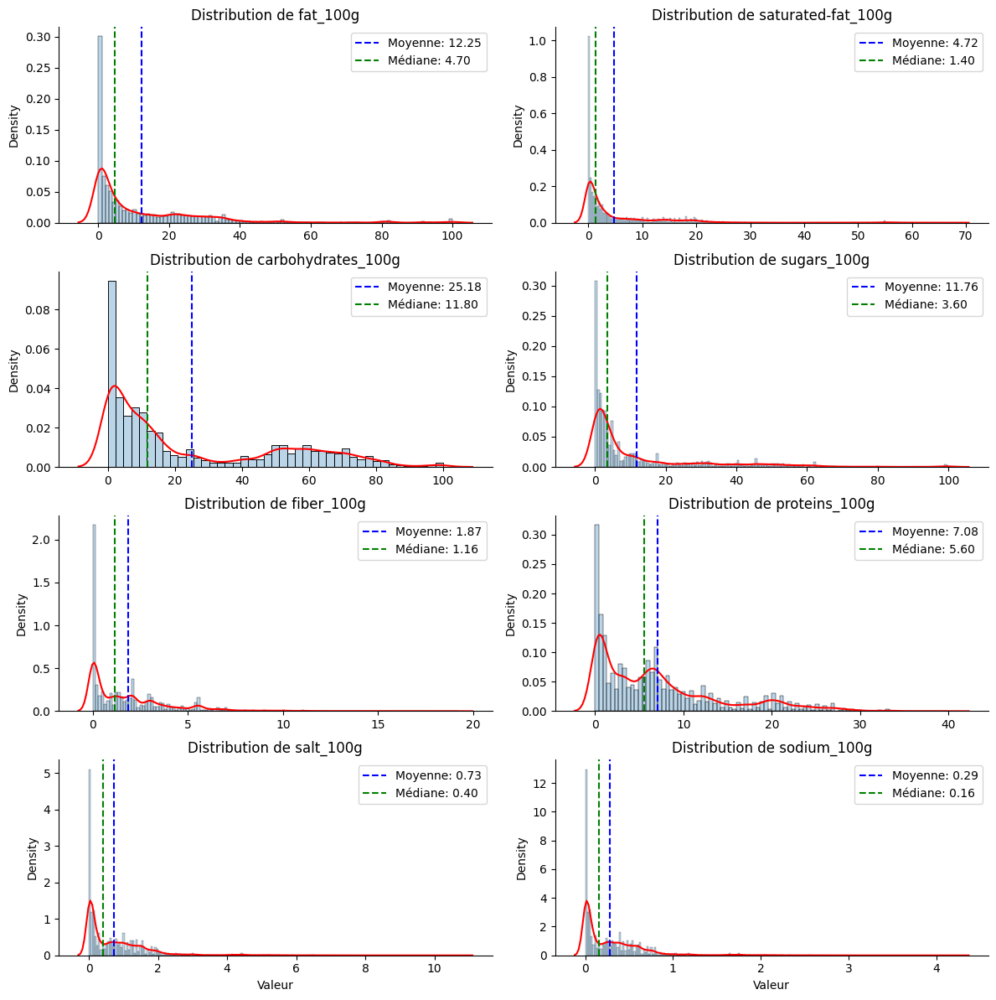

In [75]:
# Création d'une liste contenant les variables à analyser
Selected_Features= ['fat_100g',  'saturated-fat_100g',
                    'carbohydrates_100g',
                    'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g', 'sodium_100g']

# Selection des variables que l'on souhaite visualiser dans les histogrammes
Data_Food_hist = Data_Food4[['code'] + Selected_Features]

# Reformatage de la table pour pouvoir visualiser les histogrammes en grille 
Data_Food_hist = Data_Food_hist.melt(id_vars=['code'], 
                                  var_name="Variable", value_name="Valeur")

# Calcul de la moyenne et de la médiane de chacune des variables
mean_values = Data_Food_hist.groupby('Variable')['Valeur'].mean()
median_values= Data_Food_hist.groupby('Variable')['Valeur'].median()

# Construction des histogrammes
g = sns.FacetGrid(Data_Food_hist, col="Variable", col_wrap=2, sharex= False, sharey=False, height=3, aspect=2)
g.map_dataframe(sns.kdeplot, x="Valeur", color="red", linewidth=1.5)
g.map_dataframe(sns.histplot, x="Valeur", alpha=0.3, kde=False, stat="density")

for ax, variable in zip(g.axes.flat, Data_Food_hist['Variable'].unique()):
    
    # Moyenne et médiane de la variable
    mean_val = mean_values[variable]
    median_val = median_values[variable]
    
    # Ajout de la ligne verticale pour la moyenne
    ax.axvline(mean_val, color='blue', linestyle='--', label=f'Moyenne: {mean_val:.2f}')
    
    # Ajout de la ligne verticale pour la médiane
    ax.axvline(median_val, color='green', linestyle='--', label=f'Médiane: {median_val:.2f}')
    
    # Ajout de la légende
    ax.set_title(f"Distribution de {variable}", fontsize=12)
    ax.legend()

# Affichage du graphique
plt.show()

Chacun de ces histogrammes montrent des distribution asymétriques avec une concentration plus élevé de produits avec des valeurs basses pour les différentes variables nutritives. Certaines variables ont une distribution unimodale tandis que d'autres ont une distribution bi ou multimodales

- fat_100g : La distribution est unimodale avec un mode à 0g.
- saturated-fat : La distribution est bimodale, avec un premier mode à 0g, et un deuxième aux alentours de 12g.
- carbohydrates_100g : La distribution est bimodale avec un mode à 0g et un deuxième aux alentour de 60g.
- sugars_100g : La distribution est unimodale avec un mode à 0g
- fiber_100g : La distribution est multimodale avec un mode à 0g, un deuxième mode aux alentours de 2g, un troisième aux alentours de 3g et un dernier aux alentours de 6g.
- proteins_100g : La distribution est multimodale avec un premier mode à 0g, un deuxieme mode aux alentours de 7g, un troisième aux alentours de 12g et un dernier aux alentours de 20g.
- salt_100g : La distribution est unimodale avec un mode à 0g.
- sodium_100g : La distribution est unimodale avec un mode à 0g.

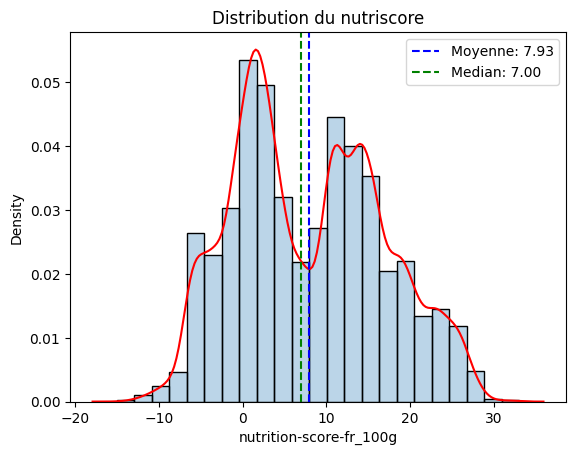

In [76]:
# Calcul de la moyenne et de la médiane de la variable du nutriscore
mean_val = Data_Food4["nutrition-score-fr_100g"].mean()
median_val = Data_Food4["nutrition-score-fr_100g"].median()

# Construction de l'histogramme
sns.kdeplot(x="nutrition-score-fr_100g", color="red", linewidth=1.5, data=Data_Food4)
sns.histplot(x="nutrition-score-fr_100g", alpha=0.3, kde=False, stat="density", data=Data_Food4, bins=23)
plt.axvline(mean_val, color='blue', linestyle='--', label=f'Moyenne: {mean_val:.2f}')
plt.axvline(median_val, color='green', linestyle='--', label=f'Median: {median_val:.2f}')
plt.legend()
plt.title("Distribution du nutriscore")
plt.show()

La variable nutrition-score-fr_100g a une distribution plutôt symétrique et multimodale. On observe une forte quantité de produits avec des scores aux alentours de 2 et aux alentours de 12. Les valeurs aux extrémités de la courbe de distrbution sont rarement atteintes indiquant qu'on a peu de produits avec des scores très faibles ou très élevés. 

## Pie chart

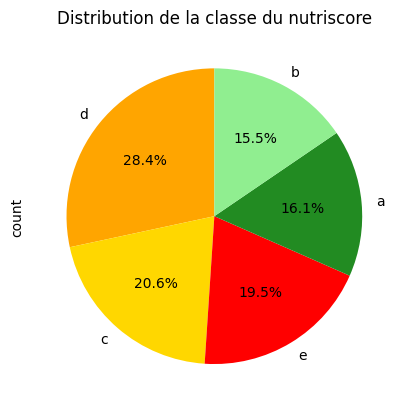

In [77]:
# Création d'un dictionnaire contenant les correspondance entre les couleurs et la classe de nutrition_grade_fr
Colors_groupe = {'a': 'forestgreen', 
                 'b': 'lightgreen',
                 'c': 'gold',
                 'd': 'orange',
                 'e': 'red'}

# Calcul des effectifs et pourcentages
value_counts = Data_Food["nutrition_grade_fr"].value_counts()
percentages = value_counts / value_counts.sum() * 100

# Construction du pie chart 
value_counts.plot(kind='pie', 
                  colors=[Colors_groupe[val] for val in value_counts.index], 
                  autopct='%1.1f%%', 
                  startangle=90, 
                  legend=False)

plt.title('Distribution de la classe du nutriscore', fontsize=12)
plt.show()

La majorité des produits analysés obtiennent un score de classe D, ce qui indique une qualité nutritionnelle globalement mauvaise. À l'inverse, les classes B et A, qui correspondent à des produits de meilleure qualité nutritionnelle, sont nettement sous-représentées. Cela suggère que, dans l’ensemble, les produits présentent des profils nutritionnels de mauvaise qualité.

## countplot

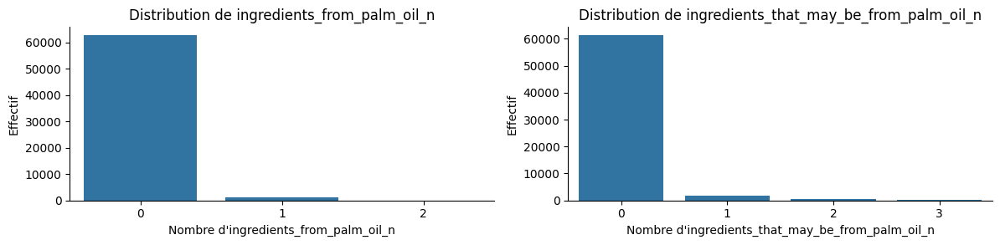

In [78]:
# Création d'une liste contenant les variables à analyser
Selected_Features = ['code', 'ingredients_from_palm_oil_n',
                     'ingredients_that_may_be_from_palm_oil_n']

# Sélection des variables que l'on souhaite visualiser dans les countplots
Data_Food_bar = Data_Food4[Selected_Features]

# Reformatage de la table pour pouvoir visualiser les countplots en grille
Data_Food_bar = Data_Food_bar.melt(id_vars=['code'], 
                                    var_name="Variable", value_name="Valeur")

# Construction des countplots 
g = sns.FacetGrid(Data_Food_bar, col="Variable", col_wrap=3, sharex=False, sharey=False, height=3, aspect=2)
g.map_dataframe(sns.countplot, x="Valeur")

axes = g.axes.flatten()

for ax, variable_value in zip(axes, g.col_names):
    ax.set_xlabel(f"Nombre d'{variable_value}", fontsize=10)
    ax.set_ylabel("Effectif", fontsize=10)
    ax.set_title(f"Distribution de {variable_value}", fontsize=12)
    
plt.show()

La plupart des produits ne contiennent pas d'ingrédients dérivés d'huile de palm. Ils en contiennent trois au maximum. On peut regarder également la distribution du nombre d'additifs.

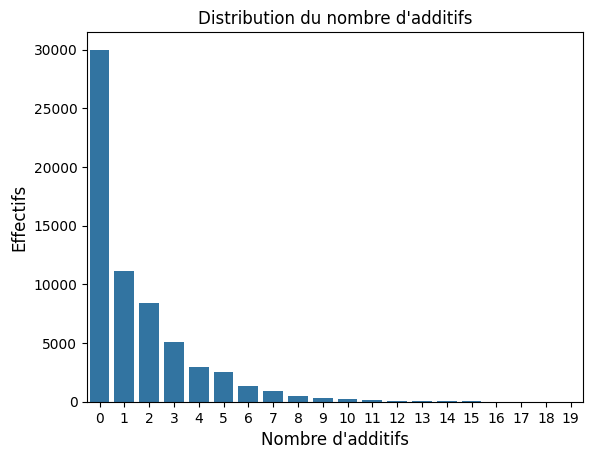

In [79]:
# Construction du countplot
sns.countplot(data=Data_Food4, x="additives_n")
plt.title("Distribution du nombre d'additifs")
plt.ylabel('Effectifs', fontsize=12)
plt.xlabel("Nombre d'additifs", fontsize=12)
plt.show()

De nouveau, la majorité des produits ne contiennent pas d'additifs. Ils en contiennent au maximum 19. 

# Analyses bivariées

On va analyser la dépendance entre les différentes variables explicatives et la variable cible afin de mieux comprendre leurs relations. Cette analyse permettra d’identifier quelles variables influencent le plus la variable cible, en détectant des tendances, des corrélations ou des interactions significatives. Cette étape permettra également d'évaluer la pertinence de chaque variable pour la modélisation prédictive

## Analyses variables explicatives vs variable cible 

Dans cette partie, on va analyser la dépendance entre la variable cible et les différentes variables numériques. Pour cela on va faire un test ANOVA qui permet de comparer les moyennes de plusieurs groupes et d’évaluer s’il existe des différences significatives entre eux. Si les prérequis nécessaires à l’application de l’ANOVA (comme la normalité des données et l’homogénéité des variances) ne sont pas respectés, on utilisera le  test de Kruskal-Wallis, qui est une alternative non paramétrique permettant également de tester des différences entre plusieurs groupes. Ces analyses nous permetteront de mieux comprendre les relations entre les variables et à identifier celles qui influencent significativement la variable cible.

In [80]:
def boxplot_cible_vs_explic(df_brute, df_final, variable):
   
    """
    Affiche un boxplot comparant la distribution d'une variable explicative en fonction des groupes d'une variable cible catégorielle.

    La fonction réalise une jointure entre un DataFrame brut contenant la variable cible et un DataFrame final contenant les variables explicatives,
    puis trace la distribution de la variable choisie selon les groupes de la variable cible.

    Paramètres
     - df_brute (pandas.DataFrame): DataFrame contenant la variable cible et la colonne 'code' pour l'identification des produits.
     - df_final (pandas.DataFrame): DataFrame contenant la variable explicative et la colonne 'code' pour la jointure.
     - variable (str): Nom de la variable explicative continue à visualiser en boxplot.
    """

   
    # Isolation de la variable cible et du code produit pour joindre la variable cible au jeu de données final
    Df_cible = df_brute[['code', 'pnns_groups_1']]
    
    # Jointure sur le jeu de données final
    Df_analyse = pd.merge(df_final, Df_cible, on=['code'], how='left')
    
    # Selection des variables
    Df_analyse = Df_analyse[[variable, 'pnns_groups_1']]
    
    # Construction des boxplots
    plt.figure(figsize=(8, 10))
    sns.boxplot(data=Df_analyse, x=variable, y='pnns_groups_1', orient='horizontal')
    plt.title(f'Distribution de {variable} en fonction des groupes de la variable cible')
    plt.savefig(f'../Output/Analyses_bivariées/Distribution de {variable} en fonction des groupes de la variable cible map.png', format='png')

In [81]:
def countplot_cible_vs_explic(df_brute, df_final, variable, colors_graph):
    
    """
    Affiche un graphique en barres (countplot) montrant la distribution arrondie d'une variable explicative
    en pourcentage, selon les groupes d'une variable cible catégorielle.

    La fonction réalise une jointure entre un DataFrame brut contenant la variable cible et un DataFrame final
    contenant les variables explicatives, arrondit la variable explicative, calcule les pourcentages par groupe,
    puis génère un barplot horizontal coloré.

    Paramètres
     - df_brute (pandas.DataFrame): DataFrame contenant la variable cible 'pnns_groups_1' et la colonne 'code' pour l'identification.
     - df_final (pandas.DataFrame): DataFrame contenant la variable explicative et la colonne 'code' pour la jointure.
     - variable (str): Nom de la variable explicative numérique à analyser (sera arrondie avant le calcul des proportions).
     - colors_graph (list or dict): Palette de couleurs à utiliser pour les différentes modalités de la variable explicative.
    """
    
    # Isolation de la variable cible et du code produit pour joindre la variable cible au jeu de données final
    Df_cible = df_brute[['code', 'pnns_groups_1']]
    
    # Jointure sur le jeu de données final
    Df_analyse = pd.merge(df_final, Df_cible, on=['code'], how='left')
    
    # Selection des variables
    Df_analyse = Df_analyse[[variable, 'pnns_groups_1']]
    
    # transformation des valeurs pour les arrondir
    Df_analyse[variable] = round(Df_analyse[variable])
    Df_analyse['percent'] = Df_analyse.groupby('pnns_groups_1')[variable].transform(lambda  x: (x.value_counts(normalize=True) * 100).reindex(x).values)
    
    # Construction des countplots
    plt.figure(figsize=(8, 10))  
    sns.barplot(data=Df_analyse, hue=variable, y='pnns_groups_1', x='percent', orient='horizontal', palette=colors_graph)
    plt.legend(title=variable, loc='upper left', bbox_to_anchor=(1, 1))
    plt.title(f'Distribution de {variable} en fonction des groupes de la variable cible')
    plt.savefig(f'../Output/Analyses_bivariées/Distribution de {variable} en fonction des groupes de la variable cible map.png', format='png')

In [82]:
def analyse_lien_cible_explic(df_brute, df_final, variable):
    
    """
    Analyse statistique de la relation entre une variable explicative continue et une variable cible catégorielle.

    La fonction réalise une jointure entre un DataFrame brut contenant la variable cible et un DataFrame final contenant la variable explicative,
    filtre les groupes de la variable cible avec au moins 3 échantillons, puis effectue :
    - un test de normalité (Shapiro-Wilk si n < 5000, sinon Kolmogorov-Smirnov) pour chaque groupe,
    - un test d'homogénéité des variances (Levene),
    - un test de comparaison de moyennes (ANOVA si normalité et homogénéité vérifiées, sinon test de Kruskal-Wallis),
    - le calcul d'une taille d'effet adaptée (eta carré pour ANOVA, r pour Kruskal-Wallis),
    et affiche les résultats.

    Paramètres
     - df_brute (pandas.DataFrame): DataFrame contenant la variable cible catégorielle 'pnns_groups_1' et la colonne 'code'.
     - df_final (pandas.DataFrame): DataFrame contenant la variable explicative continue ainsi que la colonne 'code' pour la jointure.
     - variable (str): Nom de la variable explicative continue à analyser.
    """

    # Isolation de la variable cible et du code produit pour joindre la variable cible au jeu de données final
    Df_cible = df_brute[['code', 'pnns_groups_1']]

    # Jointure sur le jeu de données final
    Df_analyse = pd.merge(df_final, Df_cible, on=['code'], how='left')    

    # Filtrage des groupes avec au moins 3 échantillons
    Df_analyse = Df_analyse.groupby('pnns_groups_1').filter(lambda x: len(x) >= 3)

    # Création des groupes
    groupes = {}
    for group in Df_analyse["pnns_groups_1"].unique():
        groupe = Df_analyse[Df_analyse["pnns_groups_1"] == group][variable].dropna()
        groupes[group] = groupe

    groupe_val = list(groupes.values())

    # Test de normalité : Shapiro si taille < 5000, sinon Kolmogorov-Smirnov
    compteur = 0
    for group in Df_analyse['pnns_groups_1'].unique():
        group_data = Df_analyse[Df_analyse['pnns_groups_1'] == group][variable].dropna()

        # Si le nombre d'échantillons est inférieur à 5000, on effectue le test de Shapiro-Wilk
        if len(group_data) < 5000:
            stat, p = stats.shapiro(group_data)
            print(f"Shapiro test : {group} : stat = {stat:.3f}, p-value = {p}")
            if p < 0.05:
                compteur += 1
        else:
            # Sinon, on effectue le test de Kolmogorov-Smirnov
            stat, p = stats.kstest(group_data, 'norm')
            print(f"Kolmogorov-Smirnov test: {group} : stat = {stat:.3f}, p-value = {p}")
            if p < 0.05:
                compteur += 1
    
    # Affichage des résultats
    print(f'\n{compteur} groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA \n{"-" * 70}\n')

    # Stockage du résultat sur la normalité
    if compteur > 0:
        Normalité = "No"
    else:
        Normalité = "Yes"

    # Test d'homogénéité des variances 
    stat, p_value = stats.levene(*groupe_val)
    print(f'Statistique de Levene : {stat:.3f}, p-value : {p_value}')

    # Affichage des résultats
    if p_value > 0.05:
        print(f'Les variances sont homogènes, on peut faire une ANOVA.\n{"-" * 70}\n ')
        Variance = "Homogène"
    else:
        print(f'Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA\n{"-" * 70}\n')
        Variance = 'pas_homogene'

    # Test de comparaison (ANOVA ou Kruskal-Wallis selon les résultats des tests de normalité et d'homogénéité des variances)
    if (Normalité == "Yes") and (Variance == "Homogène"):
        stat, p_value = stats.f_oneway(*groupe_val)
        print(f'Statistique ANOVA : {stat:.3f}, p-value : {p_value}')
        
         # Calcul de la taille d'effet (eta carré)
        ss_inter = sum([len(group) * (group.mean() - np.mean(np.concatenate(groupe_val)))**2 for group in groupe_val])
        ss_total = sum([(x - np.mean(np.concatenate(groupe_val)))**2 for group in groupe_val for x in group])
        eta_squared = ss_inter / ss_total
        print(f"Eta carré (taille d'effet) : {eta_squared:.3f}")
        if p_value < 0.05:
            print(f'il existe une relation entre la variable cible et {variable}')
        else:
            print(f"il n'existe pas de relation entre la variable cible et {variable}")
    else:
        # Utilisation du test de Kruskal-Wallis si normalité ou homogénéité des variances échoue
        stat, p_value = stats.kruskal(*groupe_val) 
        print(f'Statistique de Kruskal-Wallis : {stat:.3f}, p-value : {p_value}')
        
        # Calcul de la taille d'effet pour Kruskal-Wallis (r)
        N = sum(len(group) for group in groupe_val)
        k = len(groupes)
        eta_sq = (stat - k + 1) / (N - k)
        print(f"Taille d'effet (r de Kruskal-Wallis) : {eta_sq:.3f}")
        
        if p_value < 0.05:
            print(f'il existe une relation entre la variable cible et {variable}')
        else:
            print(f"il n'existe pas de relation entre la variable cible et {variable}")

In [83]:
def pairwise_analyses(df_brute, df_final, variable, top, alpha=0.05, p_adjust_method='bonferroni'):
    
    """
    Réalise des tests de comparaisons par paires (Mann-Whitney U) entre groupes d'une variable catégorielle sur une variable continue,
    avec correction des p-values pour comparaisons multiples.

    La fonction :
    - Joint le DataFrame contenant la variable cible catégorielle avec celui des variables explicatives,
    - Filtre les groupes avec au moins 3 observations,
    - Effectue pour chaque paire de groupes un test de Mann-Whitney U bilatéral,
    - Calcule la moyenne de la variable explicative dans chaque groupe,
    - Calcule une taille d'effet (r) dérivée de la statistique U,
    - Corrige les p-values pour comparaisons multiples (par défaut méthode Bonferroni),
    - Retourne les `top` résultats les plus significatifs triés par taille d'effet.

    Paramètres
     - df_brute (pandas.DataFrame): DataFrame contenant la variable cible catégorielle 'pnns_groups_1' et la colonne 'code'.
     - df_final (pandas.DataFrame): DataFrame contenant la variable explicative continue ainsi que la colonne 'code' pour la jointure.
     - variable (str): Nom de la variable explicative continue à analyser.
     - top (int): Nombre maximal de résultats significatifs à retourner (triés par taille d'effet).
     - alpha -float, optionnel (par défaut=0.05)): Seuil de significativité pour filtrer les résultats corrigés.
     - p_adjust_method (str, optionnel (par défaut='bonferroni')): Méthode de correction des p-values pour comparaisons multiples, 
     options possibles : 'bonferroni', 'holm', 'fdr_bh', etc.

    Sortie
     - pandas.DataFrame: DataFrame contenant pour chaque paire de groupes :
        - Les noms des groupes comparés,
        - Les moyennes dans chaque groupe,
        - La statistique U,
        - La p-value brute,
        - La p-value corrigée,
        - La taille d'effet r,
        uniquement pour les comparaisons significatives au seuil corrigé alpha,
        triées par taille d'effet décroissante, limitées aux `top` premiers.
    """

    # Isolation de la variable cible et du code produit pour joindre la variable cible au jeu de données final
    Df_cible = df_brute[['code', 'pnns_groups_1']]

    # Jointure sur le jeu de données final
    Df_analyse = pd.merge(df_final, Df_cible, on=['code'], how='left')    

    # Filtre des groupes avec au moins 3 échantillons
    Df_analyse = Df_analyse.groupby('pnns_groups_1').filter(lambda x: len(x) >= 3)
    
    # Récupération des groupes uniques
    groups = Df_analyse['pnns_groups_1'].unique()
    
    # Création d'une liste pour stocker les résultats
    results = []
    
    # Test de Mann-Whitney pour chaque paire de groupes
    for group1, group2 in combinations(groups, 2):
        
        # Extraction des données pour chaque groupe
        data_group1 = Df_analyse[Df_analyse['pnns_groups_1'] == group1][variable]
        data_group2 = Df_analyse[Df_analyse['pnns_groups_1'] == group2][variable]
        
        # Calcul de la moyenne des groupes 1 et 2
        mean_group1 = data_group1.mean()
        mean_group2 = data_group2.mean()
    
        # Test de Mann-Whitney
        U_stat, p_value = stats.mannwhitneyu(data_group1, data_group2, alternative='two-sided')
        
        # Calcul de la taille d'effet (r) à partir de U-stat
        n1, n2 = len(data_group1), len(data_group2)
        r = U_stat / (n1 * n2)
        
        # Stockage résultat brut
        results.append({
            'Group 1': group1,
            'Mean_Group1' : mean_group1,
            'Group 2': group2,
            'Mean_Group2' : mean_group2,
            'U-stat': U_stat,
            'p-value': p_value,
            'Taille d\'effet (r)': r})
    
    # Conversion de la liste de résultats en dataFrame
    results_df = pd.DataFrame(results)
    
    # Correction des p-values
    results_df['p-corr'] = multipletests(results_df['p-value'], method=p_adjust_method)[1]
    
    # Filtre des résultats significatifs
    significant_results = results_df[results_df['p-corr'] < alpha]
    significant_results = significant_results.sort_values("Taille d'effet (r)", ascending = False).head(top)
 
    return significant_results


Kolmogorov-Smirnov test: Sugary snacks : stat = 0.982, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.711, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.674, p-value = 6.166475184639954e-70
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.634, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.614, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.671, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.772, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.604, p-value = 4.023320051793378e-61

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 2713.749, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Stat

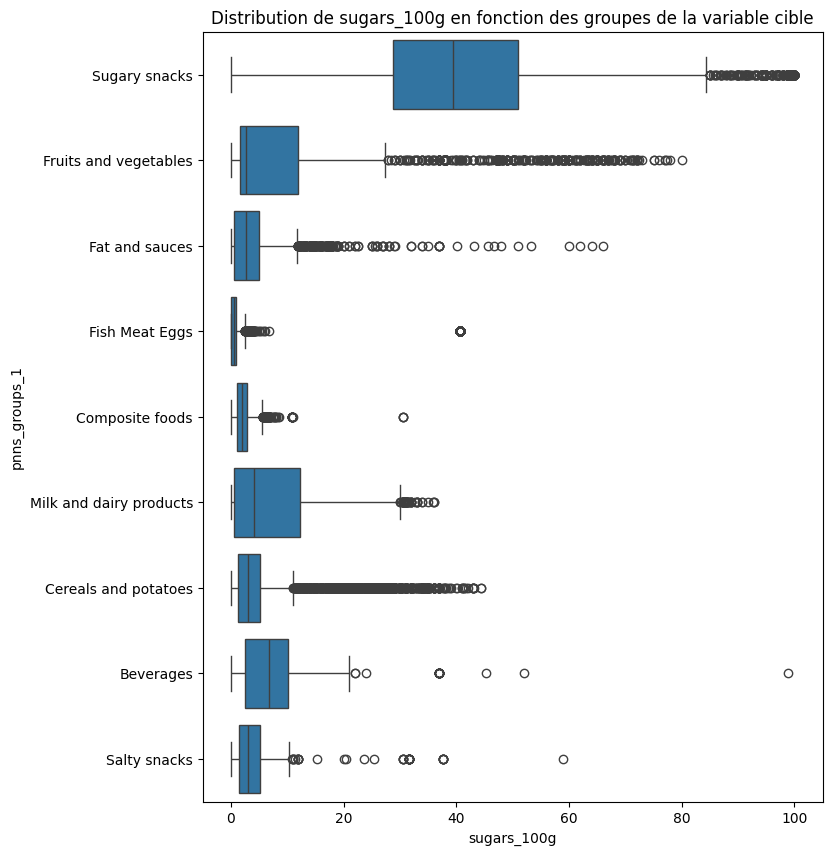

In [84]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'sugars_100g')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'sugars_100g')

boxplot_cible_vs_explic(Data_Food, Data_Food4, 'sodium_100g')    
analyse_lien_cible_explic(Data_Food, Data_Food4, 'sodium_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.500, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.832, p-value = 3.286877247618166e-57
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.662, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.640, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.505, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.974, p-value = 1.5248221232350263e-21

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 2109.182, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Sta

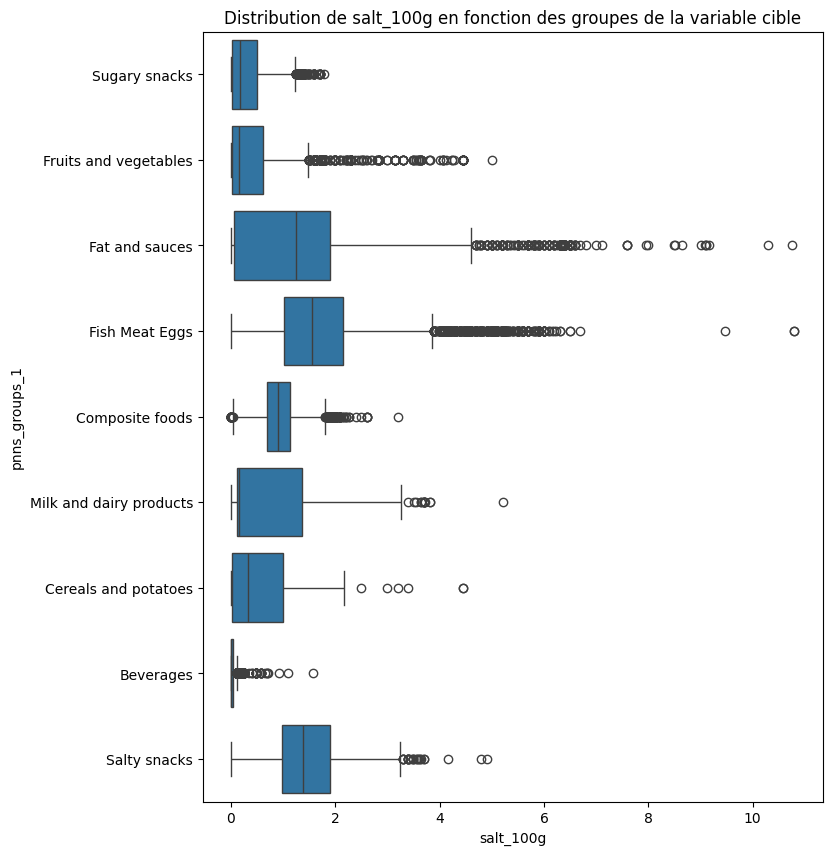

In [85]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'salt_100g')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'salt_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.500, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.832, p-value = 3.271656940143432e-57
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.508, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.533, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.974, p-value = 1.5743909821605204e-21

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 2110.011, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Sta

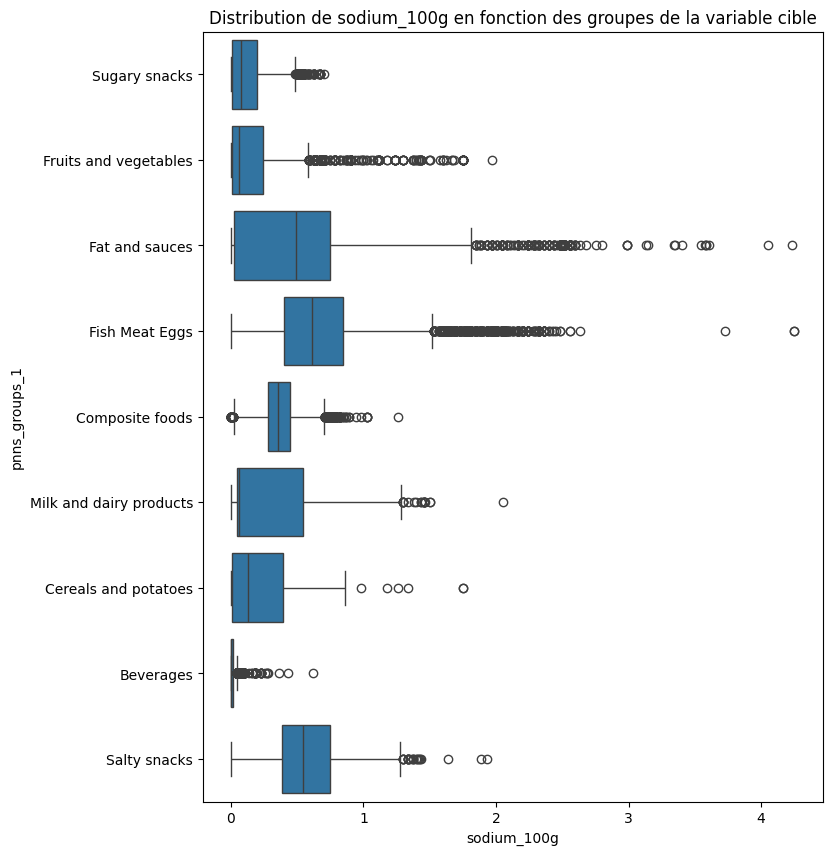

In [86]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'sodium_100g')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'sodium_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.771, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.500, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.833, p-value = 4.3543770844353086e-57
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.878, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.835, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.844, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.683, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.975, p-value = 3.40712778540537e-21

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 6196.967, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Stat

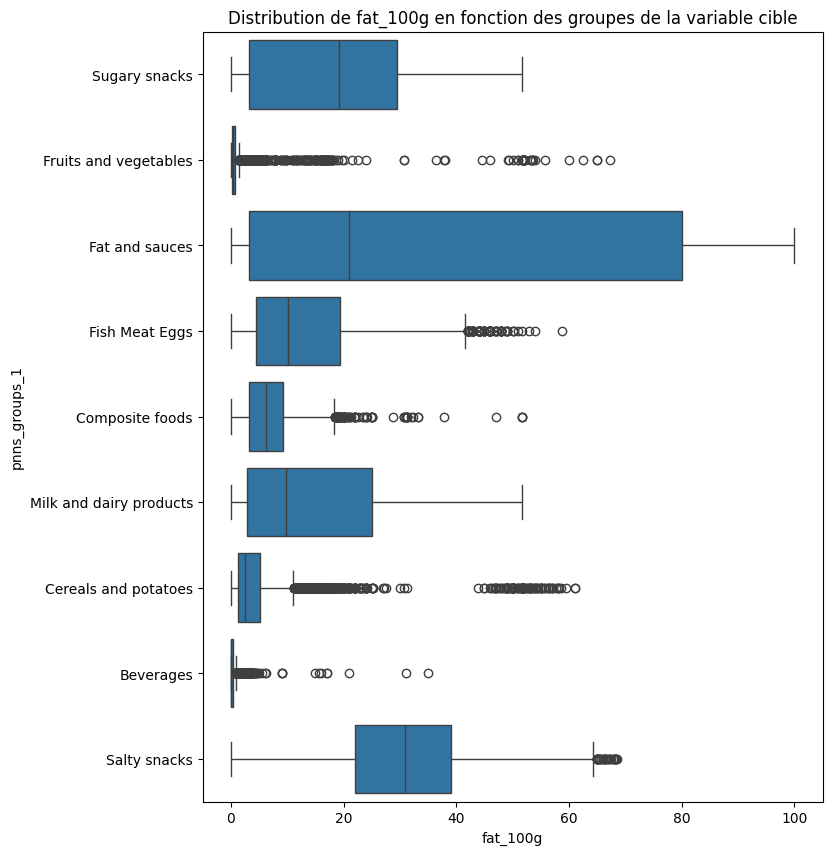

In [87]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'fat_100g')   
analyse_lien_cible_explic(Data_Food, Data_Food4, 'fat_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.680, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.500, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.610, p-value = 1.4965156271221486e-73
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.669, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.532, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.732, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.806, p-value = 1.1050908453584387e-48

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 3055.875, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

St

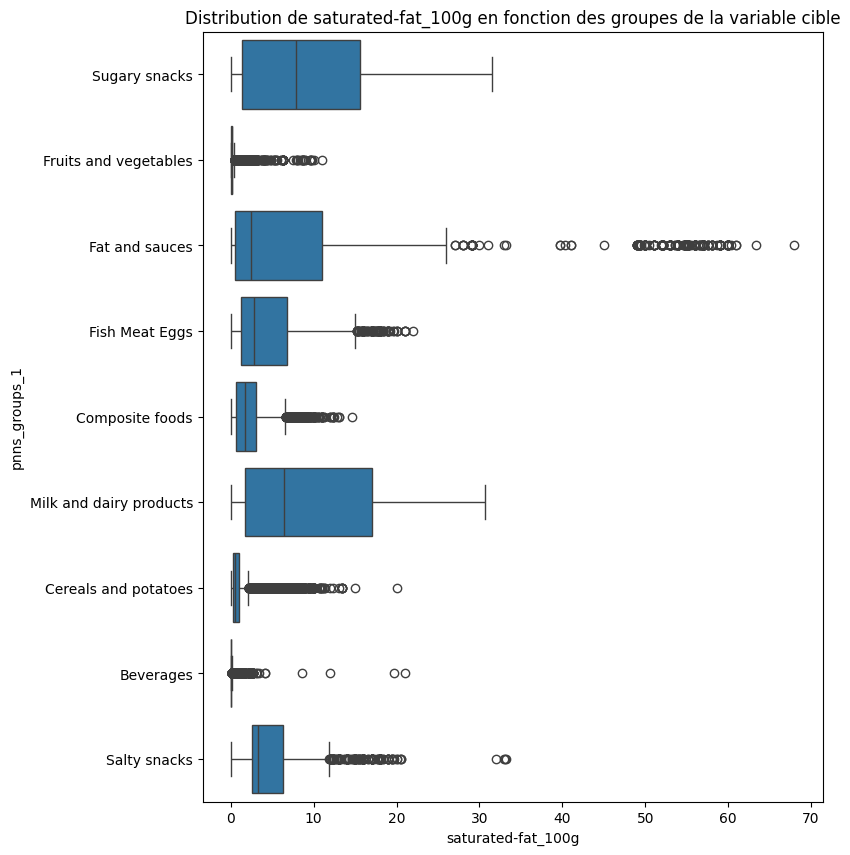

In [88]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'saturated-fat_100g') 
analyse_lien_cible_explic(Data_Food, Data_Food4, 'saturated-fat_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.660, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.766, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.815, p-value = 5.517264435558495e-59
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.696, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.835, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.924, p-value = 1.1800998363230278e-34

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 2455.964, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Sta

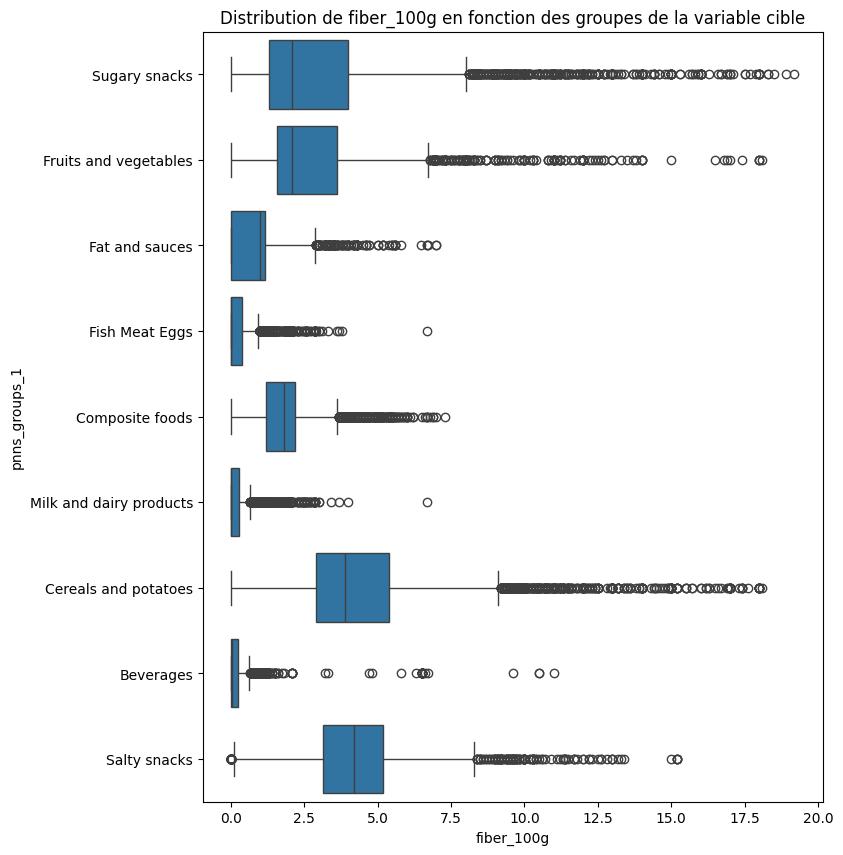

In [89]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'fiber_100g')  
analyse_lien_cible_explic(Data_Food, Data_Food4, 'fiber_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.798, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.591, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.654, p-value = 4.240481983209098e-71
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.993, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.846, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.941, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.960, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.856, p-value = 6.228235314538005e-44

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 2194.238, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Stat

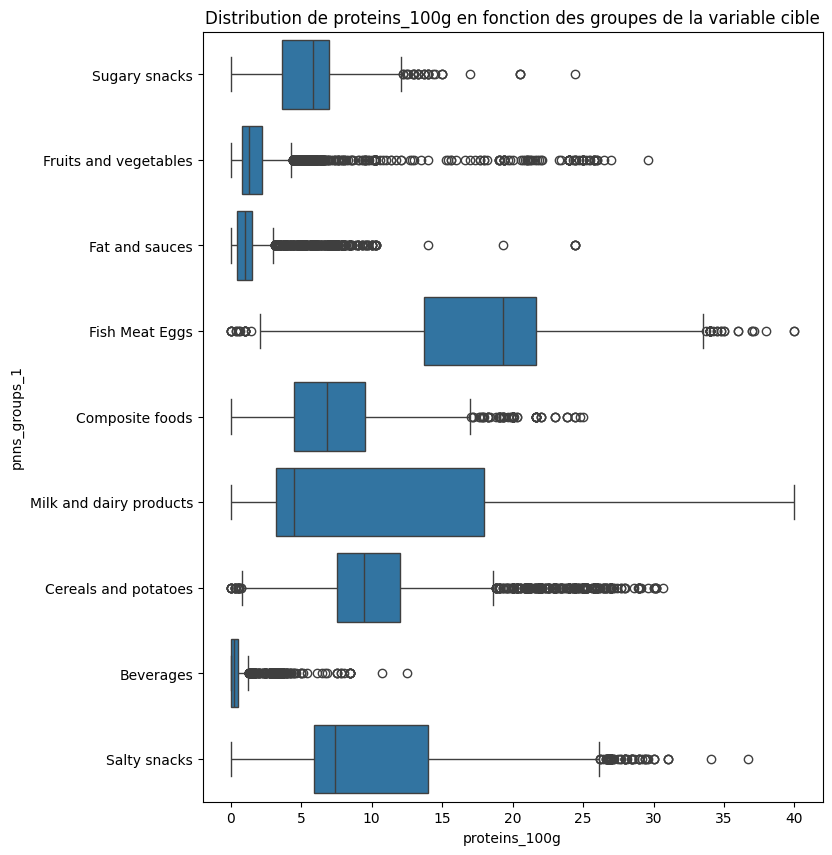

In [90]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'proteins_100g')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'proteins_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 1.000, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 1.000, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.857, p-value = 2.4230615319807555e-54
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 1.000, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 1.000, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 1.000, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 1.000, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.962, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.866, p-value = 7.931909427098567e-43

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 3421.824, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Sta

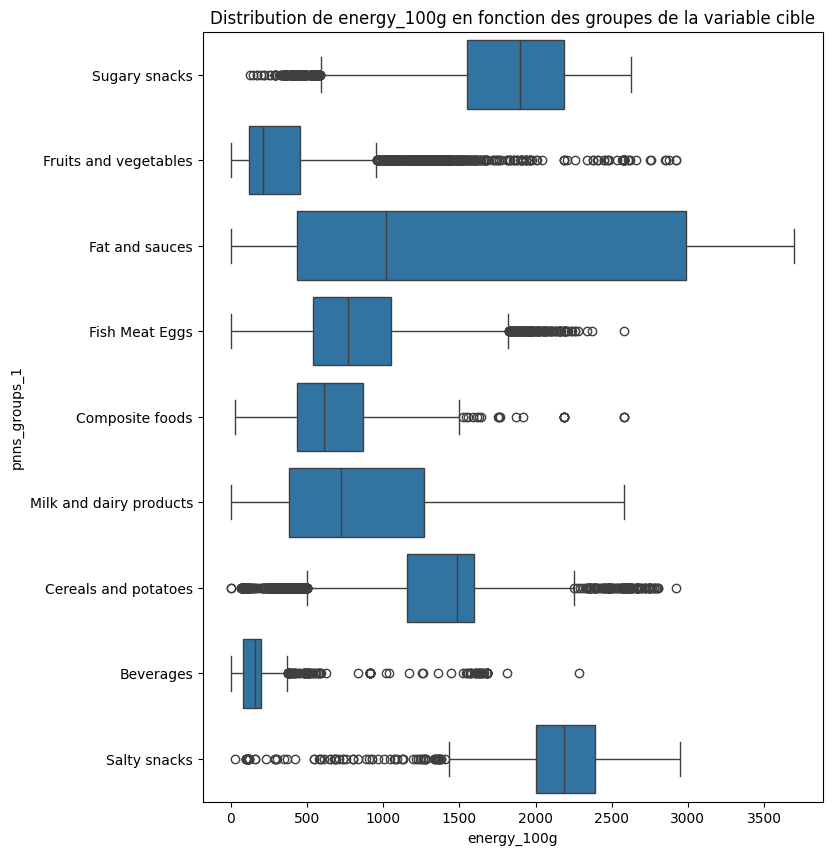

In [91]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'energy_100g')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'energy_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.968, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.580, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.980, p-value = 1.9289773940355842e-25
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.824, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.498, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.740, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.392, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.822, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.982, p-value = 4.647970054414335e-18

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 519.778, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Stat

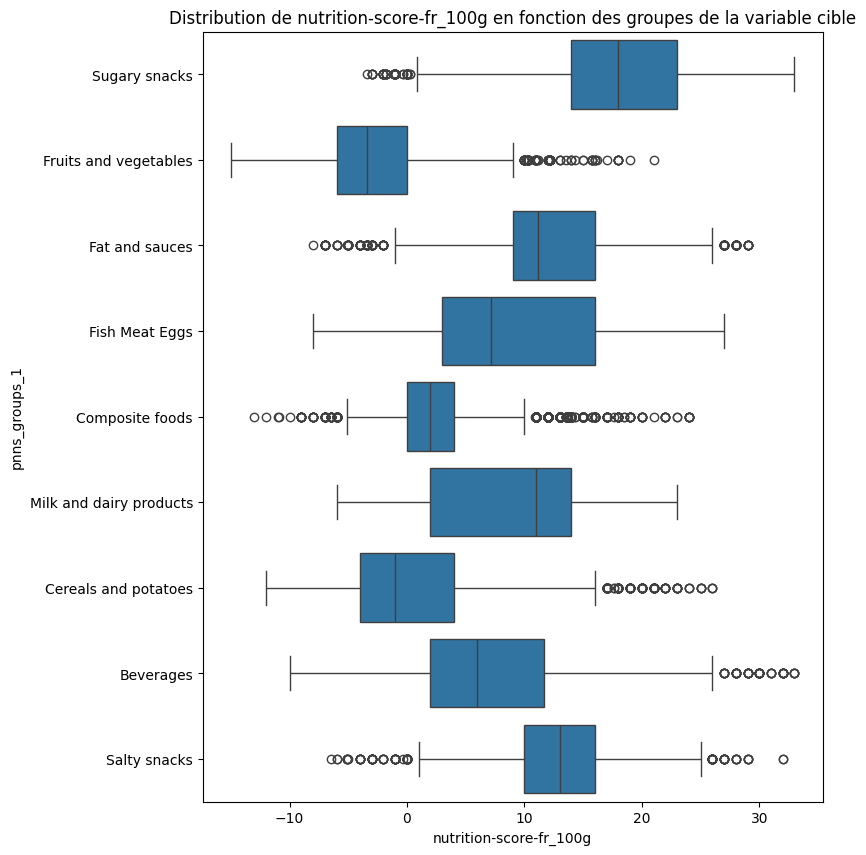

In [92]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'nutrition-score-fr_100g')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'nutrition-score-fr_100g')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.655, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.500, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.778, p-value = 2.1976240770703076e-62
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.572, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.722, p-value = 8.63977512665429e-55

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 779.875, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Stati

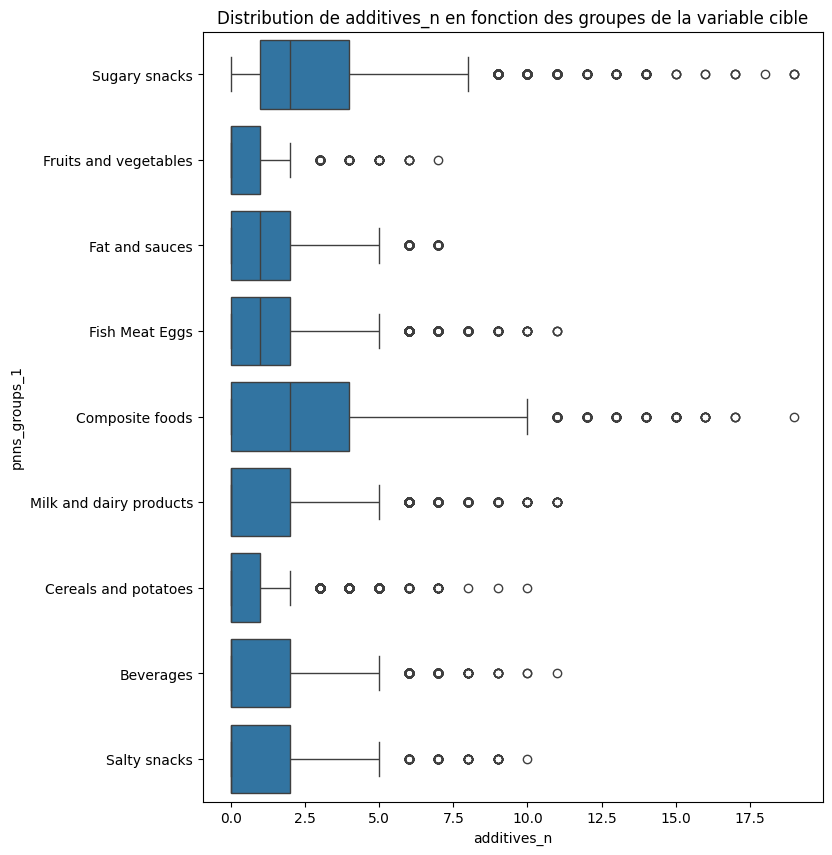

In [93]:
boxplot_cible_vs_explic(Data_Food, Data_Food4, 'additives_n')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'additives_n')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.500, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.031, p-value = 1.3515339496645165e-93
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.022, p-value = 5.854276556929658e-79

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 551.998, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Stat

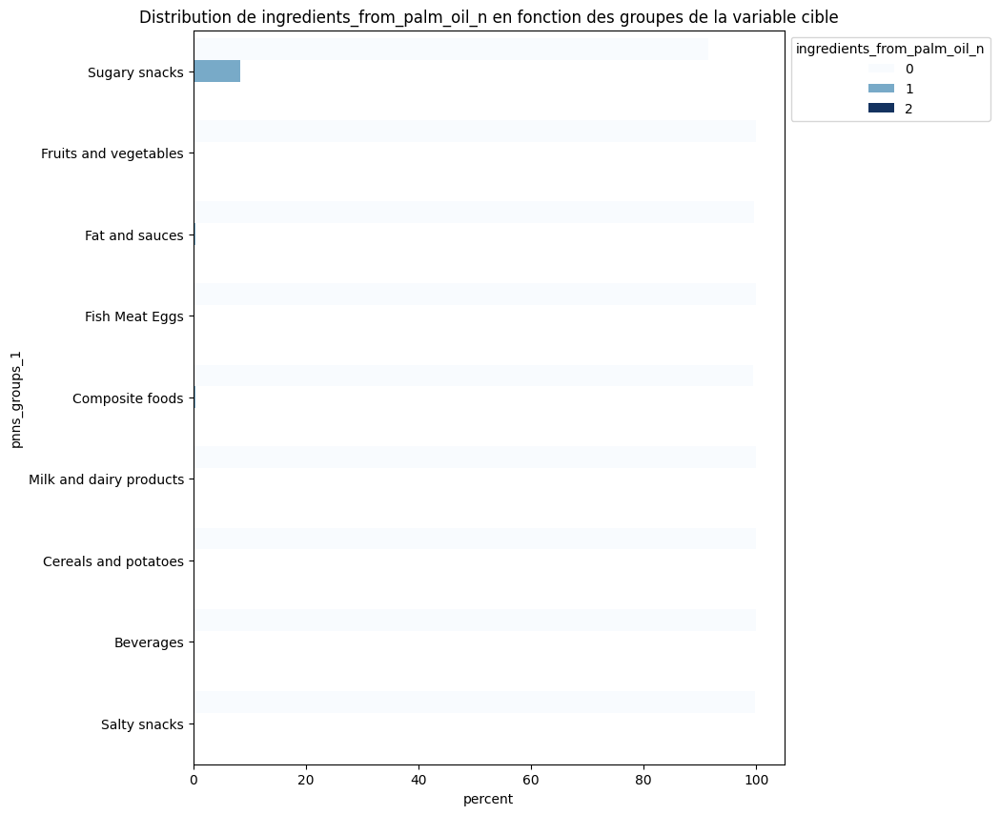

In [94]:
countplot_cible_vs_explic(Data_Food, Data_Food4, 'ingredients_from_palm_oil_n', 'Blues')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'ingredients_from_palm_oil_n')

Kolmogorov-Smirnov test: Sugary snacks : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Fruits and vegetables : stat = 0.500, p-value = 0.0
Shapiro test : Fat and sauces : stat = 0.032, p-value = 1.4489687689809536e-93
Kolmogorov-Smirnov test: Fish Meat Eggs : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Composite foods : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Milk and dairy products : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Cereals and potatoes : stat = 0.500, p-value = 0.0
Kolmogorov-Smirnov test: Beverages : stat = 0.500, p-value = 0.0
Shapiro test : Salty snacks : stat = 0.013, p-value = 3.63970437380287e-79

9 groupes ne suivent pas une loi normale. On ne peut pas faire une ANOVA 
----------------------------------------------------------------------

Statistique de Levene : 223.647, p-value : 0.0
Les variances ne sont pas homogènes, on ne peut pas faire une ANOVA
----------------------------------------------------------------------

Stati

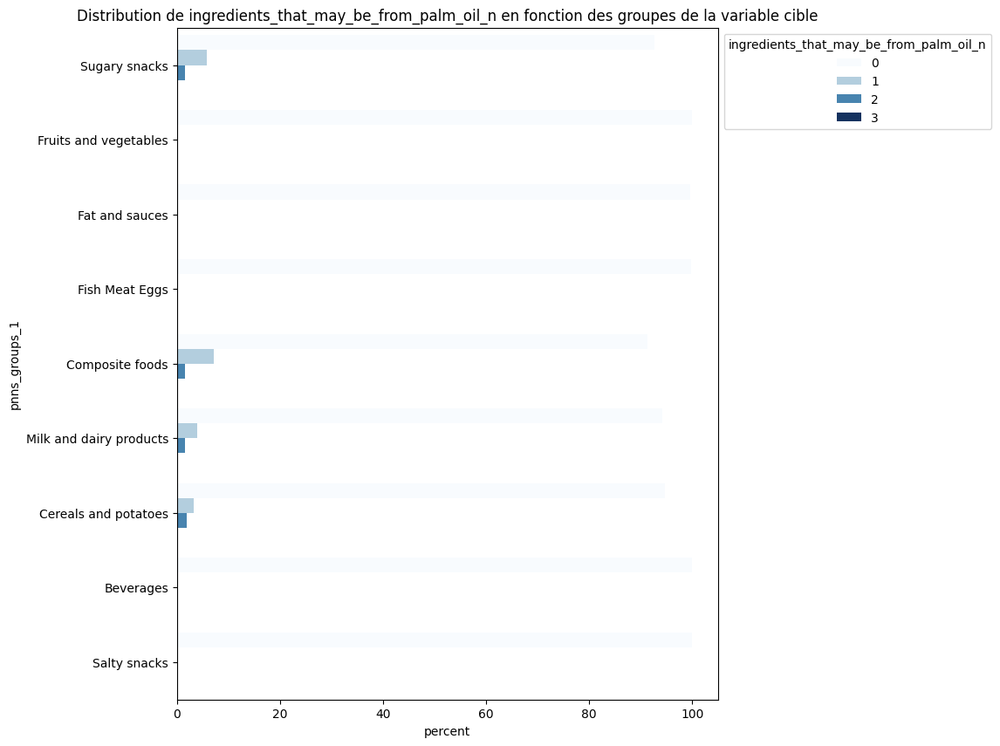

In [95]:
countplot_cible_vs_explic(Data_Food, Data_Food4, 'ingredients_that_may_be_from_palm_oil_n', 'Blues')
analyse_lien_cible_explic(Data_Food, Data_Food4, 'ingredients_that_may_be_from_palm_oil_n')

On peut remarquer des différences plus ou moins forte de distributions entre les différents groupes de la variable cibles pour chacune des variables nutritives analysées. 
- Par exemple, on peut remarquer que les viandes, poissons et oeuf, ont des quantité de protéines plus élevées que les autres groupes et que les groupes fruits et légumes, graisses et sauces ainsi que les boissons ont des quantité de protéines plus faibles. Certaines catégories ont une quantité de protéines plus variables comme c'est le cas des produits laitiers et des snacks salés.
- De même, les snacks sucrées sont comme attendus sont des produits beaucoup plus sucrés que les autres catégories de produits. 
- Concernant les fibres on en retrouve plus dans les snacks salés et dans les pommes de terre et céréales alors qu'on en retrouve très peu dans les produits laitiers et dans les boissons.
- Les variables représentants la quantité de sel et de sodium se distribue de façon similaire entre les différentes catégories de produits avec les boissons correspondant à une catégorie particulièrement peu salée par rapport aux autres catégories.
- De même les variables représentants la quantité de graisse et de graisses saturées ont également une distribution similaire. Nous observons que les snacks sucrés, les graisses et les sauces ainsi que les produits laitiers apparaissent plus riches en graisse que les autres catégories de produits. On remarque tout de même que la teneur en graisse semble plus variable dans les graisses et les sauces que la teneur en graisse saturée. 
- Des différences de distributions sont égalements observés quand on analyse les variables correspondant à l'énergie, et au score de nutrition.
- Concernant le nombre d'ingrédient dérivant d'huile de palme on note des catégories de produits qui en contiennent (snack sucrés, nourriture transformée, et pomme de terre et céréales) et des catégories qui n'en contiennent pas. 

De plus l’ensemble des tests statistiques réalisés ont révélé une association significative entre la variable cible et chacune des variables numériques testées. Cela signifie que pour chaque variable au moins deux groupes diffèrent de manière  significative. Ces tests confirment ce qui a été observés sur les représentations graphiques.

Toutefois, les tailles d'effet calculées pour les variables ingredients_from_palm_oil_n et ingredients_that_may_be_from_palm_oil_n sont plus faible ce qui suggère que, bien que la différence soit statistiquement significative, ces variables auront un pouvoir prédictif probablement plus faible que les autres variables.

Les résultats détaillés des comparaisons pour chaque paire de groupes peuvent être visualisés afin d'identifier les groupes qui diffèrent le plus.

In [96]:
# Appel de la fonction d'analyse
pairwise_analyses(Data_Food, Data_Food4, 'proteins_100g', 15)

,Group 1,Mean_Group1,Group 2,Mean_Group2,U-stat,p-value,Taille d'effet (r),p-corr
24,Fish Meat Eggs,17.963196,Beverages,0.407080,59480247.5,0.000000e+00,0.998763,0.000000e+00
33,Cereals and potatoes,9.929873,Beverages,0.407080,63798066.5,0.000000e+00,0.995756,0.000000e+00
28,Composite foods,7.043126,Beverages,0.407080,51364973.5,0.000000e+00,0.985900,0.000000e+00
31,Milk and dairy products,9.911842,Beverages,0.407080,64686324.0,0.000000e+00,0.983064,0.000000e+00
21,Fish Meat Eggs,17.963196,Composite foods,7.043126,44581181.5,0.000000e+00,0.931105,0.000000e+00
6,Sugary snacks,5.171856,Beverages,0.407080,86810371.0,0.000000e+00,0.902494,0.000000e+00
13,Fruits and vegetables,2.038768,Beverages,0.407080,46057624.5,0.000000e+00,0.895375,0.000000e+00
23,Fish Meat Eggs,17.963196,Cereals and potatoes,9.929873,50873453.5,0.000000e+00,0.864009,0.000000e+00
1,Sugary snacks,5.171856,Fat and sauces,1.502627,45706608.0,0.000000e+00,0.809725,0.000000e+00
25,Fish Meat Eggs,17.963196,Salty snacks,10.494016,15761640.0,0.000000e+00,0.806407,0.000000e+00


## Analyse corélation variable explicatives

Une autre étape d'analyse importante est l'analyse de la corrélation entre les différentes variables numériques retenues pour la prédiction des valeurs de la variable cible. En effet, il faut éviter d'inclure dans les modèles d'apprentissage des varaibles fortement corrélées entre elles afin de ne pas accorder plus de poids qu'il ne faudrait à certaines informations.

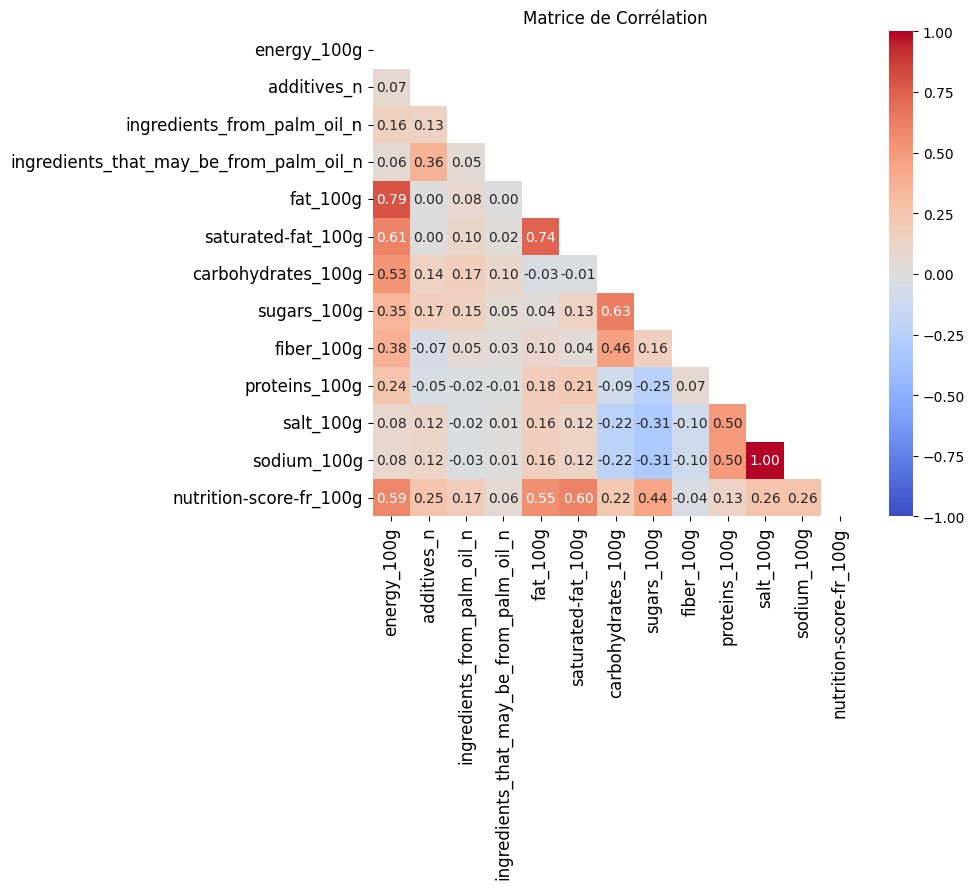

In [97]:
# Création d'une liste contenant les variables à analyser
Selected_Features= ['energy_100g','additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n',
       'fat_100g', 'saturated-fat_100g', 'carbohydrates_100g',
       'sugars_100g', 'fiber_100g', 'proteins_100g', 'salt_100g',
       'sodium_100g', 'nutrition-score-fr_100g']

# Normalisation des données
scaler = RobustScaler()
X_scaled = scaler.fit_transform(Data_Food4[Selected_Features])

# Conversion de la matrice en Dataframe
Data_Food4_corr_matrice = pd.DataFrame(X_scaled, columns=Selected_Features)

# Construction d'une matrice de corrélation des variables
corr_matrix =Data_Food4_corr_matrice.corr()

# Définition d'un mask pour n'affiquer que la diagonal inférieur de la matrice de corrélation
mask = np.triu(np.ones_like(corr_matrix, dtype=bool))

# Construction d'une heatmap représentant les corrélations des différents indicateurs
plt.figure(figsize=(10, 9))
sns.heatmap(corr_matrix, annot=True, mask=mask, cmap='coolwarm', fmt='.2f',  vmin=-1, vmax=1)
plt.title('Matrice de Corrélation')
plt.yticks(fontsize=12)
plt.xticks(rotation=90, fontsize=12)
plt.tight_layout()
plt.savefig('../Output/Correlation/Correlation map.png', format='png')
plt.show()

La matrice de corrélation montre une forte corrélation entre 
- la teneur en graisse saturée et la teneur en graisse
- la teneur en graisse et l'énergy
- la teneur en sodium et la teneur en sel

Pour chaque paire de variables corrélées seule une sera conservée pour la mise en place d'un futur modèle d'apprentissage.

Les tests statistiques ont mis en évidence des associations significatives entre plusieurs variables nutritionnelles et la variable cible. Ces résultats suggèrent que les variables nutritives peuvent être pertinentes pour prédire les valeurs manquantes de la variable cible.
On peut maintenant réaliser une Analyse en Composantes Principales (ACP) afin de réduire la dimensionnalité du jeu de données, tout en conservant un maximum d'information. Cela permettra notamment de visualiser la structure globale des données et d'examiner si les différentes modalités de la variable cible peuvent être séparées de manière distincte dans l'espace des composantes principales.

# Analyse multivariée

## ACP

### Fonctions pour faire la PCA et les différents graphiques

In [98]:
def pca_analysis(df, df_brute, features, N_components):
    
    """
    Réalise une analyse en composantes principales (ACP) sur un jeu de données donné, 
    en intégrant des informations complémentaires issues d'un autre DataFrame, 
    puis génère un graphique d'éboulis et retourne les résultats de l'ACP.

    Paramètres
     - df (pandas.DataFrame): dataFrame contenant les données numériques à analyser par PCA, incluant une colonne 'code' 
        pour l'association avec les données brutes.
     - df_brute (pandas.DataFrame):DataFrame initiale contenant au moins les colonnes 'code' et 'pnns_groups_1', 
        permettant de joindre la variable cible au jeu de données à analyser.
     - features (list of str): Liste des noms des colonnes numériques à utiliser pour la PCA.
     - N_components (int): Nombre de composantes principales à extraire.

    Sortie
     - res_df (pandas.DataFrame): DataFrame contenant les coordonnées des observations sur les composantes principales, 
        ainsi que les colonnes 'product_name' et 'pnns_groups_1'.
     - pca_df (pandas.DataFrame):DataFrame des composantes principales, décrivant la contribution linéaire de chaque variable 
        d'origine aux composantes principales.
     - pca (sklearn.decomposition.PCA): Objet PCA ajusté, permettant un accès à des informations supplémentaires sur l'analyse.
    """
    
    # Isolation de la variable cible et du code produit pour joindre la variable cible au jeu de données final
    Df_info = df_brute[['code', 'pnns_groups_1']]
    Df_analyse = pd.merge(df, Df_info, on='code', how='left')

    # Sélection des variables
    Df_analyse = Df_analyse[features + ['pnns_groups_1', 'product_name']]

    # Suppression des éventuelles lignes incomplètes
    Df_analyse = Df_analyse.dropna()

    # Extraction des données et des groupes
    X = Df_analyse[features].values
    y = Df_analyse['pnns_groups_1'].values
    Nom = Df_analyse['product_name'].values

    # Normalisation des données
    scaler =StandardScaler()
    X_scaled = scaler.fit_transform(X)

    # PCA
    pca = PCA(n_components=N_components)
    X_pca = pca.fit_transform(X_scaled)

    # Construction du graphique des éboulis des valeurs propres
    composante_var = (pca.explained_variance_ratio_ * 100).round()
    composante_var_cum = composante_var.cumsum()

    plt.bar(range(1, N_components + 1), composante_var)
    plt.plot(range(1, N_components + 1), composante_var_cum, color="red", marker="o")
    plt.xlabel("Composante principale")
    plt.ylabel("Pourcentage d'inertie")
    plt.title("Éboulis des valeurs propres")
    plt.savefig(f'../Output/PCA/Graphique_des_éboulis.png', format='png')
    plt.show()

    # Tableau avec les valeurs des produits pour les nouvelles composantes principales
    res_df = pd.DataFrame(X_pca, columns=[f"PC{i}" for i in range(1, N_components + 1)])
    res_df['product_name'] = Nom
    res_df['pnns_groups_1'] = y
    
    # Tableau décrivant les relations linéaires entre les composantes principales et les variables d'origine
    pca_df = pd.DataFrame(pca.components_)
    pca_df.columns = Selected_Features
    pca_df.index = [f"PC{i}" for i in range(1, 9+1)]
    pca_df.round(2)

    return res_df, pca_df, pca

In [99]:
def correlation_graph(pca, x_y, features) : 
    
    """
    Affiche un graphique matplotlib représentant le cercle des corrélations des variables avec 
    les deux composantes principales sélectionnées. Chaque variable est représentée par une flèche 
    pointant vers ses coordonnées dans l'espace des composantes, avec un label à côté.
    
    Paramètres
     - pca (sklearn.decomposition.PCA): Objet PCA préalablement ajusté, contenant les composantes principales et la variance expliquée.
     - x_y (tuple of int): Tuple contenant les indices (x, y) des deux composantes principales à visualiser.
     - features (list of str): Liste des noms des variables d'origine correspondant aux composantes principales.

    """
            
    # Extraction de x et y 
    x,y=x_y
    
    # Stockage de l'information de la variance expliquée
    x_var = round(100*pca.explained_variance_ratio_[x],1)
    y_var = round(100*pca.explained_variance_ratio_[y],1)

    # Taille de l'image 
    fig, ax = plt.subplots(figsize=(10, 9))

    # Pour chaque composante : 
    for i in range(0, pca.components_.shape[1]):

        # Création de flèche
        ax.arrow(0,0, 
                pca.components_[x, i],  
                pca.components_[y, i],  
                head_width=0.07,
                head_length=0.07, 
                width=0.02, )

        # Affichage des labels
        plt.text(pca.components_[x, i] + 0.05,
                pca.components_[y, i] + 0.05,
                features[i])
        
    # Affichage des lignes horizontales et verticales
    plt.plot([-1, 1], [0, 0], color='grey', ls='--')
    plt.plot([0, 0], [-1, 1], color='grey', ls='--')


    # Nom des axes, avec le pourcentage d'inertie expliqué
    plt.xlabel(f'PC{x+1} ({x_var}%)')
    plt.ylabel(f'PC{y+1} ({y_var}%)')

    # Titre
    plt.title(f"Cercle des corrélations (PC{x+1} et PC{y+1})")

    # Création du cercle 
    an = np.linspace(0, 2 * np.pi, 100)
    plt.plot(np.cos(an), np.sin(an))  

    # Axes et display
    plt.axis('equal')
    
    plt.savefig(f'../Output/PCA/Cercle_correlation_{x_y}.png', format='png')
    plt.show(block=False)


In [100]:
def proj_individu(Data_pca, x_y, composante1, composante2, pca) :
    
    """
    Affiche la projection des individus (observations) dans le plan défini par deux composantes principales issues d'une analyse PCA,
    avec coloration selon les groupes définis par la variable 'pnns_groups_1'.

    Paramètres
     - Data_pca (pandas.DataFrame): DataFrame contenant les coordonnées des individus sur les composantes principales, ainsi que la colonne 'pnns_groups_1' indiquant le groupe de chaque individu.
     - x_y (tuple of int): Indices (x, y) des composantes principales à visualiser (ex : (0, 1) pour PC1 et PC2).
     - composante1 (str): Nom de la colonne dans Data_pca correspondant à la première composante principale (ex : 'PC1').
     - composante2 (str): Nom de la colonne dans Data_pca correspondant à la deuxième composante principale (ex : 'PC2').
     - pca (sklearn.decomposition.PCA): Objet PCA ajusté, utilisé pour extraire les pourcentages de variance expliquée par chaque composante.
    """
    
    # Extrait x et y 
    x,y=x_y
    
    # Stockage de l'information de la variance expliquée
    x_var = round(100*pca.explained_variance_ratio_[x],1)
    y_var = round(100*pca.explained_variance_ratio_[y],1)
    
    # représentation grpahique des produits en fonction des composantes principales
    plt.figure(figsize=(10, 10))
    sns.scatterplot(data=Data_pca, x=composante1, y=composante2, hue="pnns_groups_1",  alpha=0.7, palette=color_mapping)
    plt.title("Projection PCA des données")
    plt.xlabel(f'PC{x+1} ({x_var}%)')
    plt.ylabel(f'PC{y+1} ({y_var}%)')
    plt.axvline(x=0, color='black', linestyle='--')
    plt.axhline(y=0, color='black', linestyle='--')
    plt.legend(title="pnns_group1", bbox_to_anchor=(1, 1.01), loc="upper left")
    plt.savefig(f'../Output/PCA/Projection{x_y}.png', format='png')
    plt.show()

### Visualisation des résultats de la PCA

In [101]:
# Création d'une liste contenant les variables à analyser
Selected_Features= ['additives_n', 'ingredients_from_palm_oil_n',
       'ingredients_that_may_be_from_palm_oil_n',
       'fat_100g',  'carbohydrates_100g',
       'sugars_100g', 'proteins_100g', 'salt_100g',
       'nutrition-score-fr_100g']

In [102]:
# Création d'un dictionnaire contenant les correspondance entre les catéogies de la variable cible et les couleurs
color_mapping = {'Sugary snacks': 'blue',
 'Fat and sauces': 'pink',
 'Fish Meat Eggs': 'red',
 'Fruits and vegetables': 'green',
 'Composite foods': 'purple',
 'Milk and dairy products': 'greenyellow',
 'Beverages': 'yellow',
 'Salty snacks': 'cyan',
 'Cereals and potatoes': 'orange'}

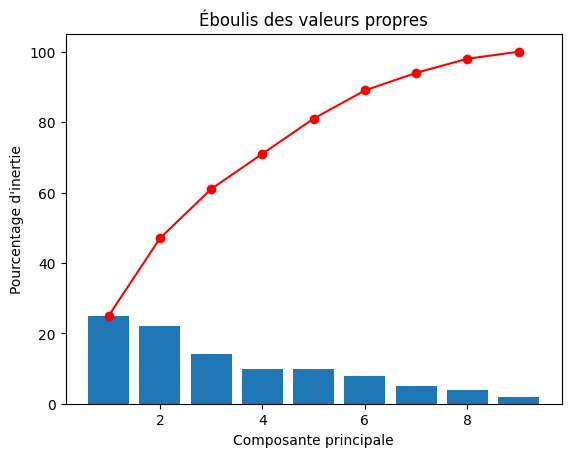

In [103]:
# Appel de la fonction réalisant la PCA et affichant le graph d'ébouli
Data_Food_PCA, PCA_df, PCA_res = pca_analysis(Data_Food4, Data_Food, Selected_Features, 9)

Le graphique des éboulis des valeurs propres montre que les quatre premières composantes principales expliquent à elles seules environ 70 % de la variance totale du jeu de données. On peut visualiser le cercle des corrélation pour mieux comprendre ce que représentes les différentes composante princpales.

In [104]:
# Affichage de la dataframe contenant les composantes principales
PCA_df

,additives_n,ingredients_from_palm_oil_n,ingredients_that_may_be_from_palm_oil_n,fat_100g,carbohydrates_100g,sugars_100g,proteins_100g,salt_100g,nutrition-score-fr_100g
PC1,0.294468,0.252626,0.181998,0.163127,0.490252,0.563920,-0.167889,-0.163849,0.419939
PC2,0.149724,0.068002,0.068028,0.449078,-0.150401,-0.148115,0.480604,0.551753,0.432076
PC3,0.589046,0.011936,0.666816,-0.334871,-0.074718,-0.180530,-0.009971,0.128202,-0.203448
PC4,-0.037189,0.932038,-0.172971,-0.196177,0.016332,-0.124735,0.127809,0.061184,-0.160041
PC5,0.093502,0.221858,0.123691,0.484701,-0.512645,-0.212354,-0.539538,-0.281132,0.117329
PC6,-0.524522,0.087788,0.616548,0.285888,0.186777,-0.080154,0.316232,-0.295848,-0.162687
PC7,-0.501793,0.063229,0.292639,-0.278842,-0.092083,0.150684,-0.448255,0.542607,0.232973
PC8,0.058888,-0.028973,-0.080991,0.345693,0.609661,-0.409690,-0.363487,0.326093,-0.302718
PC9,0.058165,0.030874,0.007657,0.327370,-0.230926,0.608140,0.015465,0.284998,-0.619523


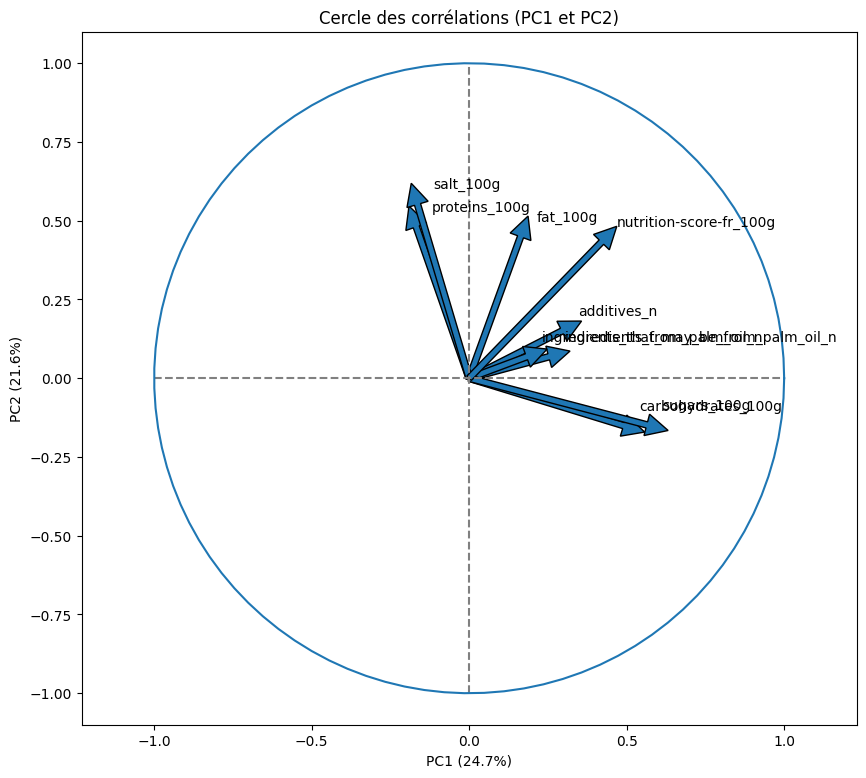

In [105]:
# Appel de la fonction construisant le cercle de corrélation
correlation_graph(PCA_res, (0,1), Selected_Features)

- La première composante reflète principalement la teneur en glucide (carbohydrate et sucre) des produits
- La deuxième composante reflète la teneur en sel, la teneur en graisse, la teneur en protéine et le Nutri Score

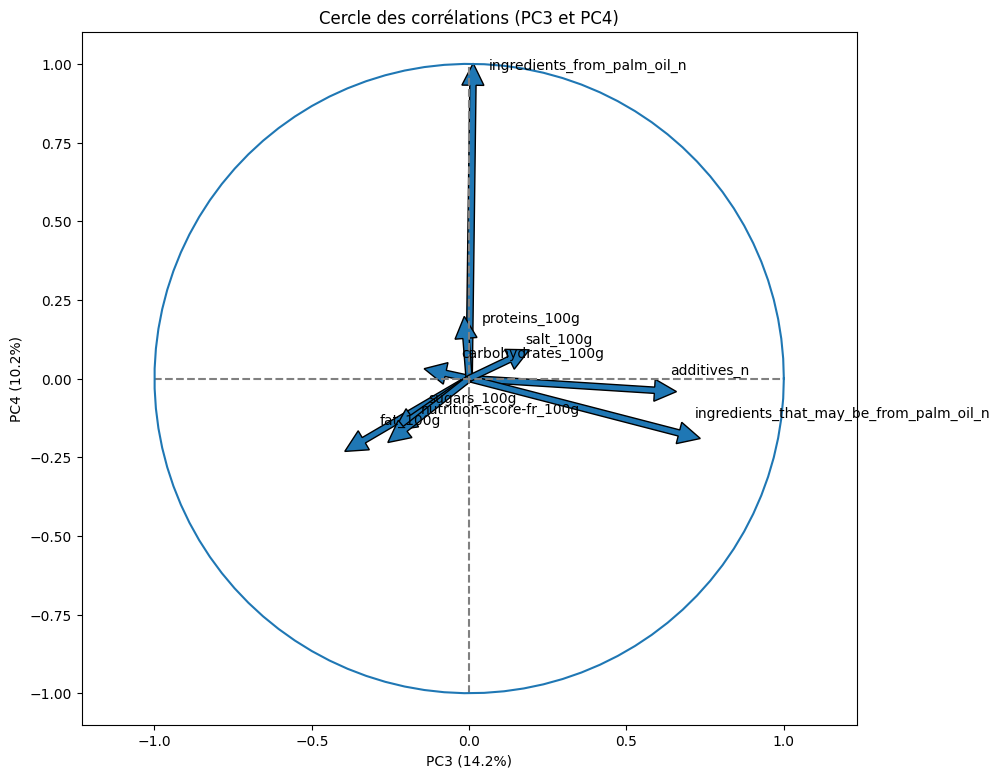

In [106]:
# Appel de la fonction construisant le cercle de corrélation
correlation_graph(PCA_res, (2,3), Selected_Features)

- La troisième composante reflète principalement le nombre d'additif et le nombre d'ingrédients pouvant dérivés d'huile de palme.
- La quatrième composante reflète le nombre d'ingrédients dérivant d'huile de palme

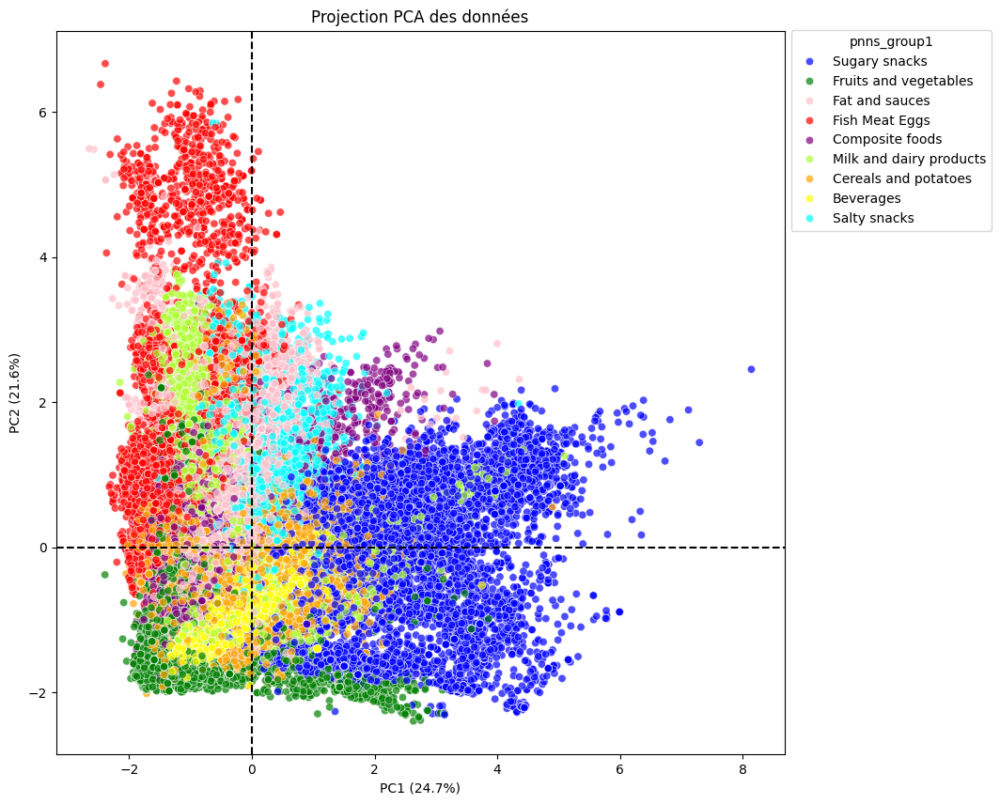

In [107]:
# Appel de la fonction construisant la projection des observations sur les 2 premières composantes
proj_individu(Data_Food_PCA, (0,1), "PC1", "PC2", PCA_res)

On observe que les produits sont globalement regroupés selon leur type.

Cependant, la catégorie Graisses et sauces semble se diviser en deux sous-groupes distincts, séparés sur l'axe de la composante principale F1. Cette séparation suggère une hétérogénéité au sein de cette catégorie qu'on pourrait explorer plus en détail en analysant la nature des produits dans chacun de ces sous-groupes.

On note également que certains groupes apparaissent bien distincts les uns des autres, notamment les Snacks sucrés et les Fruits et légumes, qui forment des groupes bien identifiables. À l’inverse, d'autres catégories montrent un chevauchement, comme les Boissons avec les Céréales et pommes de terre, ou encore les Viandes, poissons et œufs  avec les Produits laitiers. Dans ce dernier cas, une variable discriminante comme la teneur en calcium pourrait permettre de mieux différencier les deux groupes, les produits laitiers étant généralement plus riches en calcium que les viandes, poissons et œufs.

In [108]:
Data_Food_PCA[(Data_Food_PCA['pnns_groups_1']=='Fat and sauces')].sort_values('PC1', ascending=False).head(10)[['PC1', 'product_name']]

,PC1,product_name
6467,4.358317,Primevère Tartine Doux
18843,3.999820,Matière grasse à cuire et à tartiner spécial c...
55270,3.816147,Le Fleurier Doux
7612,3.759009,Primevère Tartine & Cuisson
15528,3.666948,Tournesol Allégée
18841,3.446566,Le Plaisir & La Cuisine Tartine et Cuisson au ...
25422,3.331112,Oméga 3 Doux
48243,3.224682,Graisse végétale
12675,3.196716,riche en Oméga 3 (Tartine & Cuisson) - (54% MG)
16002,3.162762,Tournesol Tartine Et Cuisson


In [109]:
Data_Food_PCA[(Data_Food_PCA['pnns_groups_1']=='Fat and sauces')].sort_values('PC1').head(10)[['PC1', 'product_name']]

,PC1,product_name
45435,-2.651203,Tamari sauce soja 25% less salt
39916,-2.574108,Sauce soja sucrée
51214,-2.383915,Sauce Soja
51215,-2.382706,Sauce Soja à teneur en sel réduite
62760,-2.269815,Pâte de curry rouge
51216,-2.244909,Soy sauce less salt
36603,-2.168084,Moutarde de Dijon
51221,-2.064117,Sauce soja
51220,-2.064117,Sauce soja sucrée Kikkoman
51217,-2.063824,Salsa de soja - Tamari &quot;Kikkoman&quot; de...


L'analyse des aliments de la catéogie graisse et sauce en identifiant les produits les plus à gauche sur la première composante et les produits les plus à droite sur la première composante montre que le premier groupe correspondrait aux graisses et que le second correspondrait au sauce ce qui n'est finalement pas surprenant car les sauces sont en générale plus sucrées que les graisses.

Pour finir cette analyse on va visualiser comment se répartissent nos produits dans une représentation en 3 dimensions en ajoutant comme troisième axe, la troisième composante princpale construite par l'ACP

In [110]:
# Création d'une représentation en 3D pour visualiser les 3 première composantes 
fig = px.scatter_3d(
    Data_Food_PCA,
    x="PC1", y="PC2", z="PC3",
    color="pnns_groups_1",  
    color_discrete_map=color_mapping,
    title="Projection PCA interactive en 3D",
    opacity=0.6,
    width=900,
    height=700)

# Augmentation de la taille des points
fig.update_traces(marker=dict(size=3))  

# Augmentation de la taille de la légende
fig.update_layout(
    legend=dict(
        font=dict(size=14),  
        itemsizing='constant' ))

fig.show()

La visualisation en trois dimensions des produits projetés sur les 3 composantes principales permet de mieux distinguer certains groupes de produits.   

Les trois composantes utilisées ici ont été construites à partir des variables numériques d'origine et permettent de regrouper les produits de manière cohérente selon les catégories de la variable cible, ce qui montre que ces composantes capturent bien les différences entre les produits et que les variables selectionnées pour prédire les valeurs manquantes de la variable cible  peuvent être utiles pour estimer de manière fiable les catégories manquantes de la variable cible, en se basant sur la similarité avec d’autres produits bien renseignés.

Cette transformation des variables numériques d'origine en 3 ou 4 composantes pourra être utilisée afin de prédire les valeurs manquantes de la variable cible.

# Conclusion et rapport d'exploration

L’analyse exploratoire, complétée par les étapes de nettoyage, a permis de mieux comprendre la structure du jeu de données et d’évaluer la qualité des variables disponibles. Les tests statistiques menés visant à quantifier les liens entre les variables prédictives et la variable cible, ont mis en évidence plusieurs relations forte et significatives, renforçant l’hypothèse d’un lien pertinent entre ces variables. De plus, les représentations graphiques issues de l’analyse en composantes principales ont révélé une organisation cohérente des produits selon les groupes définis par la variable cible. Ces différents éléments suggèrent que les variables sélectionnées disposent d’un pouvoir discriminant suffisant pour envisager une prédiction fiable des valeurs manquantes de la variable cible. Le projet visant à mettre en place un système de suggestion ou d'autocomplétion de certaines variables de la base d'OpenFoodFact semble donc réalisable, sous réserve de sélectionner un modèle approprié et d’évaluer ses performances de manière rigoureuse.  

L’ensemble du traitement des données réalisé ici s’est inscrit dans le respect des principes fondamentaux du RGPD. Seules les données strictement nécessaires à l’analyse ont été utilisées, conformément au principe de minimisation, dans un objectif clairement défini. Le traitement a été effectué de manière transparente, avec une attention particulière portée à la qualité et à la pertinence des informations. Par ailleurs, des mesures de sécurité adaptées seront mises en œuvre, en coordination avec les services compétents, afin d’assurer l’intégrité des données tout au long du projet.